In [14]:
import sys 
import os
import numpy as np
np.set_printoptions(threshold=sys.maxsize)
%matplotlib widget
import matplotlib as mpl
import matplotlib.pyplot as plt 
import matplotlib.colors as mcolors
from mpl_toolkits.mplot3d import Axes3D
import astropy.constants as c
import astropy.units as u
from astropy.io import fits
from IPython.display import display
import logging
from pathlib import Path
from datetime import datetime
import pyregion
from astropy.wcs import WCS
from astropy.visualization.wcsaxes import WCSAxes
from astropy.coordinates import SkyCoord
import importlib
import pickle
import pandas as pd
try:
    logging.getLogger('matplotlib').disabled = True
except:
    pass
import pandas as pd
pd.pandas.set_option('display.max_columns', None)
pd.pandas.set_option('display.max_rows', None)
import shutil
from astropy.table import QTable, Table
from matplotlib.patches import (Ellipse, Rectangle)
import matplotlib.patches as mpatches
import itertools
import shapely
import shapely.plotting
from shapely.geometry.point import Point
from shapely import affinity
from scipy.integrate import dblquad
from uncertainties import ufloat
from scipy.optimize import curve_fit
from astropy.visualization import (
    MinMaxInterval, 
    SqrtStretch,
    ImageNormalize,
    simple_norm
)
from astropy import visualization
import matplotlib.cm as cm
from pprint import pprint
import pylustrator
from astropy.stats import sigma_clipped_stats
from astropy.modeling import models
from astropy.convolution.kernels import CustomKernel
from astropy.stats import gaussian_fwhm_to_sigma
from photutils.utils._parameters import as_pair
from astropy.convolution import discretize_model

In [2]:
ROOT_DIR = os.path.dirname(os.path.realpath('__file__'))
PROG_DIR = '/Users/astqx/Desktop/DREAMS/mirar'
os.chdir(PROG_DIR)

In [3]:
class Fits:
    def __init__(self, file, print_=True):
        self.file = file
        self.data = {}
        self.header = {}
        open_file = fits.open(self.file)
        if print_:
            open_file.info()
        open_file.close()
        self.read()
        try:
            logging.getLogger("matplotlib").disabled = True
        except:
            pass

    def read(self, hdu=0):
        open_file = fits.open(self.file)
        try:
            self.data[hdu] = open_file[hdu].data.astype(float)
        except (AttributeError, TypeError, ValueError):
            print(rf"HDU {hdu} is not float")
            self.data[hdu] = open_file[hdu].data

        self.header[hdu] = open_file[hdu].header
        open_file.close()

    def wcs_plot(self, hdu=0):
        wcs = WCS(self.header[hdu])
        fig = plt.figure(clear=True)
        ax = plt.subplot(projection=wcs)
        fig.add_axes(ax)
        return fig, ax

    def create_copy(self):
        shutil.copy2(self.file, f"{self.file}.copy")

    def image(
        self,
        hdu=0,
        column=False,
        title=None,
        scale=[5, 95],
        save=False,
        tag=None,
        wcs=False,
        median=True,
        meanstd=True,
    ):
        data = self.data[hdu]
        if column:
            data = data[column]
        if not wcs:
            fig, ax = plt.subplots()
            ax.set_xlabel("x pixel")
            ax.set_ylabel("y pixel")
        else:
            wcs_ = WCS(self.header[hdu])
            fig = plt.figure(clear=True)
            ax = plt.subplot(projection=wcs_)
            fig.add_axes(ax)
        self.ax = ax
        if not meanstd and scale:
            try:
                if median:
                    img = np.nanmedian(data, axis=1)
                else:
                    img = data
            except np.AxisError:
                print("invalid shape", data.shape)
                return
            self.scale_low, self.scale_high = np.percentile(img, scale)
            im = ax.imshow(
                data, cmap="magma", vmin=self.scale_low, vmax=self.scale_high
            )
        elif meanstd:
            mean, std = np.nanmean(data), np.nanstd(data)
            vmin = mean - std
            vmax = mean + 10 * std
            im = ax.imshow(
                data,
                interpolation="nearest",
                cmap="grey",
                vmin=vmin,
                vmax=vmax,
                origin="lower",
                # norm=mcolors.Normalize(vmin=vmin,vmax=vmax)
            )
        else:
            im = ax.imshow(data, cmap="magma")
        fig.colorbar(im, ax=ax , pad=0.005)
        if not title:
            title = rf"{os.path.basename(os.path.dirname(self.file))}/{os.path.basename(self.file)}"
        ax.set_title(title)
        if save:
            if tag:
                fig.savefig(
                    os.path.join(
                        os.path.dirname(self.file),
                        rf"{os.path.basename(self.file)}_{tag}.png",
                    ),
                    dpi=600,
                )
            else:
                fig.savefig(
                    os.path.join(
                        os.path.dirname(self.file),
                        rf"{os.path.basename(self.file)}.png",
                    ),
                    dpi=600,
                )
        fig.tight_layout()
        return ax

    def image_with_reg(
        self, reg, hdu=0, wcsaxis=[0.1, 0.1, 0.8, 0.8], v=[0, 100], save=False, tag=None
    ):
        r = pyregion.open(reg).as_imagecoord(self.header[hdu])
        patch_list, artist_list = r.get_mpl_patches_texts()
        wcs = WCS(self.header[hdu])
        fig = plt.figure(clear=True)
        ax = plt.subplot(projection=wcs)
        # ax = WCSAxes(fig,wcsaxis,wcs=wcs)
        fig.add_axes(ax)
        for p in patch_list:
            p.set_color("red")
            p.set_facecolor("none")
            ax.add_patch(p)
        for t in artist_list:
            ax.add_artist(t)

        if v:
            im = ax.imshow(
                self.data[0], origin="lower", vmin=v[0], vmax=v[1], cmap="magma"
            )
        else:
            im = ax.imshow(self.data[0], origin="lower", cmap="magma")
        fig.colorbar(im, cmap="magma")
        if save:
            if tag:
                fig.savefig(
                    os.path.join(
                        os.path.dirname(self.file),
                        rf"{os.path.basename(self.file)}_{tag}.reg.png",
                    ),
                    dpi=600,
                )
            else:
                fig.savefig(
                    os.path.join(
                        os.path.dirname(self.file),
                        rf"{os.path.basename(self.file)}.reg.png",
                    ),
                    dpi=600,
                )
        # fig.show()
        return ax

    def bin_table(self, hdu=0, return_=True, save=False):
        df = pd.DataFrame(self.data[hdu])
        if save:
            df.to_csv(
                os.path.join(
                    os.path.dirname(self.file), rf"{os.path.basename(self.file)}.csv"
                ),
                encoding="utf-8",
            )
        if return_:
            return df
        else:
            return None

    def bin_table2(self, hdu=0):
        table = QTable(self.data[hdu])
        return table

    def mark_from_cat(self, keys, cat_file=None, cat_table=None, hdu=2, save=False, color='red'):
        x_offset = 2
        y_offset = 2
        if cat_file:
            catfits = Fits(cat_file)
            catfits.read(hdu)
            cat = catfits.bin_table2(hdu)
        elif isinstance(cat_table,QTable) or isinstance(cat_table,pd.DataFrame):
            cat = cat_table
        else:
            return
        shape = (self.ax.get_xlim()[-1], self.ax.get_ylim()[-1])
        for i, (x, y, a, b, theta) in enumerate(
            zip(
                cat[keys["x"]],
                cat[keys["y"]],
                cat[keys["a"]],
                cat[keys["b"]],
                cat[keys["angle"]],
            )
        ):
            marker = Ellipse(xy=(x,y), height=a, width=b, angle=theta-90, color=color, fill=None) # theta-90 to rotate wrt. x
            self.ax.add_patch(marker)
            annotation = str(i)
            try:
                if 'NUMBER' in list(cat.columns):
                    annotation = cat['NUMBER'][i]
            except:
                print('could not access column names')
            if x + x_offset >= shape[0] - x_offset * 2:
                self.ax.annotate(
                    annotation, (x - x_offset*2, y + y_offset), color=color
                )
            else:
                self.ax.annotate(annotation, (x + x_offset, y + y_offset), color=color)
        if save:
            plt.savefig(cat_file+'.png',dpi=300)

SEX_SRC_KEYS = {
    'x': 'X_IMAGE',
    'y': 'Y_IMAGE',
    'a': 'A_IMAGE',
    'b': 'B_IMAGE',
    'angle': 'THETA_IMAGE'
}

MIRAR_SRC_KEYS = {
    'x': 'xpos',
    'y': 'ypos',
    'a': 'aimage',
    'b': 'bimage',
    'angle': 'THETA_IMAGE'
}

PSF_PHOT_SRC_KEYS = {
    'x': 'x_fit',
    'y': 'y_fit',
    'a': 'a',
    'b': 'b',
    'angle': 'angle'
}

class MakeFits:
    def __init__(self, data, filename, obsclass="science", **kwargs):
        self.data = data
        self.filename = filename
        self.obsclass = obsclass

        hdu0 = fits.PrimaryHDU(data)
        self.hdul = fits.HDUList([hdu0])
        self.hdul.verify("fix")
        self.fix_header()
        self.save(**kwargs)

    def fix_header(self):
        header = self.hdul[0].header
        header[OBSCLASS_KEY] = self.obsclass
        header[TARGET_KEY] = self.obsclass
        header[TIME_KEY] = str(datetime.now())
        header[COADD_KEY] = 1
        header[GAIN_KEY] = 1
        header[PROC_HISTORY_KEY] = ""
        header[PROC_FAIL_KEY] = ""
        header[BASE_NAME_KEY] = Path(self.filename).name

    def save(self, **kwargs):
        self.hdul.writeto(self.filename, **kwargs)


def src_table(file, save=False, return_=True):
    df = pd.read_pickle(file).get_data()
    if save:
        df.to_csv(
            os.path.join(os.path.dirname(file), rf"{os.path.basename(file)}.csv"),
            encoding="utf-8",
        )
    if return_:
        return df
    else:
        return None


class Convert:
    def __init__(self, ra, dec):
        self.coords = SkyCoord(ra=ra * u.deg, dec=dec * u.deg)

    def get_coords(self):
        return self.coords

    def to_hms(self):
        return (self.coords.ra.hms, self.coords.dec.hms)

    def to_wcs(self):
        return (self.coords.ra.hms, self.coords.dec.dms)


def command(config, py=""):
    return rf"python{py} -m mirar -p {PIPELINE} -n {NIGHT} -c {config} -m"


def run(config, *args, **kwargs):
    os.system(command(config, *args, **kwargs))

def get_prams():
    return _ih[-1]

def save_prams(path):
    with open(path,'w') as file:
        file.write(get_prams())

def test(py=""):
    os.system(rf"python{py} -m unittest discover tests/")

def plot_image(ax,data,cmap='grey',scale=True,colorbar=True):
    mean, std = np.nanmean(data), np.nanstd(data)
    if scale:
        vmin = mean - std
        vmax = mean + 10 * std
    else:
        vmin = vmax = None
    im = ax.imshow(
        data,
        interpolation="nearest",
        cmap=cmap,
        vmin=vmin,
        vmax=vmax,
        origin="lower",
    )
    if colorbar:
        ax.get_figure().colorbar(im, ax=ax , pad=0.005)
    return im

def peek(ax,coords,size):
    ax.set_xlim([coords[0]-size//2,coords[0]+size//2])
    ax.set_ylim([coords[1]-size//2,coords[1]+size//2])
  
def get_pos(table,obj,keys):
    row = table[obj-1]
    x = row[keys['x']]
    y = row[keys['y']]
    return np.array([float(x),float(y)])

def mark_from_cat(ax, keys, cat_file=None, cat_table=None, hdu=2, save=False, color='red', condition=True,bound=False,bounds=None,annotate=True):
    x_offset = 2
    y_offset = 2
    if cat_file:
        catfits = Fits(cat_file)
        catfits.read(hdu)
        cat = catfits.bin_table2(hdu)
    elif isinstance(cat_table,QTable) or isinstance(cat_table,pd.DataFrame):
        cat = cat_table
    else:
        return
    shape = (ax.get_xlim()[-1], ax.get_ylim()[-1])
    
    pos_all = []
    for i, (x, y, a, b, theta) in enumerate(
        zip(
            cat[keys["x"]],
            cat[keys["y"]],
            cat[keys["a"]],
            cat[keys["b"]],
            cat[keys["angle"]],
        )
    ):
        if condition:
            if not bound or bound and (x>=bounds[0][0] and x<=bounds[0][1] and y>=bounds[1][0] and y<=bounds[1][1]):
                marker = Ellipse(xy=(x,y), height=a, width=b, angle=theta-90, color=color, fill=None) # theta-90 to rotate wrt. x
                ax.add_patch(marker)
                annotation = str(i)
                if annotate:
                    try:
                        if 'NUMBER' in list(cat.columns):
                            annotation = cat['NUMBER'][i]
                    except:
                        print('could not access column names')
                    if x + x_offset >= shape[0] - x_offset * 2:
                        ax.annotate(
                            annotation, (x - x_offset*2, y + y_offset), color=color
                        )
                    else:
                        ax.annotate(annotation, (x + x_offset, y + y_offset), color=color)
                pos_all.append([x,y])
    return pos_all
       
 
def none_mask(lst):
    for i in range(len(lst)):
        if lst[i] == None:
            lst[i] = np.nan
    return lst

In [269]:
def moffat2d(x, y, A, x0, y0, alpha, gamma):
    """
    Compute the value of the function f(x, y) = A * (1 + ((x - x0)**2 + (y - y0)**2) / gamma**2)**(-alpha)
    
    Parameters:
    x, y: float - coordinates
    A: float - Amplitude of the model.
    x0, y0: float - position of the maximum of the Moffat model.
    alpha: Power index of the Moffat model.
    gamma: Core width of the Moffat model.
    
    Returns:
    float: computed value of f(x, y)
    """
    return A * (1 + ((x - x0)**2 + (y - y0)**2) / gamma**2)**(-alpha)

def create_circular_mask(dim,prec,radius):
    # ref: https://stackoverflow.com/a/44874588/14094985
    dim_prec = np.asarray(dim)/prec
    center = dim_prec/2
    X,Y = np.ogrid[:dim_prec[0], :dim_prec[1]]
    dist_from_center = np.sqrt((X-center[0])**2 + (Y-center[1])**2)
    mask = dist_from_center <= radius/prec
    return mask

def flux_moffat(row,factor=5):
    amplitude = row['amplitude'] 
    alpha = row['alpha'] 
    gamma = row['gamma']
    fwhm = row['FWHM_IMAGE']
    
    radius = factor*fwhm
    halfsize = radius
    prec = 0.1
    
    x = np.arange(-halfsize,halfsize,prec)
    y = np.arange(-halfsize,halfsize,prec)
    X,Y = np.meshgrid(x,y)
    Z = moffat2d(X,Y,A=amplitude,x0=0,y0=0,alpha=alpha,gamma=gamma)

    mask = create_circular_mask((halfsize*2,halfsize*2),prec,radius=radius)
    Z[~mask] = 0

    return np.sum(Z)*prec**2

def flux_moffat2(row,factor=5):
    def gfun(x):
        return -radius
    def hfun(x):
        return radius
    
    amplitude = row['amplitude'] 
    alpha = row['alpha'] 
    gamma = row['gamma']
    fwhm = row['FWHM_IMAGE']
    radius = factor*fwhm

    total_flux = dblquad(moffat2d,-radius,radius,gfun,hfun,args=(amplitude,0,0,alpha,gamma))
    return total_flux[0]

def sex_table(table):
    size = len(table)
    table['NUMBER'] = np.arange(1,size+1,1)
    table[SEX_SRC_KEYS['y']] = table['y_0']
    table[SEX_SRC_KEYS['x']] = table['x_0']
    table[SEX_SRC_KEYS['a']] = table['gamma']
    table[SEX_SRC_KEYS['b']] = table['gamma']
    table[SEX_SRC_KEYS['angle']] = 0
    table['FWHM_IMAGE'] = 2*table['gamma']*np.sqrt(2**(1/table['alpha']) - 1)
    table['FLUX'] = list(map(flux_moffat, table))
    return table

# ref: https://stackoverflow.com/a/48812832/14094985
def create_ellipse(center, lengths, angle=0):
    """
    create a shapely ellipse. adapted from
    https://gis.stackexchange.com/a/243462
    """
    circ = Point(center).buffer(1)
    ell = affinity.scale(circ, lengths[0]/2, lengths[1]/2)
    ellr = affinity.rotate(ell, angle)
    return ellr

def distance(coord1,coord2):
    return np.sqrt((coord1[0]-coord2[0])**2 + (coord1[1]-coord2[1])**2)

def get_intersection(det,src,det_keys,src_keys,plot=False):
    det_ell = create_ellipse(
        center = [det[det_keys['x']], det[det_keys['y']]],
        lengths = [det[det_keys['a']], det[det_keys['b']]],
        angle = det[det_keys['angle']]
    )
    src_ell = create_ellipse(
        center = [src[src_keys['x']], src[src_keys['y']]],
        lengths = [src[src_keys['a']], src[src_keys['b']]],
        angle = src[src_keys['angle']]
    )
    if plot:
        plt.figure(clear=True)
        shapely.plotting.plot_polygon(det_ell)
        shapely.plotting.plot_polygon(src_ell)
        plt.show()
    intersect = src_ell.intersection(det_ell)
    if intersect.area == 0:
        return False
    return {
        'det': det_ell.area,
        'src': src_ell.area,
        'int': intersect.area,
        'int/det': intersect.area/det_ell.area,
        'int/src': intersect.area/src_ell.area,
        'dist': det_ell.distance(src_ell),
        'det_in_src': src_ell.covers(det_ell),
        'src_in_det': det_ell.covers(src_ell),
    }
    
# true area based on FWHM of Gaussian or core width of Moffat
# if more than 50% of the area intersects
def match_detection(det,src,psf_phot=False,**kwargs):
    int_param = get_intersection(det=det,src=src,**kwargs)
    
    # if psf_phot and int_param and int_param['src_in_det']:
        # return int_param
    
    if int_param and (int_param['int/src'] >= 0.5 or int_param['det_in_src'] or (psf_phot and int_param['int/det'] >= 0.5)):
        return int_param
    return False

def create_detection_map(
    src_table: QTable,
    det_table: QTable, 
    src_table_keys: dict, 
    det_table_keys: dict,
    psf_phot: bool = False,
    show = None,
):
    base_cols = ['detection','source',]
    base_dtypes = [np.dtype('int64'),np.dtype('int64')]
    copy_det_cols = list(det_table.columns)
    for col in copy_det_cols:
        if 'cutout' in col:
            copy_det_cols.remove(col)
    copy_det_dtypes = [det_table[col].dtype for col in copy_det_cols]
    copy_src_cols = list(src_table.columns)
    copy_src_dtypes = [src_table[col].dtype for col in copy_src_cols]
    copy_src_cols_dup = list(src_table.columns)
    common_cols = np.intersect1d(copy_det_cols,copy_src_cols)
    for i, col in enumerate(copy_src_cols):
        if col in common_cols:
            copy_src_cols_dup[i] = col+'_SRC'
    match_cols = ['dist','det','src','int','int/det','int/src','det_in_src','src_in_det']
    match_dtypes = [np.dtype('float64')]*len(match_cols)
    # print(len(base_cols+match_cols+copy_det_cols+copy_src_cols_dup))
    # print(len(base_dtypes+match_dtypes+copy_det_dtypes+copy_src_dtypes))
    match_table = QTable(
        names=base_cols+match_cols+copy_det_cols+copy_src_cols_dup,
        dtype=base_dtypes+match_dtypes+copy_det_dtypes+copy_src_dtypes,
    )
    for det_row in det_table:
        for src_row in src_table:
            # plot = det_row['NUMBER'] == 90 and src_row['NUMBER'] == 76
            # plot = False
            if show is not None:
                plot = det_row['NUMBER'] == show[0] and src_row['NUMBER'] == show[1]
            else:
                plot = None
            match = match_detection(
                src=src_row,
                det=det_row,
                det_keys=det_table_keys,
                src_keys=src_table_keys,
                psf_phot=psf_phot,
                plot = plot
            )
            if match:
                match_table.add_row((
                    det_row['NUMBER'],
                    src_row['NUMBER'],
                    *[match[i] for i in match_cols],
                    *det_row[copy_det_cols],
                    *src_row[copy_src_cols]
                ))
    return match_table

def log_model(x,A,B):
    return A*np.log(B*x)

def flux_error_psf(table,keys):
    flux = [ufloat(n,s) for n,s in zip(table[keys['psf_flux']],table[keys['psf_fluxerr']])]
    flux_error = (table[keys['FLUX']] - flux)/table[keys['FLUX']]
    return np.array([col.n for col in flux_error]),np.array([col.s for col in flux_error])

def flux_error_psf_ratio_best_qfit(table,keys):
    qfits = [row['qfit'] for row in table if row['NUMBER'] not in post_proc.dup_table['NUMBER']]
    mask = [row['qfit'] == np.min(qfits) for row in table]
    flux = np.array([ufloat(n,s) for n,s in zip(table[keys['psf_flux']],table[keys['psf_fluxerr']])])
    true_flux_ratio = table[keys['FLUX']]/table[keys['FLUX']][mask]
    fit_flux_ratio = flux/flux[mask]
    flux_error = (true_flux_ratio - fit_flux_ratio)/true_flux_ratio
    return np.array([col.n for col in flux_error]),np.array([col.s for col in flux_error]),mask

def flux_error_aper_ratio_best_qfit(table,keys):
    qfits = [row['kron_flux'] for row in table if row['NUMBER'] not in post_proc.dup_table['NUMBER']]
    mask = [row['kron_flux'] == np.max(qfits) for row in table]
    flux = np.array([ufloat(n,s) for n,s in zip(table['kron_flux'],table['kron_fluxerr'])])
    true_flux_ratio = table[keys['FLUX']]/table[keys['FLUX']][mask]
    fit_flux_ratio = flux/flux[mask]
    flux_error = (true_flux_ratio - fit_flux_ratio)/true_flux_ratio
    return np.array([col.n for col in flux_error]),np.array([col.s for col in flux_error]),mask

def flux_error_psf_ratio_best_qfit_mirar(table,keys):
    qfits = [row['chipsf'] for row in table if row['NUMBER'] not in post_proc.dup_table['NUMBER']]
    mask = [row['chipsf'] == np.min(qfits) for row in table]
    flux = np.array([ufloat(n,s) for n,s in zip(table['psfflux'],table['psffluxunc'])])
    true_flux_ratio = table['FLUX']/table['FLUX'][mask]
    fit_flux_ratio = flux/flux[mask]
    flux_error = (true_flux_ratio - fit_flux_ratio)/true_flux_ratio
    return np.array([col.n for col in flux_error]),np.array([col.s for col in flux_error]),mask

def flux_error_aper_ratio_best_qfit_mirar(table,keys):
    qfits = [row['chipsf'] for row in table if row['NUMBER'] not in post_proc.dup_table['NUMBER']]
    mask = [row['chipsf'] == np.min(qfits) for row in table]
    flux = np.array([ufloat(n,s) for n,s in zip(table['fluxap'],table['fluxucap'])])
    true_flux_ratio = table['FLUX']/table['FLUX'][mask]
    fit_flux_ratio = flux/flux[mask]
    flux_error = (true_flux_ratio - fit_flux_ratio)/true_flux_ratio
    return np.array([col.n for col in flux_error]),np.array([col.s for col in flux_error]),mask

def flux_error_aper(flux,fluxerr):
    flux = [ufloat(n,s) for n,s in zip(det_map[flux],det_map[fluxerr])]
    flux_error = (det_map[flux] - flux)/det_map[flux]
    return np.array([col.n for col in flux_error]),np.array([col.s for col in flux_error])

def snr(obj,npix,sky=0,dark=0,read=0):
    return obj/np.sqrt(obj + npix*(sky + dark + read**2))

def det_dist(xpos,ypos,tag=''):
    det_pos = det_map[xpos],det_map[ypos]
    src_pos = det_map['X_IMAGE'+tag],det_map['Y_IMAGE'+tag]
    dist = np.sqrt((det_pos[0]-src_pos[0])**2 + (det_pos[1]-src_pos[1])**2)
    return dist

def det_error(xpos,ypos,tag=''):
    error_x = (det_map['X_IMAGE'+tag]-det_map[xpos])/det_map['X_IMAGE'+tag]
    error_y = (det_map['Y_IMAGE'+tag]-det_map[ypos])/det_map['Y_IMAGE'+tag]
    error = np.sqrt(error_x**2 + error_y**2)
    return error,error_x,error_y

def psf_shift(xpos,ypos):
    shift_x = det_map['xshift']
    shift_y = det_map['yshift']
    shift = np.sqrt(shift_x**2 + shift_y**2)
    return shift,shift_x,shift_y


iter_cmap = ['tab:blue','tab:orange','tab:red']
iter_omap = ['o',r'$\blacktriangle$',r'$\blacksquare$']

def get_perc_string(num,total):
    return f"{100*num/total:.1f}%"

def make_iter_masks(table):
    iters = len(iter_cmap)
    iter_masks = []
    for i in range(iters):
        iter_masks.append(table['iter_detected'] == i+1)
    return iter_masks

In [12]:
mask = post_proc.det_map['FLUX'][post_proc.det_map['qfit'] == np.min(post_proc.det_map['qfit'])]

NameError: name 'post_proc' is not defined

In [226]:
np.setdiff1d(np.array([1,2,3]), np.array([1,2]))

array([3])

# Test pipeline

## Setup

In [264]:
def test_path(name):
    if isinstance(name,tuple):
        return Path(os.path.abspath(os.path.join(TEST_DIR,*name)))
    else:
        return Path(os.path.abspath(os.path.join(TEST_DIR,name)))
    
def make_test_dirs():
    for dir in OUTPUT_DIRS.values():
        os.makedirs(dir, exist_ok=True)
        
def move_to_raw(path):
    path = Path(path)
    dst = os.path.join(RAW_DIR,path.name)
    shutil.copyfile(path,dst)
    
def prepare(src_dir,src_basenames):
    for file in os.listdir(src_dir):
        for basename in src_basenames:
            if basename in file:
                move_to_raw(os.path.join(src_dir,file)) 

# RAW_DIR = os.path.abspath(os.path.join(ROOT_DIR,'raw'))
# os.makedirs(RAW_DIR, exist_ok=True)


SIM_DIR = os.path.abspath(os.path.join(ROOT_DIR,'sim'))
os.makedirs(SIM_DIR, exist_ok=True)

TEST_ID = 'test_moffat_sub_box_11_localbkg_10_aper_subbox'
TEST_DIR = os.path.abspath(os.path.join(ROOT_DIR,'test_'+TEST_ID))
OUTPUT_DIRS = {
    'BKG': test_path('background'),
    'DET': test_path('detection'),
    'PSF_MODEL': test_path('psf_model'),
    'PSF_PHOT': test_path('psf_phot'),
    'APER_PHOT': test_path('aper_phot'),
    'LOG': test_path('log'),
    'CONF': test_path('config'),
    'RES': test_path('results'),
    'CAT': test_path('catalogs'),
}
make_test_dirs()

RAW_DIR = os.path.join(TEST_DIR,'raw')
os.makedirs(RAW_DIR, exist_ok=True)

LOGGING = True
LOG_FILE = os.path.abspath(os.path.join(OUTPUT_DIRS['LOG'],f"test{TEST_ID}_{datetime.now()}"))
if LOGGING:
    logger = logging.getLogger(__name__)
    logging.basicConfig(filename=LOG_FILE,level=logging.DEBUG)
    logging.getLogger('matplotlib').disabled = True

ENV = {
    'RAW_DATA_DIR': RAW_DIR,
    'OUTPUT_DATA_DIR': TEST_DIR,
    'REF_IMG_DIR': '',
    'USE_WINTER_CACHE': 'false',
    'FRITZ_TOKEN': 'test',
    'KOWALSKI_TOKEN': 'test',
    'DB_USER': 'postgres',
    'DB_PWD': '',
}
for var in ENV.keys():
    os.environ[var] = ENV[var]

In [5]:
from mirar.processors.astromatic.sextractor.background_subtractor import (
    SextractorBkgSubtractor,
)
from mirar.processors.astromatic.sextractor.sextractor import Sextractor
from mirar.processors.utils import (
    CustomImageBatchModifier,
    HeaderAnnotator,
    ImageBatcher,
    ImageDebatcher,
    ImageLoader,
    ImageSaver,
    ImageSelector,
    MEFLoader,
)
from mirar.processors.utils.header_annotate import (
    HeaderEditor,
    SextractorHeaderCorrector,
)
from mirar.data import (
    Image,
    Dataset, 
    ImageBatch,
    SourceBatch,
    SourceTable
)
from mirar.pipelines.test_phot import TestPhotPipeline
from mirar.io import open_raw_image
from mirar.paths import (
    BASE_NAME_KEY,
    COADD_KEY,
    GAIN_KEY,
    LATEST_SAVE_KEY,
    LATEST_WEIGHT_SAVE_KEY,
    OBSCLASS_KEY,
    PROC_FAIL_KEY,
    PROC_HISTORY_KEY,
    RAW_IMG_KEY,
    SATURATE_KEY,
    TARGET_KEY,
    TIME_KEY,
    DIFF_IMG_KEY,
    REF_IMG_KEY,
    SCI_IMG_KEY,
    XPOS_KEY,
    YPOS_KEY,
    NORM_PSFEX_KEY,
    core_fields,
    get_output_dir
)
from mirar.processors.astromatic import PSFex, Scamp
from mirar.processors.photometry.psf_photometry import SourcePSFPhotometry
from mirar.processors.photometry.aperture_photometry import SourceAperturePhotometry
from mirar.processors.sources import (
    SourceWriter
)
from mirar.processors.sources.source_detector import (
    SourceGenerator
)
from mirar.processors.base_processor import (
    BaseImageProcessor,
    BaseSourceProcessor,
    BaseSourceGenerator,
)
from mirar.processors.photometry.base_photometry import (
    BaseSourcePhotometry,
)
from mirar.utils.pipeline_visualisation import flowify
from mirar.io import (
    open_fits,
    save_to_path
)
from mirar.processors.base_processor import PrerequisiteError
from mirar.processors.utils.image_selector import select_from_images

# -- photutils --
# pip3 install scikit-image
# pip3 install rasterio

from photutils.background import (
    Background2D,
    MMMBackground,
    LocalBackground,
    MedianBackground
)
from photutils.segmentation import (
    SourceFinder,
    SourceCatalog,
    make_2dgaussian_kernel
)
from photutils.psf import (
    EPSFBuilder,
    EPSFFitter,
    IterativePSFPhotometry,
    SourceGrouper,
    extract_stars
)
from astropy.convolution import convolve
from astropy.nddata import NDData
from astropy.stats import SigmaClip
from astropy.modeling.fitting import (
    TRFLSQFitter,
    LMLSQFitter
)
from photutils.centroids import (
    centroid_com,
    centroid_2dg
)
from photutils.detection import (
    StarFinder
)
from copy import deepcopy
import warnings
from photutils.utils.exceptions import NoDetectionsWarning
from astropy.table import vstack
from astropy.convolution import (
    CustomKernel,
    Gaussian2DKernel,
    Moffat2DKernel,
    Kernel
)
from photutils.utils import (
    calc_total_error
)

from astropy.modeling import models, fitting
from typing import Callable
from mirar.errors import ImageNotFoundError

In [5]:
import mirar.utils.pipeline_visualisation
importlib.reload(mirar.utils.pipeline_visualisation)
from mirar.utils.pipeline_visualisation import flowify

In [6]:
import mirar.processors.sources.source_detector
importlib.reload(mirar.processors.sources.source_detector)
from mirar.processors.sources.source_detector import (
    SourceGenerator
)

# import mirar.processors.astromatic
# importlib.reload(mirar.processors.astromatic)
# from mirar.processors.astromatic import (
#     PSFex
# )

## Pipeline

In [89]:
np.unique(np.array([1,1,2,2,2]))

array([1, 2])

In [284]:
BGMED_KEY = 'BGMED'
BGRMSMED_KEY = 'BGRMSMED'
SEGMPATH_KEY = 'SEGMPATH'
CONVPATH_KEY = 'CONVPATH'
BGPATH_KEY = 'BGPATH'
SEGMOBJ_KEY = 'SEGMOBJ'
PSF_CUTOUTS_PATH_KEY = 'PCUTPATH'
PSF_CUTOUTS_SIZE_KEY = 'PCUTSIZE'
NPSFPATH_KEY = 'NPSFPATH'

SRC_TABLE_CAT_PSF_MODEL_KEY = 'SRC_CAT_PSF_MODEL'
SRC_TABLE_PSF_PHOT_KEY = 'SRC_TABLE_PSF_PHOT'
SRC_TABLE_APER_PHOT_KEY = 'SRC_TABLE_APER_PHOT'
ERROR_KEY = 'error'
ERROR_GAIN_KEY = 'gain'
ERROR_KEYS = [
    ERROR_KEY
]

PHOTUTILS_KEYS={
    'psf_flux': 'flux_fit',
    'psf_fluxerr': 'flux_err',
    'aper_flux': '',
    'aper_fluxerr': '',
    'FLUX': 'FLUX'
}

class PostProcessPhotutils():
    
    def __init__(self,src_basenames,mirar=False):
        self.src_basenames = src_basenames
        self.mirar=mirar
        self.make_true_table()
        try:
            self.make_init_cat_table()
        except:
            print('init_cat_table not found')
        self.make_cat_table()
        try:
            self.make_aper_cat_table()
        except:
            print('aper_cat_table not found')
        try:
            self.make_det_map(aper=True,mirar=mirar)
        except:
            print('could not make aper_det_map')
        self.make_det_map()
        self.make_dup_table()
        self.make_non_det_table()

    def make_all(self,test=False,plots=True,imp=False):
        
        if imp:
            self.make_flux_qfit_plot()
            self.make_detection_snr_plot()
            self.make_psf_error_plot_ratio_snr()
            self.make_psf_error_plot_ratio_snr(log=False)
            return True
        
        if plots:
            if not test:
                self.make_psf_error_plot()
                self.make_flux_qfit_plot()
                self.make_psf_error_plot_ratio()
                self.make_psf_error_plot_ratio(log=False)
                self.make_psf_error_plot_ratio_snr()
                self.make_psf_error_plot_ratio_snr(log=False)
                self.make_detection_snr_plot()
                
            # functions being tested
            else:
                self.make_detection_snr_plot()
        
        print('PostProcessPhotutils: made all')
        
        return True

    def make_true_table(self):
        for file in os.listdir(RAW_DIR):
            if file.endswith('ecsv'):
                self.true_filename = file
                self.true_file = Path(RAW_DIR).joinpath(self.true_filename)
                self.true_table = sex_table(QTable.read(self.true_file))
                self.true_table.write(Path(OUTPUT_DIRS['CAT']).joinpath(self.true_filename),overwrite=True)
                
    def make_init_cat_table(self):
        self.init_cat_file = Path(OUTPUT_DIRS['PSF_MODEL']).joinpath(self.src_basenames[0].replace('.fits','_sources.pkl'))
        self.init_cat = load_object(self.init_cat_file)
        self.init_cat_table = QTable.from_pandas(self.init_cat.get_data())
        save_name = str(self.init_cat_file.name).replace('_sources.pkl','_segm_cat.ecsv')
        self.init_cat_table.write(Path(OUTPUT_DIRS['CAT']).joinpath(save_name),overwrite=True)
        
    def make_cat_table(self):
        self.psf_cat_file = Path(OUTPUT_DIRS['PSF_PHOT']).joinpath(self.src_basenames[0].replace('.fits','_sources.pkl'))
        with open(self.psf_cat_file, 'rb') as f:
            self.result_cat = pickle.load(f)
        self.cat_table = QTable.from_pandas(self.result_cat.get_data())
        try:
            self.cat_table['NUMBER'] = self.cat_table['id']
        except:
            pass
        self.cat_table['a'] = 2.
        self.cat_table['b'] = 2.
        self.cat_table['angle'] = 0.
        save_name = str(self.psf_cat_file.name).replace('_sources.pkl','_psf_cat.ecsv')
        self.cat_table.write(Path(OUTPUT_DIRS['CAT']).joinpath(save_name),overwrite=True)
        
    def make_aper_cat_table(self):
        self.aper_cat_file = Path(OUTPUT_DIRS['APER_PHOT']).joinpath(self.src_basenames[0].replace('.fits','_sources.pkl'))
        with open(self.aper_cat_file, 'rb') as f:
            self.result_aper_cat = pickle.load(f)
        self.aper_cat_table = QTable.from_pandas(self.result_aper_cat.get_data())
        try:
            self.aper_cat_table['NUMBER'] = self.aper_cat_table['id']
        except:
            pass
        # self.aper_cat_table['a'] = 2.
        # self.aper_cat_table['b'] = 2.
        # self.aper_cat_table['angle'] = 0.
        save_name = str(self.aper_cat_file.name).replace('_sources.pkl','_aper_cat.ecsv')
        self.aper_cat_table.write(Path(OUTPUT_DIRS['CAT']).joinpath(save_name),overwrite=True)
        
    def make_det_map(self,mirar=True,aper=False,**kwargs):
        if not aper:
            try:
                self.det_map = create_detection_map(
                    src_table=self.true_table,
                    det_table=self.cat_table,
                    src_table_keys=SEX_SRC_KEYS,
                    det_table_keys=PSF_PHOT_SRC_KEYS,
                    psf_phot = True,
                    **kwargs
                )
            except:
                self.det_map = create_detection_map(
                    src_table=self.true_table,
                    det_table=self.cat_table,
                    src_table_keys=SEX_SRC_KEYS,
                    det_table_keys=MIRAR_SRC_KEYS,
                    psf_phot = True,
                    **kwargs
                )
            self.det_map.write(Path(OUTPUT_DIRS['CAT']).joinpath(self.src_basenames[0].replace('.fits','_det_map.ecsv')),overwrite=True)
        else:
            if not mirar:
                try:
                    self.aper_det_map = create_detection_map(
                        src_table=self.true_table,
                        det_table=self.aper_cat_table,
                        src_table_keys=SEX_SRC_KEYS,
                        det_table_keys=PSF_PHOT_SRC_KEYS,
                        psf_phot = True,
                        **kwargs
                    )
                except:
                    self.aper_det_map = create_detection_map(
                        src_table=self.true_table,
                        det_table=self.aper_cat_table,
                        src_table_keys=SEX_SRC_KEYS,
                        det_table_keys=MIRAR_SRC_KEYS,
                        psf_phot = True,
                        **kwargs
                    )
                self.aper_det_map.write(Path(OUTPUT_DIRS['CAT']).joinpath(self.src_basenames[0].replace('.fits','_aper_det_map.ecsv')),overwrite=True)
            else:
                try:
                    self.aper_det_map = create_detection_map(
                        src_table=self.true_table,
                        det_table=self.init_cat_table,
                        src_table_keys=SEX_SRC_KEYS,
                        det_table_keys=PSF_PHOT_SRC_KEYS,
                        psf_phot = True,
                        **kwargs
                    )
                except:
                    self.aper_det_map = create_detection_map(
                        src_table=self.true_table,
                        det_table=self.init_cat_table,
                        src_table_keys=SEX_SRC_KEYS,
                        det_table_keys=MIRAR_SRC_KEYS,
                        psf_phot = True,
                        **kwargs
                    )
                self.aper_det_map.write(Path(OUTPUT_DIRS['CAT']).joinpath(self.src_basenames[0].replace('.fits','_aper_det_map.ecsv')),overwrite=True)
    
    def make_dup_table(self):
        all_found = self.det_map['source']
        unique, counts = np.unique(all_found, return_counts=True, axis = 0)
        dups = unique[counts > 1]

        self.dup_table = QTable(dtype=self.det_map.dtype)
        for dup in dups:
            dup_mask = self.det_map['source'] == dup
            rows = self.det_map[dup_mask]
            for row in rows:
                self.dup_table.add_row(row)
                
        self.dup_table.write(Path(OUTPUT_DIRS['CAT']).joinpath(self.src_basenames[0].replace('.fits','_dups.ecsv')),overwrite=True)
    
    def make_non_det_table(self):
        non_det = np.setdiff1d(self.true_table['NUMBER'],self.det_map['source'])

        self.non_det_table = QTable(dtype=self.true_table.dtype)
        for row in self.true_table:
            if row['NUMBER'] in non_det:
                self.non_det_table.add_row(row)
        
        self.non_det_table.write(Path(OUTPUT_DIRS['CAT']).joinpath(self.src_basenames[0].replace('.fits','_nondet.ecsv')),overwrite=True)
    
    def make_psf_error_plot(self):
        name = 'flux_error_psf_log'
        # flux error vs true TODO: vs S/N
        psf_flux_error = flux_error_psf(self.det_map,PHOTUTILS_KEYS)

        iter_map = ['tab:blue','tab:orange','tab:red']
        iter_masks = []
        for i in range(len(iter_map)):
            iter_masks.append(self.det_map['iter_detected'] == i+1)

        x = self.det_map['FLUX'] # !also do with SNR
        y = psf_flux_error[0]
        sigma = psf_flux_error[1]

        names = ['A','B']
        params,covs = curve_fit(log_model,x,y,sigma=sigma)
        uncs = np.sqrt(np.array(covs))
        for i, (param,unc) in enumerate(zip(params,uncs)):
            print(f"{names[i]} = {param}+-{unc[i]}")
            dump_object(data=[names,params,uncs],path=str(self.get_fig_path(name)).replace('mpl','param'))

        xfit = np.arange(min(x)-min(x)/2,max(x),0.01)
        yfit = log_model(xfit,*params)

        plt.figure(clear=True)
        for i,mask in enumerate(iter_masks):
            plt.errorbar(x[mask],y[mask],yerr=sigma[mask],fmt='o',capsize=5,alpha=0.8,color=iter_map[i],label=f'data (iter {i+1})')
        plt.plot(xfit,yfit,label='log fit',color='k')

        plt.legend()
        plt.title('PSF photometry')
        plt.xlabel('true flux (counts)')
        plt.ylabel('relative flux error')
        self.save_fig(name)
        plt.show()
    
    def make_psf_error_plot_ratio(self,log=True):
        name = 'flux_error_psf_ratio_best_qfit'
        if log:
            name+='_log'
        # flux error vs true TODO: vs S/N
        psf_flux_error = flux_error_psf_ratio_best_qfit(self.det_map,PHOTUTILS_KEYS)

        iter_map = ['tab:blue','tab:orange','tab:red']
        iter_masks = []
        for i in range(len(iter_map)):
            iter_masks.append(self.det_map['iter_detected'] == i+1)

        x = self.det_map['FLUX'] # !also do with SNR
        x = x/x[psf_flux_error[2]]
        y = psf_flux_error[0]
        sigma = psf_flux_error[1]

        if log:
            names = ['A','B']
            params,covs = curve_fit(log_model,x,y,sigma=sigma)
            uncs = np.sqrt(np.array(covs))
            for i, (param,unc) in enumerate(zip(params,uncs)):
                print(f"{names[i]} = {param}+-{unc[i]}")
                dump_object(data=[names,params,uncs],path=str(self.get_fig_path(name)).replace('mpl','param'))

            xfit = np.arange(min(x)-min(x)/2,max(x),0.01)
            yfit = log_model(xfit,*params)

        plt.figure(clear=True)
        for i,mask in enumerate(iter_masks):
            plt.errorbar(x[mask],y[mask],yerr=sigma[mask],fmt='o',capsize=5,alpha=0.8,color=iter_map[i],label=f'data (iter {i+1})')
        
        if log:
            plt.plot(xfit,yfit,label='log fit',color='k')
        
        # std = np.std(y)
        # mean = np.mean(y)
        
        mean,median,std = sigma_clipped_stats(y)
        print([mean,median,std])
        plt.axhspan(mean-std,mean+std,color='tab:green',label=r'$1\sigma$ region',alpha=0.5)
        # plt.axhline(mean-std,color='tab:green',linestyle='--')
        dump_object(data=[mean,median,std],path=str(self.get_fig_path(name)).replace('mpl','stats'))
        
        plt.legend()
        plt.title('PSF photometry')
        plt.xlabel('true flux ratio')
        plt.ylabel('relative error in flux ratio')
        self.save_fig(name)
        plt.show()
   
    def make_psf_error_plot_ratio_snr(self,log=True):
        name = 'flux_error_psf_ratio_best_qfit_snr'
        if log:
            name+='_log'
        
        try:
            psf_flux_error = flux_error_psf_ratio_best_qfit(self.det_map,PHOTUTILS_KEYS)
        except:
            print(self.det_map['psfflux'])
            psf_flux_error = flux_error_psf_ratio_best_qfit_mirar(self.det_map,SEX_SRC_KEYS)
        
        iter_map = ['tab:blue','tab:orange','tab:red']
        if self.mirar:
            iter_masks = [[True for _ in psf_flux_error[0]]]

            snrs = snr(
                obj = abs(self.det_map['psfflux']),
                # sky = abs(self.det_map['local_bkg']),
                npix = 0
            )
        else:
            iter_masks = []
            for i in range(len(iter_map)):
                iter_masks.append(self.det_map['iter_detected'] == i+1)
            
            snrs = snr(
                    obj = abs(self.det_map['flux_fit']),
                    sky = abs(self.det_map['local_bkg']),
                    npix = abs(self.det_map['npixfit'])
                )
        
        x = snrs
        y = psf_flux_error[0]
        sigma = psf_flux_error[1]

        if log:
            names = ['A','B']
            params,covs = curve_fit(log_model,x,y,sigma=sigma)
            uncs = np.sqrt(np.array(covs))
            for i, (param,unc) in enumerate(zip(params,uncs)):
                print(f"{names[i]} = {param}+-{unc[i]}")
                dump_object(data=[names,params,uncs],path=str(self.get_fig_path(name)).replace('mpl','param'))

            xfit = np.arange(min(x)-min(x)/2,max(x),0.01)
            yfit = log_model(xfit,*params)

        plt.figure(clear=True)
        for i,mask in enumerate(iter_masks):
            plt.errorbar(x[mask],y[mask],yerr=sigma[mask],fmt='o',capsize=5,alpha=0.8,color=iter_map[i],label=f'data (iter {i+1})')
        
        if log:
            plt.plot(xfit,yfit,label='log fit',color='k')
        
        # std = np.std(y)
        # mean = np.mean(y)
        sigmas = [2.0,3.0]
        results = []
        for sig in sigmas:
            mean,median,std = sigma_clipped_stats(y,sigma=sig)
            results.append([sig,mean,median,std])
            print(ufloat(mean,std))
        # mean,median,std = sigma_clipped_stats(y,sigma=2.0)
        print(results)
        plt.axhspan(mean-std,mean+std,color='tab:green',label=r'$1\sigma$ region',alpha=0.5)
        # plt.axhline(mean-std,color='tab:green',linestyle='--')
        print(str(self.get_fig_path(name)).replace('mpl','stats'))
        dump_object(data=results,path=str(self.get_fig_path(name)).replace('mpl','stats'))
        
        plt.legend()
        plt.title('PSF photometry')
        plt.xlabel('S/N')
        plt.ylabel('relative error in flux ratio')
        self.save_fig(name)
        plt.show()
        
        return plt.gca()
    
    def make_aper_error_plot_ratio_snr(self,log=True):
        # append these to the catalog
        name = 'flux_error_aper_ratio_best_qfit_snr'
        if log:
            name+='_log'
        
        try:
            psf_flux_error = flux_error_aper_ratio_best_qfit_mirar(self.aper_det_map,SEX_SRC_KEYS) 
        except:
            psf_flux_error = flux_error_aper_ratio_best_qfit(self.aper_det_map,PHOTUTILS_KEYS)
        
        iter_map = ['tab:blue','tab:orange','tab:red']
        if not self.mirar:
            iter_masks = [[True for _ in psf_flux_error[0]]]

            snrs = snr(
                obj = abs(self.aper_det_map['fluxap']),
                # sky = abs(self.aper_det_map['local_bkg']),
                npix = 0
            )
        else: # not implemented 
            # iter_masks = []
            # for i in range(len(iter_map)):
            #     iter_masks.append(self.aper_det_map['iter_detected'] == i+1)
            iter_masks = [[True for _ in psf_flux_error[0]]]
            
            snrs = snr(
                    obj = abs(self.aper_det_map['kron_flux']),
                    sky = abs(self.aper_det_map['local_background']),
                    # npix = np.sqrt(abs(self.aper_det_map['segment_area'])) #need to output
                    npix = np.sqrt(abs(self.aper_det_map['area']))
                )
        
        x = snrs
        y = psf_flux_error[0]
        sigma = psf_flux_error[1]

        if log:
            names = ['A','B']
            params,covs = curve_fit(log_model,x,y,sigma=sigma)
            uncs = np.sqrt(np.array(covs))
            for i, (param,unc) in enumerate(zip(params,uncs)):
                print(f"{names[i]} = {param}+-{unc[i]}")
                dump_object(data=[names,params,uncs],path=str(self.get_fig_path(name)).replace('mpl','param'))

            xfit = np.arange(min(x)-min(x)/2,max(x),0.01)
            yfit = log_model(xfit,*params)

        plt.figure(clear=True)
        for i,mask in enumerate(iter_masks):
            plt.errorbar(x[mask],y[mask],yerr=sigma[mask],fmt='o',capsize=5,alpha=0.8,color=iter_map[i],label=f'data (iter {i+1})')
        
        if log:
            plt.plot(xfit,yfit,label='log fit',color='k')
        
        # std = np.std(y)
        # mean = np.mean(y)
        sigmas = [2.0,3.0]
        results = []
        for sig in sigmas:
            mean,median,std = sigma_clipped_stats(y,sigma=sig)
            results.append([sig,mean,median,std])
            print(ufloat(mean,std))
        # mean,median,std = sigma_clipped_stats(y,sigma=2.0)
        print(results)
        plt.axhspan(mean-std,mean+std,color='tab:green',label=r'$1\sigma$ region',alpha=0.5)
        # plt.axhline(mean-std,color='tab:green',linestyle='--')
        print(str(self.get_fig_path(name)).replace('mpl','stats'))
        dump_object(data=results,path=str(self.get_fig_path(name)).replace('mpl','stats'))
        
        plt.legend()
        plt.title('Aperture photometry')
        plt.xlabel('S/N')
        plt.ylabel('relative error in flux ratio')
        self.save_fig(name)
        plt.show()
        
        return plt.gca()
    
    def make_detection_snr_plot(self):
        name = 'detection_snr'
        # iter_masks = make_iter_masks(self.cat_table)
        iter_masks = make_iter_masks(self.cat_table)
        iter_masks_det = make_iter_masks(self.det_map)
        iter_masks_dup = make_iter_masks(self.dup_table)

        # negative flux in some later iterations so abs() all
        snrs_cat = snr(
            obj = abs(self.cat_table['flux_fit']),
            sky = abs(self.cat_table['local_bkg']),
            npix = self.cat_table['npixfit']
        )
        snrs_det = snr(
            obj = abs(self.det_map['flux_fit']),
            sky = abs(self.det_map['local_bkg']),
            npix = self.det_map['npixfit']
        )
        snrs_dup = snr(
            obj = abs(self.dup_table['flux_fit']),
            sky = abs(self.dup_table['local_bkg']),
            npix = self.dup_table['npixfit']
        )

        x = snrs_cat
        x_det = snrs_det
        x_dup = snrs_dup
        counts_all = []
        counts_all_det = []
        counts_all_dup = []

        bins=np.arange(min(x),max(x),(max(x)-min(x))//20)
        # for mask in iter_masks:
        #     counts, _ = np.histogram(x[mask],bins=bins)
        #     counts_all.append(counts)

        # fig, axs = plt.subplots(constrained_layout=True)
        # for i,counts in enumerate(counts_all):
        #     axs.hist(bins[:-1], bins, weights=counts, histtype='step', fill=False, color=iter_cmap[i], alpha=1,label=f"iter {i+1}")
        
        for mask in iter_masks:
            counts, _ = np.histogram(x[mask],bins=bins)
            counts_all.append(counts)
            # bins_all.append(bins)
            
        for mask in iter_masks_det:
            counts, _ = np.histogram(x_det[mask],bins=bins)
            counts_all_det.append(counts)

        for mask in iter_masks_dup:
            counts, _ = np.histogram(x_dup[mask],bins=bins)
            counts_all_dup.append(counts)

        counts_perc = np.asarray(counts_all)/len(self.cat_table)
        counts_perc_det = np.asarray(counts_all_det)/len(self.cat_table)
        counts_diff_perc = (np.asarray(counts_all)-np.asarray(counts_all_det))/len(self.cat_table)
        
        # fig, axs = plt.subplot_mosaic('a;b')
        fig, axs = plt.subplots(ncols=1,nrows=3, layout='constrained')

        # height, bins, patches = plt.hist(x_all,bins=10,color=iter_cmap)
        # plt.xticks(np.round(bins,2))
        for i,counts in enumerate(counts_perc):
            axs[0].hist(bins[:-1], bins, weights=counts, histtype='step', fill=False, color=iter_cmap[i], alpha=1, label=f"iter {i+1}") 
            axs[0].set_ylabel('all')
            axs[0].yaxis.set_label_position("right")
            axs[0].text(0.6,0.6, f"Total detections: {len(self.cat_table)} ({get_perc_string(len(self.cat_table),len(self.true_table))})", ha='left', va='top', transform=axs[0].transAxes)
            axs[0].legend(loc='upper right', ncol=3)
        
        ndups = dup_perc = (len(self.dup_table)-len(np.unique(self.dup_table['source'])))
        
        label_parts = [
            f"Total matches: {get_perc_string(len(self.det_map),len(self.cat_table))}",
            # f"Matched detections: {len)}",
            # f"Total detections: {len(self.cat_table)}"
            f"  $\circ$ Duplicate: {get_perc_string(ndups,len(self.det_map))}",
            f"Nondetections: {get_perc_string(len(self.non_det_table),len(self.true_table))}"
        ]

        for i,counts in enumerate(counts_perc_det):
            axs[1].hist(bins[:-1], bins, weights=counts, histtype='step', fill=False, color=iter_cmap[i], alpha=1, ) 
            axs[1].set_ylabel('source matched')
            axs[1].yaxis.set_label_position("right")
            axs[1].text(0.2, 0.9, '\n'.join(label_parts), ha='left', va='top', transform=axs[1].transAxes)

        for i,counts in enumerate(counts_diff_perc):
            axs[2].hist(bins[:-1], bins, weights=counts, histtype='step', fill=False, color=iter_cmap[i], alpha=1, ) 
            axs[2].set_ylabel('non-existent')
            axs[2].yaxis.set_label_position("right")
            axs[2].text(0.6, 0.9, f"Total non-existent: {get_perc_string(len(self.cat_table)-len(self.det_map),len(self.cat_table))}", ha='left', va='top', transform=axs[2].transAxes)
        
        fig.suptitle('Detections in PSF Photometry and signal-to-noise ratio') 
        fig.supxlabel('S/N')
        fig.supylabel('fraction of total detections')
        plt.legend()
        self.save_fig(name)
        plt.show()
    
    def make_flux_qfit_plot(self):
        name = 'flux_qfit_all_hist'
        iter_masks = make_iter_masks(self.cat_table)
        iter_masks_det = make_iter_masks(self.det_map)
        iter_masks_dup = make_iter_masks(self.dup_table)

        param = 'qfit'
        x = self.cat_table[param] # !also do with SNR
        x_det = self.det_map[param]
        x_dup = self.dup_table[param]
        y = self.cat_table['flux_fit']

        counts_all = []
        counts_all_det = []
        counts_all_dup = []

        bins = np.arange(-1,2,0.05)
        for mask in iter_masks:
            counts, _ = np.histogram(x[mask],bins=bins)
            counts_all.append(counts)
            # bins_all.append(bins)
            
        for mask in iter_masks_det:
            counts, _ = np.histogram(x_det[mask],bins=bins)
            counts_all_det.append(counts)

        for mask in iter_masks_dup:
            counts, _ = np.histogram(x_dup[mask],bins=bins)
            counts_all_dup.append(counts)

        counts_perc = np.asarray(counts_all)/len(self.cat_table)
        counts_perc_det = np.asarray(counts_all_det)/len(self.cat_table)
        counts_diff_perc = (np.asarray(counts_all)-np.asarray(counts_all_det))/len(self.cat_table)
        
        # fig, axs = plt.subplot_mosaic('a;b')
        fig, axs = plt.subplots(ncols=1,nrows=3, layout='constrained')

        # height, bins, patches = plt.hist(x_all,bins=10,color=iter_cmap)
        # plt.xticks(np.round(bins,2))
        for i,counts in enumerate(counts_perc):
            axs[0].hist(bins[:-1], bins, weights=counts, histtype='step', fill=False, color=iter_cmap[i], alpha=1, label=f"iter {i+1}") 
            axs[0].set_ylabel('all')
            axs[0].yaxis.set_label_position("right")
            axs[0].text(0.6,0.6, f"Total detections: {len(self.cat_table)} ({get_perc_string(len(self.cat_table),len(self.true_table))})", ha='left', va='top', transform=axs[0].transAxes)
            axs[0].legend(loc='upper right', ncol=3)
        
        ndups = dup_perc = (len(self.dup_table)-len(np.unique(self.dup_table['source'])))
        
        label_parts = [
            f"Total matches: {get_perc_string(len(self.det_map),len(self.cat_table))}",
            # f"Matched detections: {len)}",
            # f"Total detections: {len(self.cat_table)}"
            f"  $\circ$ Duplicate: {get_perc_string(ndups,len(self.det_map))}",
            f"Nondetections: {get_perc_string(len(self.non_det_table),len(self.true_table))}"
        ]

        for i,counts in enumerate(counts_perc_det):
            axs[1].hist(bins[:-1], bins, weights=counts, histtype='step', fill=False, color=iter_cmap[i], alpha=1, ) 
            axs[1].set_ylabel('source matched')
            axs[1].yaxis.set_label_position("right")
            axs[1].text(0.6, 0.9, '\n'.join(label_parts), ha='left', va='top', transform=axs[1].transAxes)

        for i,counts in enumerate(counts_diff_perc):
            axs[2].hist(bins[:-1], bins, weights=counts, histtype='step', fill=False, color=iter_cmap[i], alpha=1, ) 
            axs[2].set_ylabel('non-existent')
            axs[2].yaxis.set_label_position("right")
            axs[2].text(0.6, 0.9, f"Total non-existent: {get_perc_string(len(self.cat_table)-len(self.det_map),len(self.cat_table))}", ha='left', va='top', transform=axs[2].transAxes)

        fig.suptitle('Detections in PSF Photometry and quality of fit')
        fig.supxlabel('qfit')
        fig.supylabel('fraction of total detections')
        
        self.save_fig(name)
        plt.show()
    
    def make_flux_qfit_plot_mirar(self):
        name = 'flux_qfit_all_hist'
        iter_masks = [[True for _ in self.cat_table]]
        iter_masks_det = [[True for _ in self.det_map]]
        iter_masks_dup = [[True for _ in self.dup_table]]

        param = 'chipsf'
        x = self.cat_table[param] # !also do with SNR
        x_det = self.det_map[param]
        x_dup = self.dup_table[param]
        y = self.cat_table['psfflux']

        counts_all = []
        counts_all_det = []
        counts_all_dup = []

        bins = np.arange(0,2,0.05)
        for mask in iter_masks:
            counts, _ = np.histogram(x[mask],bins=bins)
            counts_all.append(counts)
            # bins_all.append(bins)
            
        for mask in iter_masks_det:
            counts, _ = np.histogram(x_det[mask],bins=bins)
            counts_all_det.append(counts)

        for mask in iter_masks_dup:
            counts, _ = np.histogram(x_dup[mask],bins=bins)
            counts_all_dup.append(counts)

        counts_perc = np.asarray(counts_all)/len(self.cat_table)
        counts_perc_det = np.asarray(counts_all_det)/len(self.cat_table)
        counts_diff_perc = (np.asarray(counts_all)-np.asarray(counts_all_det))/len(self.cat_table)
        
        # fig, axs = plt.subplot_mosaic('a;b')
        fig, axs = plt.subplots(ncols=1,nrows=3, layout='constrained')

        # height, bins, patches = plt.hist(x_all,bins=10,color=iter_cmap)
        # plt.xticks(np.round(bins,2))
        for i,counts in enumerate(counts_perc):
            axs[0].hist(bins[:-1], bins, weights=counts, histtype='step', fill=False, color=iter_cmap[i], alpha=1, label=f"iter {i+1}") 
            axs[0].set_ylabel('all')
            axs[0].yaxis.set_label_position("right")
            axs[0].text(0.6,0.6, f"Total detections: {len(self.cat_table)} ({get_perc_string(len(self.cat_table),len(self.true_table))})", ha='left', va='top', transform=axs[0].transAxes)
            axs[0].legend(loc='upper right', ncol=3)
        
        ndups = dup_perc = (len(self.dup_table)-len(np.unique(self.dup_table['source'])))
        
        label_parts = [
            f"Total matches: {get_perc_string(len(self.det_map),len(self.cat_table))}",
            # f"Matched detections: {len)}",
            # f"Total detections: {len(self.cat_table)}"
            f"  $\circ$ Duplicate: {get_perc_string(ndups,len(self.det_map))}",
            f"Nondetections: {get_perc_string(len(self.non_det_table),len(self.true_table))}"
        ]

        for i,counts in enumerate(counts_perc_det):
            axs[1].hist(bins[:-1], bins, weights=counts, histtype='step', fill=False, color=iter_cmap[i], alpha=1, ) 
            axs[1].set_ylabel('source matched')
            axs[1].yaxis.set_label_position("right")
            axs[1].text(0.6, 0.9, '\n'.join(label_parts), ha='left', va='top', transform=axs[1].transAxes)

        for i,counts in enumerate(counts_diff_perc):
            axs[2].hist(bins[:-1], bins, weights=counts, histtype='step', fill=False, color=iter_cmap[i], alpha=1, ) 
            axs[2].set_ylabel('non-existent')
            axs[2].yaxis.set_label_position("right")
            axs[2].text(0.6, 0.9, f"Total non-existent: {get_perc_string(len(self.cat_table)-len(self.det_map),len(self.cat_table))}", ha='left', va='top', transform=axs[2].transAxes)

        fig.suptitle('Detections in PSF Photometry and quality of fit')
        fig.supxlabel('chipsf (chi-squared value of fit)')
        fig.supylabel('fraction of total detections')
        
        self.save_fig(name)
        plt.show()
    
    def print_table(table):
        table.pprint_all()
       
    def save_fig(self,name):
        plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.png'),dpi=300)
        with open(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.mpl.pkl'), 'wb') as file:
            pickle.dump(plt.gcf(),file)
 
    def get_fig_path(self,name):
        return Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.mpl.pkl')
 
def default_select_error(
    images: ImageBatch,
) -> ImageBatch:
    """
    Returns images in a batch with are tagged as error

    :param images: set of images
    :return: subset of bias images
    """
    return select_from_images(images, key=OBSCLASS_KEY, target_values=ERROR_KEY)

def default_select_gain(
    images: ImageBatch,
) -> ImageBatch:
    """
    Returns images in a batch with are tagged as gain
    :param images: set of images
    :return: subset of bias images
    """
    return select_from_images(images, key=OBSCLASS_KEY, target_values=ERROR_GAIN_KEY)
            
def default_select_science(
    images: ImageBatch,
) -> ImageBatch:
    """
    Returns images in a batch with are tagged as gain
    :param images: set of images
    :return: subset of bias images
    """
    return select_from_images(images, key=OBSCLASS_KEY, target_values="science")

class PhotutilsBkgSubtractor(BaseImageProcessor):
    
    base_key = "photutilsbkgsubtractor"
    
    def __init__(
        self,
        box_size = 500,
        output_sub_dir = 'background',
        select_science_images: Callable[[ImageBatch], ImageBatch] = default_select_science,
        save_bkg: bool = False,
        cache: bool = False,
    ):
        super().__init__()
        self.box_size = box_size
        self.cache = cache
        self.output_sub_dir = output_sub_dir
        self.save_bkg = save_bkg
        self.select_science_images = select_science_images
    
    def _apply_to_images(
        self,
        batch: ImageBatch,
    ) -> ImageBatch:
        
        science_images = self.select_science_images(batch)
        
        for image in science_images:
            data = image.get_data()
            header = image.get_header()
            background = Background2D(data=data,box_size=self.box_size)
            background_map = background.background
            
            header[BGMED_KEY] = background.background_median
            header[BGRMSMED_KEY] = background.background_rms_median
            
            bkgsub = data - background_map
            image.set_data(bkgsub)
            
            save_images = []
            output_dir = get_output_dir(self.output_sub_dir, self.night_sub_dir)
            
            if self.save_bkg:
                save_images = ['background']
                bkg_image_name = image[BASE_NAME_KEY].replace('fits','background.fits')
                header[BGPATH_KEY] = str(output_dir.joinpath(bkg_image_name))
                
            if self.cache:
                save_images = ['background','background_rms','background_mesh']
                save_name = image[BASE_NAME_KEY].replace('fits','background.pkl')
                dump_object(
                    data=background,
                    path=output_dir.joinpath(save_name)
                )
                
            for im in save_images:
                save_name = image[BASE_NAME_KEY].replace('fits',im+'.fits')
                save_to_path(
                    data=eval('background.'+im),
                    header=image.header,
                    path=output_dir.joinpath(save_name),
                    overwrite=True
                )
            
            image.set_header(header)
        
        return batch

# class PhotutilsTotalErrorCalculator(ProcessorWithCache): #TODO: improve with cache
class PhotutilsTotalErrorCalculator(BaseImageProcessor):
    # may not be fully mirar compatible
    
    base_key = "photutils_total_error_calculator"
    
    def __init__(
        self,
        select_error_images: Callable[[ImageBatch], ImageBatch] = default_select_error,
        select_science_images: Callable[[ImageBatch], ImageBatch] = default_select_science,
        select_gain_images: None | Callable[[ImageBatch], ImageBatch] = default_select_gain,
        gain_from_header: bool = True,
        replicate_sextractor: bool = True,
        output_sub_dir: Path | str = 'background',
        cache: bool = False,
    ): 
        super().__init__()
        self.cache = cache
        self.output_sub_dir = output_sub_dir   
        self.select_error_images = select_error_images
        self.select_gain_images = select_gain_images
        self.gain_from_header = gain_from_header
        self.select_science_images = select_science_images
        self.replicate_sextractor = replicate_sextractor   
            
    def _apply_to_images(
        self,
        batch: ImageBatch,
    ) -> ImageBatch:        
        
        science_images = self.select_science_images(batch)
        error_images = self.select_error_images(batch)
        if not self.gain_from_header:
            gain_images = self.select_gain_images(batch)
            
        if len(error_images) == 0:
            err = f"Found 0 suitable error images in batch with "\
                  f"{[i[OBSCLASS_KEY] for i in batch]}"
            logger.error(err)
            
            return batch
            # raise ImageNotFoundError(err)
            
        # TODO: implement (or see if already) select latest 
        error_image_latest = error_images[0]
        error = error_image_latest.get_data()
        
        if not self.gain_from_header:
            gain_image_latest = gain_images[0]
            effective_gain = gain_image_latest.get_data()
            
        for image in science_images:
            data = image.get_data()
            header = image.get_header()
            
            if self.gain_from_header:
                effective_gain = image[GAIN_KEY]
                
            # TODO: check pre-rec
            if self.replicate_sextractor:
                # https://photutils.readthedocs.io/en/stable/api/photutils.utils.calc_total_error.html#photutils.utils.calc_total_error
                effective_gain = effective_gain * (image[BGRMSMED_KEY]**2/error**2)
            
            total_error_image = calc_total_error(
                data=data,
                bkg_error=error,
                effective_gain=effective_gain,  
            )
            
            output_dir = get_output_dir(self.output_sub_dir, self.night_sub_dir)
            save_name = image[BASE_NAME_KEY].replace('fits','error.fits')
            save_path = output_dir.joinpath(save_name)
            save_to_path(
                data=total_error_image,
                header=error_image_latest.header,
                path=save_path,
                overwrite=True
            )
            
            header[LATEST_WEIGHT_SAVE_KEY] = str(save_path)
            image.set_header(header)

        return batch
    
    # def make_image(
    #     self,
    #     images: ImageBatch,
    # ) -> Image:
        # TODO: deal with multiple (maybe like "master" in mirar)

class PhotutilsSourceFinder(BaseImageProcessor):
    """
    Processor to detect sources using photutils.segmentation.SourceFinder
    
    Args
        convolution_fwhm: FWHM of convolution mask
        convolution_kernel_size: size of convolution kernel
        npixels: number of connected pixels for detection
        threshold_factor: threshold factor of background RMS median
        connectivity: {4,8} source pixel grouping
        deblend: Whether to deblend overlapping sources.
        nlevels: The number of multi-thresholding levels to use for deblending.
        contrast: The fraction of the total source flux that a local peak must have 
            (at any one of the multi-thresholds) to be deblended as a separate object.
        mode: The mode used in defining the spacing between the multi-thresholding levels.
        relabel: If True (default), then the segmentation image will be relabeled after deblending
        nproc: The number of processes to use for multiprocessing (deblending)
        progress_bar: Whether to display a progress bar. 
        
    Returns
        ImageBatch
    """
    
    base_key = 'photutilssourcedetection'
    
    def __init__(
        self,
        output_sub_dir: Path | str = 'detection',
        convolve: bool = False,
        convolution_kernel: Kernel | None = None,
        convolution_fwhm: float | None = 2, 
        convolution_kernel_size: int | None = 3,
        npixels: int = 10, # default from SE config
        threshold_factor: float = 1.5, 
        connectivity: int = 8, # default from SE config
        deblend: bool = True,
        nlevels: int = 32, # default from SE config
        contrast: float = 0.001,
        mode: str = 'exponential', # default from SE config
        relabel: bool = True,
        nproc: int = 1,
        progress_bar: bool = False,
        dev: bool = False,
        cache: bool = False,
    ):
        super().__init__()
        self.cache = cache
        self.output_sub_dir = output_sub_dir
        self.npixels = npixels
        self.threshold_factor = threshold_factor
        self.connectivity = connectivity
        self.convolution_fwhm = convolution_fwhm
        self.convolution_kernel_size = convolution_kernel_size
        self.deblend = deblend
        self.contrast = contrast
        self.nlevels = nlevels
        self.mode = mode
        self.relabel = relabel
        self.nproc = nproc
        self.progress_bar = progress_bar
        self.dev = dev
        self.convolve = convolve
        self.convolution_kernel = convolution_kernel
    
    def _apply_to_images(
        self,
        batch: ImageBatch,
    ) -> ImageBatch:
        
        for image in batch:
            data = image.get_data()
            header = image.get_header()
            
            # convolve the data
            if self.convolve:
                if self.convolution_kernel is not None:
                    kernel = self.convolution_kernel
                else:
                    kernel = make_2dgaussian_kernel(
                        self.convolution_fwhm, 
                        size=self.convolution_kernel_size
                    )  
                convolved_data = convolve(data, kernel)
            else:
                convolved_data = data
            
            # detect the sources
            if BGRMSMED_KEY not in header.keys():
                raise PrerequisiteError(
                    f"{BGRMSMED_KEY} key not found in image. "
                    f"PhotutilsBkgSubtractor must be run before running this processor"
                )
            threshold = self.threshold_factor * image[BGRMSMED_KEY]  # per-pixel threshold
            finder = SourceFinder(
                npixels=self.npixels, 
                connectivity=self.connectivity,
                deblend = self.deblend,
                nlevels = self.nlevels,
                contrast = self.contrast,
                mode = self.mode,
                relabel = self.relabel,
                nproc=self.nproc,
                progress_bar=self.progress_bar,
            )
            segm = finder(convolved_data, threshold)
            
            if segm is None:
                # TODO: add logger message
                continue
            
            output_dir = get_output_dir(self.output_sub_dir, self.night_sub_dir)
            save_name = image[BASE_NAME_KEY]+'.segm'
            save_path = output_dir.joinpath(save_name)
            save_path_obj = str(save_path)+'.pkl' # maybe a different way?
            
            header[SEGMOBJ_KEY] = str(save_path_obj)
            header[SEGMPATH_KEY] = str(save_path)
            
            if self.convolve:
                save_path_conv = str(save_path).replace('segm','conv')
                header[CONVPATH_KEY] = str(save_path_conv)
            else:
                header[CONVPATH_KEY] = str(None)
            
            with open(save_path_obj, 'wb') as file:
                pickle.dump(segm, file) # better format?
            save_to_path(         # maybe move to dev as need only object not image
                data=segm.data,
                header=header,
                path=save_path,
                overwrite=True
            )
            save_to_path(
                data=convolved_data,
                header=header,
                path=save_path_conv,
                overwrite=True
            )
            
            if self.dev:
                params = ['cmap','polygons','segments','areas']
                for param in params:
                    with open(f"{save_path}.{param}.pkl", 'wb') as file:
                        pickle.dump(eval(f"segm.{param}"),file)

            image.set_header(header)
            
        return batch
        
class PhotutilsSourceCatalog(BaseSourceGenerator):
    """
    Args
        localbkg_width: The width of the rectangular annulus used to 
            compute a local background around each source.
        detection_cat: A SourceCatalog object for the detection image.
        make_cutouts: Whether to make cutouts for psf modeling
        cutout_size: size of cutout (if make_cutouts)
    
    Returns

    """
    
    base_key = "photutilssourcecatalog"
    
    def __init__(
        self, 
        calc_total_error: bool = False,
        error = None, # TODO: [somewhat done] maybe PhotutilsTotalErrorCalculator or calc_total_error internally
        mask = None,
        wcs = None, # TODO: get it through the image
        localbkg_width = 20, # default 0, mirar 15 TODO: find an optimal value
                             # test 4,5 have been done with 20
                             # significant difference with 15
        apermask_method = 'correct', # default from SE config
        kron_params = [2.5, 3.5], # default from SE config
        detection_cat = None,
        progress_bar: bool = False,
        make_psf_cutouts: bool = True,
        psf_cutout_size: int = 21,
        output_sub_dir: str = "detection",
        copy_image_keywords: str | list[str] = None,
        cache: bool = False,
    ):    
        super().__init__()
        self.output_sub_dir = output_sub_dir
        self.copy_image_keywords = copy_image_keywords
        if isinstance(copy_image_keywords, str):
            self.copy_image_keywords = [self.copy_image_keywords]
        self.cache=cache
        self.error = error
        self.mask = mask
        self.wcs = wcs 
        self.localbkg_width = localbkg_width
        self.apermask_method = apermask_method
        self.kron_params = kron_params
        self.detection_cat = detection_cat
        self.progress_bar = progress_bar
        self.make_psf_cutouts = make_psf_cutouts
        self.psf_cutout_size = psf_cutout_size
        self.calc_total_error = calc_total_error
        
    def _apply_to_images(
        self,
        batch: ImageBatch,
    ) -> SourceBatch:
        
        src_batch = SourceBatch()
        
        for image in batch:
            
            data = image.get_data()
            header = image.get_header()
            
            # TODO: check pre-rec or as a processor function
            with open(header[SEGMOBJ_KEY],'rb') as file:
                segment_img = pickle.load(file)
            
            if self.calc_total_error: 
                if LATEST_WEIGHT_SAVE_KEY in header:
                    error = fits.getdata(image[LATEST_WEIGHT_SAVE_KEY])
                else:
                    error = None
            else:
                error = self.error
            
            srccat = SourceCatalog(
                data=data,
                segment_img=segment_img,
                convolved_data=fits.getdata(header[CONVPATH_KEY]),
                error=error,
                mask=self.mask,
                background=fits.getdata(header[BGPATH_KEY]),
                wcs=self.wcs,
                localbkg_width=self.localbkg_width,
                apermask_method=self.apermask_method,
                kron_params = self.kron_params,
                detection_cat = self.detection_cat,
                progress_bar = self.progress_bar,
            )
            srccat_table = srccat.to_table()
            
            # TODO: maybe rename col instead of duplicate
            #       or make a table from scratch with only necessary columns
            srccat_table['NUMBER'] = srccat.label
            srccat_table['fwhm'] = srccat.fwhm
            srccat_table['ellipticity'] = srccat.ellipticity
            srccat_table['elong'] = srccat.elongation
            srccat_table[XPOS_KEY] = srccat.xcentroid
            srccat_table[YPOS_KEY] = srccat.ycentroid
            # cov_eigvals = srccat.covariance_eigvals
            # srccat_table['cov_eigvals'] = cov_eigvals
            # srccat_table['aimage'] = cov_eigvals[0]
            # srccat_table['bimage'] = cov_eigvals[1]
            srccat_table['aimage'] = srccat.semimajor_sigma
            srccat_table['bimage'] = srccat.semiminor_sigma
            srccat_table['THETA_IMAGE'] = srccat.orientation
            
            
            # mirar compatability
            srccat_table[DIFF_IMG_KEY] = image[LATEST_SAVE_KEY] # has to be 
            srccat_table[SCI_IMG_KEY] = image[LATEST_SAVE_KEY] # can be ''
            srccat_table[REF_IMG_KEY] = ''
            
            if self.make_psf_cutouts:
                # TODO: check if/what different for dithers with wcs
                
                # twiddle -->
                twiddle_keys = {
                    'label': 'id',
                    'xcentroid': 'x',
                    'ycentroid': 'y'
                }
                for key in twiddle_keys.keys():
                    srccat_table.rename_column(key,twiddle_keys[key])
                    
                stars = extract_stars( 
                    data=NDData(data=data),
                    catalogs=srccat_table[*twiddle_keys.values()],
                    size=self.psf_cutout_size
                )
                
                # twiddle <--
                for key in twiddle_keys.keys():
                    srccat_table.rename_column(twiddle_keys[key],key)
                
                save_name = image[BASE_NAME_KEY]+'.cutouts.pkl'
                output_dir = get_output_dir(self.output_sub_dir, self.night_sub_dir)
                save_path = output_dir.joinpath(save_name)
                with open(save_path,'wb') as file:
                    pickle.dump(stars,file)
                
                header[PSF_CUTOUTS_PATH_KEY] = str(save_path)
                header[PSF_CUTOUTS_SIZE_KEY] = self.psf_cutout_size
            
            image.set_header(header)
            
            metadata = {}
            for key in image.keys():
                if key != "COMMENT":
                    metadata[key] = image[key]
            
            src_batch.append(SourceTable(srccat_table.to_pandas(),metadata=metadata))
            
        return src_batch
        
class PhotutilsModelPSF(BaseSourceProcessor):
    
    base_key = 'photutils_model_psf'
    
    def __init__(
        self,
        oversampling=4, # don't oversample unless necessary*
        shape=None, # let it derive? [mirar 41] - maybe don't, can give wrong model
                    # TODO: add option to obtain the shape from the cutout
        smoothing_kernel='quartic', 
        recentering_func=centroid_com, 
        recentering_maxiters=20, 
        fitter=LMLSQFitter,
        fitter_params=dict(),
        fitter_kwargs=dict(),
        maxiters=10, 
        norm_radius=5.5, 
        recentering_boxsize=(5, 5), 
        center_accuracy=0.001, 
        sigma_clip=SigmaClip(
            sigma=3, 
            sigma_lower=3, 
            sigma_upper=3, 
            maxiters=10, 
            cenfunc='median', 
            stdfunc='std', 
            grow=False
        ),
        progress_bar=False, 
        fit_boxsize=5, # EPSFFitter default 
        psf_cutout_size: int = 21, 
        make_psf_cutouts: bool = True, # TODO: implement star detection/local peak finding to detect point-like objects specifically
        dev = False,
        output_sub_dir: Path | str = 'psf_model',
        cache: bool = False,
    ):
        super().__init__()
        self.cache=cache
        self.output_sub_dir = output_sub_dir
        self.oversampling=oversampling
        self.shape=shape
        self.smoothing_kernel=smoothing_kernel
        self.recentering_func=recentering_func
        self.recentering_maxiters=recentering_maxiters
        self.fitter=fitter
        self.fitter_params=fitter_params
        self.fitter_kwargs=fitter_kwargs
        self.maxiters=maxiters
        self.norm_radius=norm_radius
        self.recentering_boxsize=recentering_boxsize
        self.center_accuracy=center_accuracy
        self.sigma_clip=sigma_clip
        self.progress_bar=progress_bar
        self.fit_boxsize=fit_boxsize
        self.dev = dev
        self.psf_cutout_size = psf_cutout_size
        self.make_psf_cutouts = make_psf_cutouts
        
    def _apply_to_sources(
        self,
        batch: SourceBatch,
    ) -> SourceBatch:
        
        batch_updated = SourceBatch()
        
        for table in batch:
            
            data = table.get_data()
            
            # TODO: update to use PSF_CUTOUTS_PATH_KEY
            suffix = '.cutouts.pkl'
            stars_file = Path(table[LATEST_SAVE_KEY]).parent.joinpath(table[BASE_NAME_KEY]+suffix)
            with open(stars_file,'rb') as file:
                stars = pickle.load(file)
            
            if self.fit_boxsize is None:
                fwhm_avg = np.nanmean(table['fwhm'])
                fit_boxsize = int(np.round(fwhm_avg))
            else:
                fit_boxsize = self.fit_boxsize
            fitter = EPSFFitter(
                fitter=self.fitter(**self.fitter_params),
                fit_boxsize=fit_boxsize,
                **self.fitter_kwargs
            )
            
            epsf_builder = EPSFBuilder(
                oversampling=self.oversampling,
                shape=self.shape,
                smoothing_kernel=self.smoothing_kernel,
                recentering_func=self.recentering_func,
                recentering_maxiters=self.recentering_maxiters,
                fitter=fitter,
                maxiters=self.maxiters,
                norm_radius=self.norm_radius,
                recentering_boxsize=self.recentering_boxsize,
                center_accuracy=self.center_accuracy,
                sigma_clip=self.sigma_clip,
                progress_bar=self.progress_bar
            )
            epsf, fitted_stars = epsf_builder(stars)
            
            output_dir = get_output_dir(self.output_sub_dir, self.night_sub_dir)
            epsf_save_path = output_dir.joinpath(table[BASE_NAME_KEY].replace('fits','psfmodel.pkl'))
            with open(epsf_save_path,'wb') as file:
                pickle.dump(epsf, file)
                
            table[NPSFPATH_KEY] = str(epsf_save_path)
            
            if self.dev:
                # ? dev - maybe move to main
                data['psf_center_flat'] = np.full(data.shape[0],np.nan)
                for i,star in enumerate(fitted_stars.all_good_stars):
                    data.at[star.id_label-1,'psf_center_flat'] = str(fitted_stars.center_flat[i])
                
                # dev
                epsf_img_save_path = str(epsf_save_path).replace('pkl','fits')
                save_to_path(
                    data=epsf.data,
                    header=None,
                    path=epsf_img_save_path,
                    overwrite=True
                )
                
                save_suffix = suffix.replace('cutouts','cutouts.fitted')
                save_path = output_dir.joinpath(table[BASE_NAME_KEY]+save_suffix)
                with open(save_path,'wb') as file:
                    pickle.dump(fitted_stars, file)
            
            table.set_data(data)
            batch_updated.append(table)
            
        return batch_updated
        
class IterativePSFPhotometryDev(IterativePSFPhotometry):
    
    def __init__(self,*args,**kwargs):
        super().__init__(*args,**kwargs)
    
    def __call__(self, data, *, mask=None, error=None, init_params=None):
            
            phot_tbl = self.psfphot(data, mask=mask, error=error,
                                    init_params=init_params)
            if phot_tbl is None:
                return None
            self.fit_results.append(deepcopy(self.psfphot))

            phot_tbl['iter_detected'] = 1

            self.resid = []

            iter_num = 2
            while iter_num <= self.maxiters and phot_tbl is not None:
                if iter_num == 2:
                    residual_data = self.psfphot.make_residual_image(
                        data, self.sub_shape)
                else:
                    residual_data = self.psfphot.make_residual_image(
                        residual_data, self.sub_shape)

                self.resid.append(residual_data)

                # do not warn if no sources are found beyond the first iteration
                with warnings.catch_warnings():
                    warnings.simplefilter('ignore', NoDetectionsWarning)
                    new_tbl = self.psfphot(residual_data, mask=mask, error=error,
                                           init_params=None)

                if new_tbl is None:  # no new sources detected
                    break

                self.fit_results.append(deepcopy(self.psfphot))

                new_tbl['iter_detected'] = iter_num
                new_tbl['id'] += np.max(phot_tbl['id'])
                new_tbl['group_id'] += np.max(phot_tbl['group_id'])
                new_tbl.meta = {}  # prevent merge conflicts

                # combine tables
                phot_tbl = vstack([phot_tbl, new_tbl])

                iter_num += 1

            # re-order 'iter_detected' column
            colnames = phot_tbl.colnames.copy()
            colnames.insert(2, 'iter_detected')
            colnames = colnames[:-1]
            phot_tbl = phot_tbl[colnames]

            return phot_tbl
        
class PhotutilsPSFPhotometryStarFinder(BaseSourceProcessor):      
    
    base_key = 'photutils_psf_photometry_starfinder'  
    
    def __init__(
        self,
        fit_boxsize: int = 5,
        fit_boxsize_auto: bool = False, # not implemented
        threshold: float | None = None,
        threshold_factor: float = 1.5,
        min_separation: float = 5.0,
        exclude_border: bool = False,
        brightest: int | None = None,
        peakmax: float | None = None,
        grouper = None,
        use_grouper: bool = True,
        fitter = LMLSQFitter,
        fitter_params: dict = dict(),
        fitter_kwargs: dict = dict(),
        localbkg_estimator = None,
        use_localbkg_estimator: bool = True,
        bkg_estimator=MedianBackground,
        bkg_estimator_params={
            'sigma_clip': SigmaClip(
                sigma=3.0, 
                sigma_lower=3.0, 
                sigma_upper=3.0, 
                maxiters=10, 
                cenfunc='median', 
                stdfunc='std', 
                grow=False
            )
        },
        bkg_inner_radius: float | None = None, 
        bkg_outer_radius: float | None = None,
        filter_maxiters: int = 100,
        maxiters: int = 3, 
        aperture_radius: int | None = None,
        use_error: bool = True,
        error = None,
        mask = None,
        init_params_auto: bool = True,
        init_params = None,
        use_kron_init_param: bool = False,
        sub_shape = None,
        sub_shape_auto: bool = False, # not implemented
        model_crop_width: int | None = None, # min crop 2 to keep the kernel dimentions odd
        progress_bar: bool = False, 
        dev: bool = False,
        output_sub_dir: Path | str = 'psf_model',
        cache: bool = False,
    ):
        super().__init__()
        self.cache=cache
        self.output_sub_dir = output_sub_dir
        self.fit_boxsize=fit_boxsize
        self.min_separation = min_separation
        self.dev = dev
        self.progress_bar = progress_bar
        self.exclude_border = exclude_border
        self.brightest = brightest
        self.peakmax = peakmax
        self.threshold = threshold
        self.threshold_factor = threshold_factor
        self.fitter = fitter
        self.fitter_params = fitter_params
        self.fitter_kwargs = fitter_kwargs #?
        self.filter_maxiters = filter_maxiters
        self.maxiters = maxiters
        self.localbkg_estimator = localbkg_estimator
        self.bkg_estimator = bkg_estimator
        self.grouper = grouper
        self.bkg_inner_radius = bkg_inner_radius
        self.bkg_outer_radius = bkg_outer_radius
        self.bkg_estimator_params = bkg_estimator_params
        self.aperture_radius = aperture_radius
        self.sub_shape = sub_shape
        self.error = error 
        self.mask = mask
        self.init_params = init_params
        self.model_crop_width = model_crop_width
        self.use_grouper = use_grouper
        self.use_localbkg_estimator = use_localbkg_estimator
        self.fit_boxsize_auto = fit_boxsize_auto
        self.use_error = use_error
        self.init_params_auto = init_params_auto
        self.use_kron_init_param = use_kron_init_param
        
    def _apply_to_sources(
        self,
        batch: SourceBatch,
    ) -> SourceBatch:
        
        batch_updated = SourceBatch()
        
        for table in batch:
            data = table.get_data()
            
            psf_model = load_pickle(table[NPSFPATH_KEY])
            
            if self.model_crop_width is not None:
                kernel_array = psf_model.data[
                    self.model_crop_width:-self.model_crop_width,
                    self.model_crop_width:-self.model_crop_width
                ]
            else:
                kernel_array = psf_model.data
            
            if self.threshold is None:
                threshold = self.threshold_factor*table[BGRMSMED_KEY]
            else:
                threshold = self.threshold
            
            if self.use_grouper:
                if self.grouper is None:
                    grouper = SourceGrouper(min_separation=self.min_separation)
                else:
                    grouper = self.grouper
            else:
                self.grouper = None
                
            if self.use_error:
                if self.error is None:
                    error = fits.getdata(table[LATEST_WEIGHT_SAVE_KEY])
                else:
                    error = self.error
            else:
                error = None
            
            # if self.bkg_inner_radius is None or self.bkg_inner_radius is None or self.aperture_radius is None is None:
                # fwhm_avg = int(np.round(np.nanmean(data['fwhm']))) # TODO: change with fwhm of PSF

            # TODO: improve
            if self.use_localbkg_estimator:
                if self.localbkg_estimator is None:
                    if self.bkg_inner_radius is None or self.bkg_outer_radius is None:
                        # bkg_inner_radius=fwhm_avg*3.5
                        # bkg_inner_radius = self.fit_boxsize*2
                        bkg_inner_radius = self.sub_shape[0]
                        bkg_outer_radius = bkg_inner_radius+10 # updated after: test_moffat_with_err_calc
                                                            # inner and outer radius were equal before hence zero background!
                    else:
                        bkg_inner_radius=self.bkg_inner_radius
                        bkg_outer_radius=self.bkg_outer_radius
                            
                    localbkg_estimator = LocalBackground(
                        inner_radius=bkg_inner_radius,
                        outer_radius=bkg_outer_radius,
                        bkg_estimator=self.bkg_estimator(**self.bkg_estimator_params),
                    )
                else:
                    localbkg_estimator = self.localbkg_estimator(**self.bkg_estimator_params) # TODO: untested!
            else:
                localbkg_estimator = None
            
            # TODO: improve
            if self.aperture_radius is None:
                # aperture_radius = self.fit_boxsize
                aperture_radius = self.sub_shape[0]
            else:
                aperture_radius = self.aperture_radius
                
            
            
            self.psfphot_params = {
                'psf_model':psf_model,
                'fit_shape':self.fit_boxsize,
                'finder':StarFinder(
                    threshold=threshold,
                    kernel=kernel_array,
                    min_separation=self.min_separation,
                    exclude_border=self.exclude_border,
                    brightest=self.brightest,
                    peakmax=self.peakmax
                ),
                'grouper':grouper,
                'fitter' : self.fitter(**self.fitter_params),
                'fitter_maxiters' : self.filter_maxiters,
                'maxiters' : self.maxiters,
                'localbkg_estimator':localbkg_estimator,
                'aperture_radius':aperture_radius,
                'sub_shape':self.sub_shape,
                'progress_bar':self.progress_bar,
            }
            
            if not self.dev:
                psfphot = IterativePSFPhotometry(**self.psfphot_params)
            else:
                psfphot = IterativePSFPhotometryDev(**self.psfphot_params)
                
            if self.init_params_auto:
                init_cat = Table.from_pandas(data)
                if self.use_kron_init_param:
                    init_params = deepcopy(init_cat['xcentroid','ycentroid','kron_flux'])
                else:
                    init_params = init_cat
                # nan_mask = np.logical_and(np.isfinite(init_params['xcentroid']),np.isfinite(init_params['ycentroid']))
                # init_params = init_params[nan_mask]
                # dump_object(init_params,)
            else:
                init_params = self.init_params
                
            img_data = fits.getdata(table[LATEST_SAVE_KEY])
            phot = psfphot(
                img_data, 
                error=error, 
                mask=self.mask, 
                init_params=init_params
            )
            
            metadata = table.get_metadata()
            table['INFO'] = SRC_TABLE_CAT_PSF_MODEL_KEY
            
            # mirar compatability
            phot[DIFF_IMG_KEY] = table[LATEST_SAVE_KEY] # has to be 
            phot[SCI_IMG_KEY] = table[LATEST_SAVE_KEY] # can be ''
            phot[REF_IMG_KEY] = ''
            metadata['INFO'] = SRC_TABLE_PSF_PHOT_KEY
            psf_phot_table = SourceTable(phot.to_pandas(),metadata=metadata)
            
            if self.dev:
                output_dir = get_output_dir(self.output_sub_dir, self.night_sub_dir)
                save_path = output_dir.joinpath(table[BASE_NAME_KEY]+'.resid.pkl')
                dump_object(psfphot.resid,save_path)
            
            batch_updated.append(table)
            batch_updated.append(psf_phot_table)
            
        return batch_updated

sex_all_ground = CustomKernel(np.array([
    [1,2,1],
    [2,4,2],
    [1,2,1]
]))
            
def load_pickle(path):
    with open(path,'rb') as file:
        return pickle.load(file)
    
load_object = load_pickle

def dump_object(data,path):
    with open(path,'wb') as file:
        return pickle.dump(data,file)

def open_ecsv(dir,basename):
    return QTable.read(Path(dir).joinpath(basename))

def write_ecsv(table,dir,basename):
    return table.write(Path(dir).joinpath(basename),overwrite=True)

def fix_header(header: fits.Header) -> fits.Header:
    # header[OBSCLASS_KEY] = 'science'
    return header

def load_test_image(path: str | Path) -> Image:
    image = open_raw_image(path)
    header = fix_header(image.header)
    image.set_header(header)
    return image

sextractor_astrometry_config = {
    "config_path": os.path.join(OUTPUT_DIRS['CONF'],"astrom.sex"),
    "filter_path": os.path.join(OUTPUT_DIRS['CONF'],"default.conv"),
    "parameter_path": os.path.join(OUTPUT_DIRS['CONF'],"astrom.param"),
    "starnnw_path": os.path.join(OUTPUT_DIRS['CONF'],"default.nnw"),
}

sextractor_reference_config = {
    "config_path": os.path.join(OUTPUT_DIRS['CONF'],"photomCat.sex"),
    "parameter_path": os.path.join(OUTPUT_DIRS['CONF'],"photom.param"),
    "filter_path": os.path.join(OUTPUT_DIRS['CONF'],"default.conv"),
    "starnnw_path": os.path.join(OUTPUT_DIRS['CONF'],"default.nnw"),
}

sextractor_detection_config = {
    "config_path": os.path.join(OUTPUT_DIRS['CONF'],"photomCat.sex"),
    "parameter_path": os.path.join(OUTPUT_DIRS['CONF'],"detect.param"),
    "filter_path": os.path.join(OUTPUT_DIRS['CONF'],"default.conv"),
    "starnnw_path": os.path.join(OUTPUT_DIRS['CONF'],"default.nnw"),
}

load_raw = [
    ImageLoader(input_sub_dir=RAW_DIR, input_img_dir=TEST_DIR, load_image=load_test_image)
]

bkg_sub_winter = [
    Sextractor(
        **sextractor_astrometry_config,
        write_regions_bool=True,
        output_sub_dir=OUTPUT_DIRS['BKG'],
        checkimage_type=["-BACKGROUND","BACKGROUND"],
        cache=True
    ),
    SextractorBkgSubtractor(cache=True),
    ImageSaver(output_dir_name=OUTPUT_DIRS['BKG'],write_mask=True),
]

bkg_sub_photutils = [
    PhotutilsBkgSubtractor(
        box_size=500,
        output_sub_dir=OUTPUT_DIRS['BKG'],
        save_bkg = True,
        cache=True
    ),
    PhotutilsTotalErrorCalculator(
        gain_from_header=True,
        replicate_sextractor=True,
    ),
    ImageSaver(output_dir_name=OUTPUT_DIRS['BKG']),
]

src_det_photutils = [
    ImageSelector((OBSCLASS_KEY, ["science"])),
    PhotutilsSourceFinder(
        convolve=True,
        convolution_kernel=sex_all_ground,
        output_sub_dir=OUTPUT_DIRS['DET'],
        dev=True,
        cache=True
    ),
    ImageSaver(output_dir_name=OUTPUT_DIRS['DET']),
    PhotutilsSourceCatalog(
        calc_total_error=False,
        make_psf_cutouts=True,
        psf_cutout_size=21,
        output_sub_dir=OUTPUT_DIRS['DET'],
        cache=True
    ),
    SourceWriter(output_dir_name=OUTPUT_DIRS['DET']),
]

psf_model_photutils = [
    PhotutilsModelPSF(
        oversampling=1,
        fit_boxsize=5,
        fitter=TRFLSQFitter,
        fitter_params={'calc_uncertainties':True},
        fitter_kwargs=dict(),
        shape=(21,21),
        output_sub_dir=OUTPUT_DIRS['PSF_MODEL'],
        dev=True,
        cache=True
    ),
    SourceWriter(output_dir_name=OUTPUT_DIRS['PSF_MODEL'])
]

psf_phot_photutils = [
    PhotutilsPSFPhotometryStarFinder(
        fit_boxsize=5,
        sub_shape=(11,11),
        min_separation=10,
        threshold_factor=1.5,
        fitter=TRFLSQFitter,
        fitter_params={'calc_uncertainties':True},
        output_sub_dir=OUTPUT_DIRS['PSF_PHOT'],
        model_crop_width = None,
        dev=True,
        cache=True,
        use_error=False,
        use_kron_init_param=True,
        use_localbkg_estimator=True,
        init_params_auto=False,
        aperture_radius=11,
    ),
    SourceWriter(output_dir_name=OUTPUT_DIRS['PSF_PHOT'])
]

model_psf = [
    Sextractor(
        **sextractor_reference_config, 
        output_sub_dir=OUTPUT_DIRS['PSF_MODEL'], 
        write_regions_bool=True,
        cache=True
    ),
    PSFex(
        config_path=os.path.join(OUTPUT_DIRS['CONF'],'photom.psfex'), 
        output_sub_dir=OUTPUT_DIRS['PSF_MODEL'], 
        norm_fits=True
    ),
]

pre_phot = [
    ImageSaver(output_dir_name=OUTPUT_DIRS['DET'],write_mask=True),
    Sextractor(
        **sextractor_detection_config, 
        output_sub_dir=OUTPUT_DIRS['DET'], 
        write_regions_bool=True,
        cache=True
    ),
    SextractorHeaderCorrector(),
    SourceGenerator(output_sub_dir=OUTPUT_DIRS['DET'],cache=True),
]

psf_phot = [
    SourcePSFPhotometry(
        temp_output_sub_dir=OUTPUT_DIRS['PSF_PHOT'],
        phot_cutout_size=10,
    ),
    SourceWriter(output_dir_name=OUTPUT_DIRS['PSF_PHOT'])
]

aper_phot = [
    SourceAperturePhotometry(
        aper_diameters=[16, 70],
        phot_cutout_size=100,
        bkg_in_diameters=[25, 90],
        bkg_out_diameters=[40, 100],
        col_suffix_list=["", "big"],
        temp_output_sub_dir=OUTPUT_DIRS['APER_PHOT']
    ),
    SourceWriter(output_dir_name=OUTPUT_DIRS['APER_PHOT'])
]

test_config = list(itertools.chain(
    load_raw, 
    bkg_sub_winter,
    model_psf,
    pre_phot,
    psf_phot,
    aper_phot
))

mirar_winter = list(itertools.chain(
    load_raw, 
    bkg_sub_winter,
    model_psf,
    pre_phot,
    psf_phot,
    aper_phot
))

photutils_default = list(itertools.chain(
    load_raw,
    bkg_sub_photutils,
    src_det_photutils,
    psf_model_photutils,
    psf_phot_photutils
))

pipeline = TestPhotPipeline(night=f"test_{TEST_ID}")
pipeline.night_sub_dir = TEST_DIR
pipeline.add_configuration(configuration_name="test", configuration=test_config)
pipeline.add_configuration(configuration_name="mirar_winter", configuration=mirar_winter)
pipeline.add_configuration(configuration_name="photutils_default", configuration=photutils_default)

save_prams(Path(TEST_DIR).joinpath('all.param'))
# bkg_sub_winter = 

In [285]:
post_proc = PostProcessPhotutils(src_basenames,mirar=True)

aper_cat_table not found


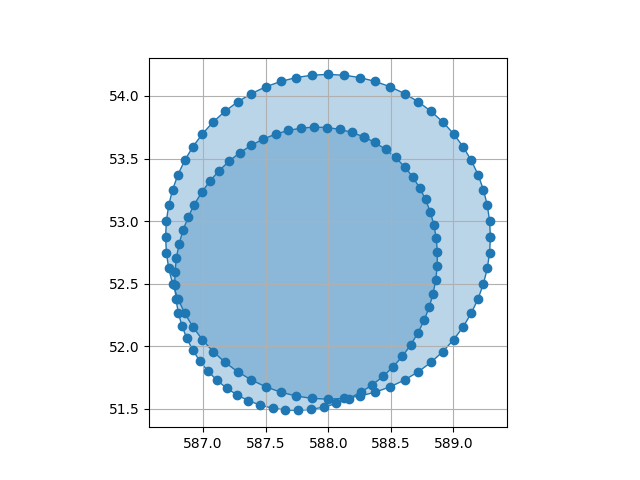

In [116]:
post_proc.make_det_map(show = [89,57])

In [283]:
post_proc.aper_det_map['area']

106.0
131.0
67.0
25.0
129.0
198.0
36.0
147.0
152.0
121.0
123.0


0.02+/-0.07
0.01+/-0.10
[[2.0, 0.020295507521364654, 0.01165810021971008, 0.07082327488793277], [3.0, 0.00898391921758796, 0.003729540929992066, 0.09971463279137818]]
/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_test_moffat_sub_box_11_localbkg_10_aper_subbox/results/flux_error_aper_ratio_best_qfit_snr.stats.pkl


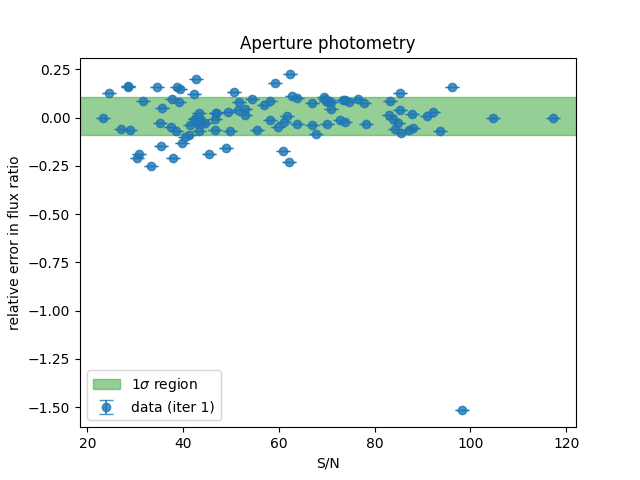

(-0.3, 0.3)

In [288]:
post_proc.make_aper_error_plot_ratio_snr(log=False)
ax = plt.gca()
ax.set_ylim([-0.3,0.3])

     psfflux      
------------------
1305.7467367476431
3484.2708472372497
2785.4653292537746
 5229.196437701087
 4711.242783936253
3106.8865425279273
  5432.39196417335
3974.2014214305823
 3385.072960270757
 7083.292021737708
               ...
4769.1766575661295
 2033.904639222162
 7297.924356714065
 5435.265878202258
 2770.497389333317
 5165.034550665158
 4702.205255223279
 6600.347893984284
2084.1435760530044
 6201.572001534232
  3134.64747575884
Length = 92 rows
-0.3+/-0.4
-0.3+/-0.4
[[2.0, -0.28677664868929237, -0.2788480526155034, 0.35884429887682695], [3.0, -0.27779935550756923, -0.27624134696872626, 0.420602888547741]]
/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_1/results/flux_error_psf_ratio_best_qfit_snr.stats.pkl


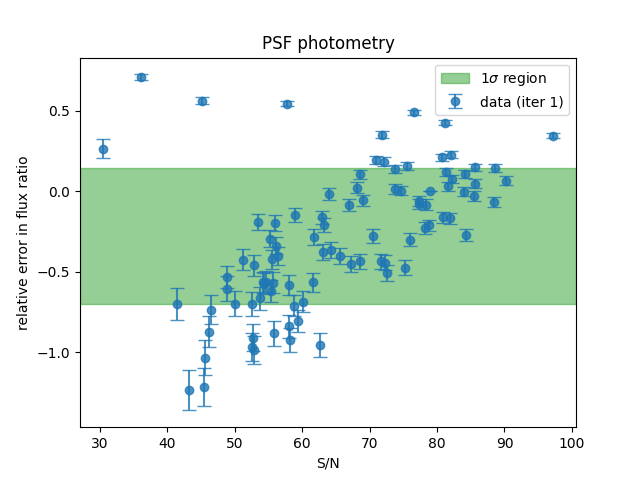

In [129]:
ax_psf = post_proc.make_psf_error_plot_ratio_snr(log=False)


-0.03+/-0.09
-0.04+/-0.15
[[2.0, -0.027177293164293004, -0.02820781452769098, 0.08517185821126304], [3.0, -0.035698909882549534, -0.03063942024601791, 0.1466250587076482]]
/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_1/results/flux_error_aper_ratio_best_qfit_snr.stats.pkl


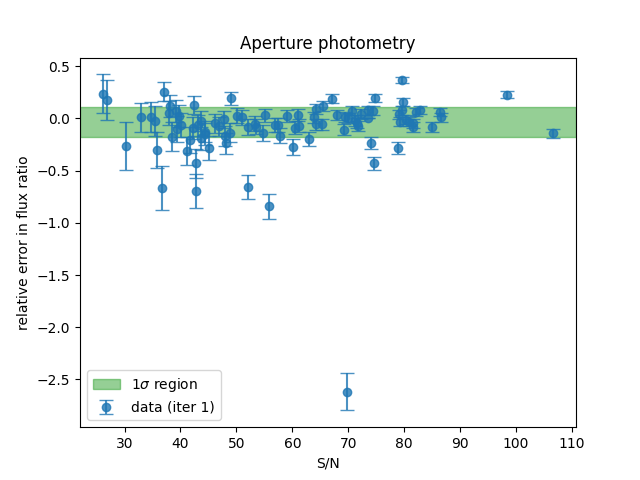

In [130]:
ax_aper = post_proc.make_aper_error_plot_ratio_snr(log=False)

In [199]:
from matplotlib.patches import PathPatch
from matplotlib.patches import Polygon


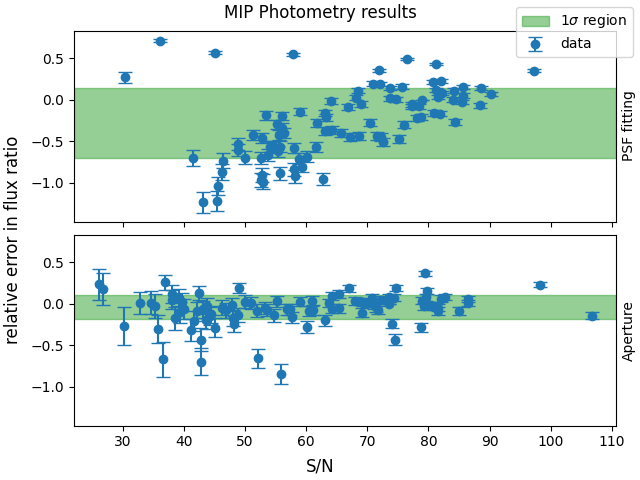

In [232]:
def duplicate_regions(ax, regions):
    """
    Duplicate region patches from one axis to another.
    """
    for region in regions:
        region_copy = region.get_paths()[0]
        ax.add_patch(PathPatch(region_copy, color=region.get_color(), alpha=region.get_alpha()))

fig, axs = plt.subplots(nrows=2,ncols=1,constrained_layout=True,sharex=True,sharey=True)

_,mean,_,std = load_object('/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_1/results/flux_error_psf_ratio_best_qfit_snr.stats.pkl')[-1]
axs[0].axhspan(mean-std,mean+std,color='tab:green',label=r'$1\sigma$ region',alpha=0.5)
_,mean,_,std = load_object('/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_1/results/flux_error_aper_ratio_best_qfit_snr.stats.pkl')[-1]
axs[1].axhspan(mean-std,mean+std,color='tab:green',alpha=0.5)

lines = ax_psf.lines
axs[0].errorbar(lines[0].get_xdata(), lines[0].get_ydata(), yerr=lines[0].get_ydata()-lines[1].get_ydata(),fmt='o',capsize=5,label='data')
# axs[1].set_ylim([min(lines[0].get_ydata()+lines[1].get_ydata()+0.01),max(lines[0].get_ydata()+lines[1].get_ydata()+0.01)])

lines = ax_aper.lines
mask = lines[0].get_ydata() >= -1.1
axs[1].errorbar(lines[0].get_xdata()[mask], lines[0].get_ydata()[mask], yerr=(lines[0].get_ydata()-lines[1].get_ydata())[mask],fmt='o',capsize=5)

axs[0].set_ylabel('PSF fitting')
axs[0].yaxis.set_label_position("right")
axs[1].set_ylabel('Aperture')
axs[1].yaxis.set_label_position("right")

fig.suptitle('MIP Photometry results')
fig.supxlabel('S/N')
fig.supylabel('relative error in flux ratio')
fig.legend()
plt.savefig('/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_1/results/phot.png',dpi=300)
plt.show()

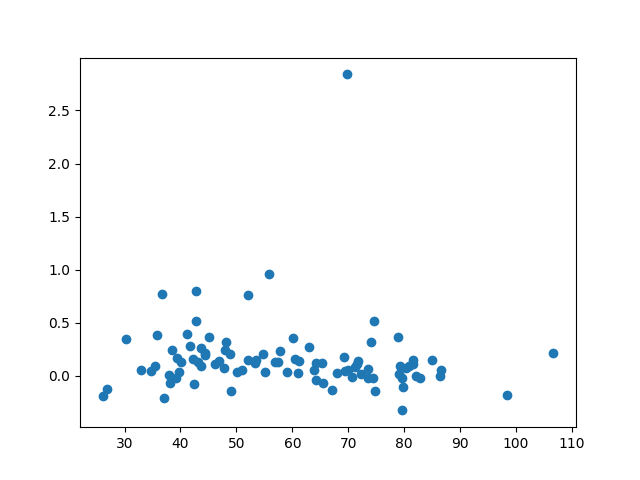

In [126]:
line = ax_aper.lines[0]
plt.figure(clear=True)
plt.scatter(line.get_xdata(),0-line.get_ydata())
plt.show()

In [89]:
91/92

0.9891304347826086

In [117]:
a = ax_psf.lines[0].get_ydata()
b = ax_aper.lines[0].get_ydata()
st = sigma_clipped_stats(b-a)
print(ufloat(st[0],st[2]))

0.4+/-0.4


In [247]:
(50-40)/50

0.2

In [78]:
a = post_proc.aper_det_map['psfflux']
b = post_proc.aper_det_map['fluxap']
sigma_clipped_stats(a-b)

(972.4629307743274, 949.5616564011883, 583.8846898633946)

In [99]:
post_proc.aper_det_map

detection,source,dist,det,src,int,int/det,int/src,det_in_src,src_in_det,NUMBER,FLUX_APER,FLUXERR_APER,FLUX_AUTO,FLUXERR_AUTO,FLUX_RADIUS,FLUX_MAX,X_IMAGE,Y_IMAGE,XPEAK_IMAGE,YPEAK_IMAGE,ERRX2_IMAGE,ERRY2_IMAGE,ALPHA_J2000,DELTA_J2000,A_IMAGE,B_IMAGE,THETA_IMAGE,ELONGATION,ELLIPTICITY,FWHM_IMAGE,FWHM_WORLD,FLAGS,NAXIS1,NAXIS2,xpos,ypos,xpeak,ypeak,ra,dec,fwhm,aimage,bimage,aimagerat,bimagerat,elong,ZP,ZPSTD,DIFFPATH,SCIPATH,NPSFCAT,SAVEPATH,jd,exptime,MAGLIM,FILTER,X_SHAPE,Y_SHAPE,psfflux,psffluxunc,chipsf,xshift,yshift,magpsf,sigmapsf,fluxap,fluxucap,magap,sigmagap,fluxapbig,fluxucapbig,magapbig,sigmagapbig,amplitude,y_0,x_0,gamma,alpha,NUMBER_SRC,Y_IMAGE_SRC,X_IMAGE_SRC,A_IMAGE_SRC,B_IMAGE_SRC,THETA_IMAGE_SRC,FWHM_IMAGE_SRC,FLUX
int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,int32,float32,float32,float32,float32,float32,float32,float32,float32,int32,int32,float64,float64,float64,float64,float32,float32,float32,float32,float32,float32,float32,int16,int64,int64,float32,float32,int32,int32,float64,float64,float32,float32,float32,float32,float32,float32,object,object,str108,str108,str112,str108,float64,object,object,object,int64,int64,float64,float64,float64,int64,int64,object,object,float64,float64,object,object,float64,float64,object,object,float64,float64,float64,float64,float64,int64,float64,float64,float64,float64,int64,float64,float64
1,96,0.0,1.5597150052806026,1.7121077024152105,1.50987252683972,0.968043855273473,0.8818794078840926,0.0,0.0,1,330.79654,20.577946,3273.3406,102.99782,3.195617,140.2777,139.83481,14.014842,140,14,0.0023454429962277918,0.002171661398831909,0.0,0.0,1.4419787,1.3794132,-26.2347,1.0453565,0.043388605,4.0686255,4.0686255,0,1000,1000,138.83481,13.014842,139,13,0.0,0.0,4.0686255,1.4419787,1.3794132,0.35441422,0.33903667,1.0453565,--,--,/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_1/detection/img_Moffat2D_gamma_1-3_alpha_1-2.fits,/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_1/detection/img_Moffat2D_gamma_1-3_alpha_1-2.fits,/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_1/psf_model/img_Moffat2D_gamma_1-3_alpha_1-2.psfmodel,/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_1/detection/img_Moffat2D_gamma_1-3_alpha_1-2.fits,2460318.1900792164,--,--,--,1000,1000,1305.7467367476431,73.86217369211424,2.8398194378561175,11,21,--,--,5559.623460747307,173.5003635179494,--,--,9222.267869047624,570.8433446813171,--,--,139.76371208537986,13.06255405646084,138.77843853332695,1.4776430422485654,1.0023937224697306,96,13.06255405646084,138.77843853332695,1.4776430422485654,1.4776430422485654,0,2.9503943751242763,4396.9584104782
2,3,0.0,1.2403999715674123,3.4531754636356427,1.240399971567412,0.9999999999999998,0.35920560209861707,1.0,0.0,2,293.94452,19.662142,2392.201,88.97124,2.6721582,107.65464,117.03084,978.41656,117,978,0.002102107623569713,0.0026118186364476035,0.0,0.0,1.3218348,1.19672,77.50069,1.1045481,0.094652355,3.67349,3.67349,0,1000,1000,116.03084,977.41656,116,977,0.0,0.0,3.67349,1.3218348,1.19672,0.3598308,0.32577196,1.1045481,--,--,/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_1/detection/img_Moffat2D_gamma_1-3_alpha_1-2.fits,/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_1/detection/img_Moffat2D_gamma_1-3_alpha_1-2.fits,/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_1/psf_model/img_Moffat2D_gamma_1-3_alpha_1-2.psfmodel,/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_1/detection/img_Moffat2D_gamma_1-3_alpha_1-2.fits,2460318.1900792164,--,--,--,1000,1000,3484.2708472372497,110.11653646331263,0.874873951203818,14,14,--,--,2604.3798626087455,169.54809613726167,--,--,3539.9397356988366,600.9987990379979,--,--,109.96368964242448,977.4633430668724,116.0444498715909,2.098520981930891,1.4230705276115927,3,977.4633430668724,116.0444498715909,2.098520981930891,2.098520981930891,0,3.324826888996406,2975.9372080532903
3,88,0.0,0.7823452862120569,2.203036668114482,0.7823452862120572,1.00000000

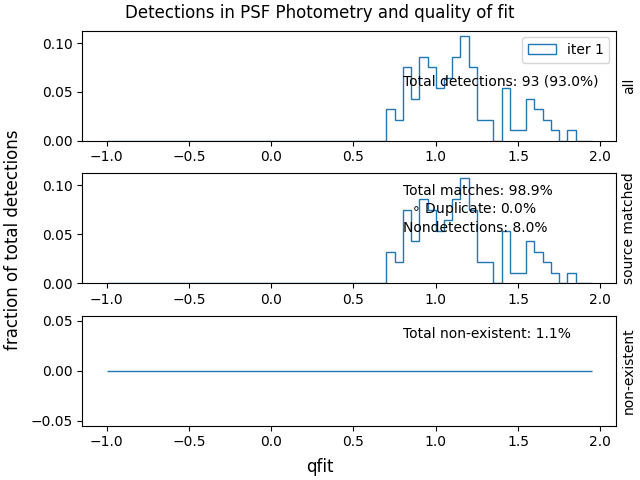

In [56]:
post_proc.make_flux_qfit_plot_mirar()

In [37]:
post_proc.det_map

detection,source,dist,det,src,int,int/det,int/src,det_in_src,src_in_det,NUMBER,FLUX_APER,FLUXERR_APER,FLUX_AUTO,FLUXERR_AUTO,FLUX_RADIUS,FLUX_MAX,X_IMAGE,Y_IMAGE,XPEAK_IMAGE,YPEAK_IMAGE,ERRX2_IMAGE,ERRY2_IMAGE,ALPHA_J2000,DELTA_J2000,A_IMAGE,B_IMAGE,THETA_IMAGE,ELONGATION,ELLIPTICITY,FWHM_IMAGE,FWHM_WORLD,FLAGS,NAXIS1,NAXIS2,xpos,ypos,xpeak,ypeak,ra,dec,fwhm,aimage,bimage,aimagerat,bimagerat,elong,ZP,ZPSTD,DIFFPATH,SCIPATH,NPSFCAT,SAVEPATH,jd,exptime,MAGLIM,FILTER,X_SHAPE,Y_SHAPE,psfflux,psffluxunc,chipsf,xshift,yshift,magpsf,sigmapsf,a,b,angle,amplitude,y_0,x_0,gamma,alpha,NUMBER_SRC,Y_IMAGE_SRC,X_IMAGE_SRC,A_IMAGE_SRC,B_IMAGE_SRC,THETA_IMAGE_SRC,FWHM_IMAGE_SRC,FLUX
int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,int32,float32,float32,float32,float32,float32,float32,float32,float32,int32,int32,float64,float64,float64,float64,float32,float32,float32,float32,float32,float32,float32,int16,int64,int64,float32,float32,int32,int32,float64,float64,float32,float32,float32,float32,float32,float32,object,object,str108,str108,str112,str108,float64,object,object,object,int64,int64,float64,float64,float64,int64,int64,object,object,float64,float64,float64,float64,float64,float64,float64,float64,int64,float64,float64,float64,float64,int64,float64,float64
1,96,0.0,1.5597150052806026,1.7121077024152105,1.50987252683972,0.968043855273473,0.8818794078840926,0.0,0.0,1,330.79654,20.577946,3273.3406,102.99782,3.195617,140.2777,139.83481,14.014842,140,14,0.0023454429962277918,0.002171661398831909,0.0,0.0,1.4419787,1.3794132,-26.2347,1.0453565,0.043388605,4.0686255,4.0686255,0,1000,1000,138.83481,13.014842,139,13,0.0,0.0,4.0686255,1.4419787,1.3794132,0.35441422,0.33903667,1.0453565,--,--,/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_1/detection/img_Moffat2D_gamma_1-3_alpha_1-2.fits,/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_1/detection/img_Moffat2D_gamma_1-3_alpha_1-2.fits,/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_1/psf_model/img_Moffat2D_gamma_1-3_alpha_1-2.psfmodel,/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_1/detection/img_Moffat2D_gamma_1-3_alpha_1-2.fits,2460318.1900792164,--,--,--,1000,1000,1305.7467367476431,73.86217369211424,2.8398194378561175,11,21,--,--,2.0,2.0,0.0,139.76371208537986,13.06255405646084,138.77843853332695,1.4776430422485654,1.0023937224697306,96,13.06255405646084,138.77843853332695,1.4776430422485654,1.4776430422485654,0,2.9503943751242763,4396.9584104782
2,3,0.0,1.2403999715674123,3.4531754636356427,1.240399971567412,0.9999999999999998,0.35920560209861707,1.0,0.0,2,293.94452,19.662142,2392.201,88.97124,2.6721582,107.65464,117.03084,978.41656,117,978,0.002102107623569713,0.0026118186364476035,0.0,0.0,1.3218348,1.19672,77.50069,1.1045481,0.094652355,3.67349,3.67349,0,1000,1000,116.03084,977.41656,116,977,0.0,0.0,3.67349,1.3218348,1.19672,0.3598308,0.32577196,1.1045481,--,--,/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_1/detection/img_Moffat2D_gamma_1-3_alpha_1-2.fits,/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_1/detection/img_Moffat2D_gamma_1-3_alpha_1-2.fits,/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_1/psf_model/img_Moffat2D_gamma_1-3_alpha_1-2.psfmodel,/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_1/detection/img_Moffat2D_gamma_1-3_alpha_1-2.fits,2460318.1900792164,--,--,--,1000,1000,3484.2708472372497,110.11653646331263,0.874873951203818,14,14,--,--,2.0,2.0,0.0,109.96368964242448,977.4633430668724,116.0444498715909,2.098520981930891,1.4230705276115927,3,977.4633430668724,116.0444498715909,2.098520981930891,2.098520981930891,0,3.324826888996406,2975.9372080532903
3,88,0.0,0.7823452862120569,2.203036668114482,0.7823452862120572,1.0000000000000004,0.3551213184670434,1.0,0.0,3,311.03833,20.092129,1242.5812,59.157154,1.596072,131.19193,674.0363,965.6222,674,966,0.0025220893897342548,0.0018404370506995614,0.0,0.0,1.0658784,0.93604946,2.055806,1.1386988,0.121804655,2.7391343,2.7391343,

In [92]:
np.unique(post_proc.dup_table['source'])

19
23
38
41
47
55
61
67
81


### Convolution for source detection 

min 0.03694949034028588


/var/folders/n1/nl_dwlrx4v9_6j5wdwq5xnwh0000gn/T/ipykernel_88006/2140219589.py:149: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('seismic')


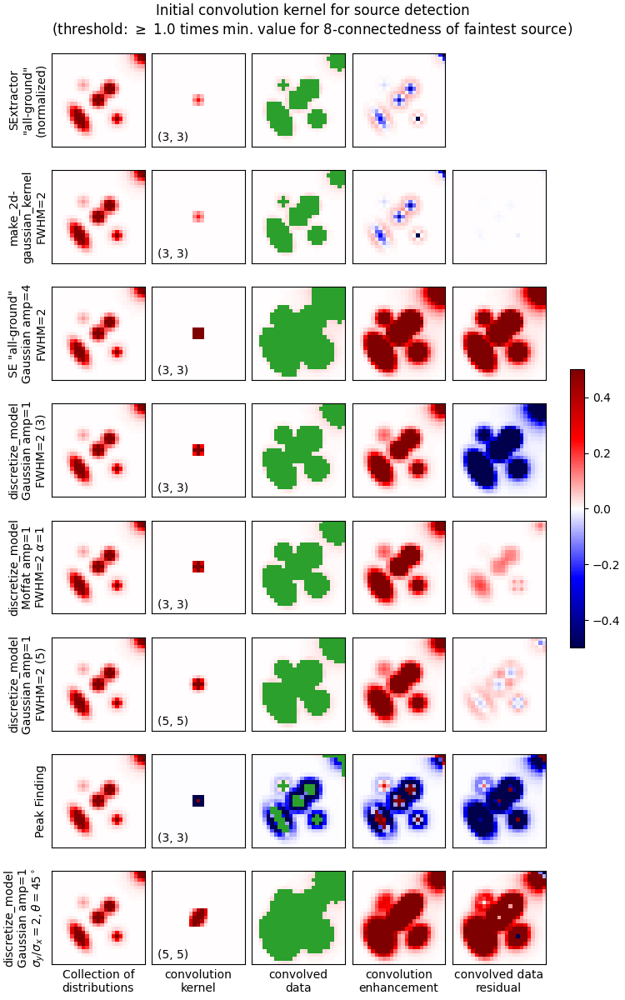

In [19]:
class StretchOutNormalize(plt.Normalize):
    def __init__(self, vmin=None, vmax=None, low=None, up=None, clip=False):
        self.low = low
        self.up = up
        plt.Normalize.__init__(self, vmin, vmax, clip)

    def __call__(self, value, clip=None):
        x, y = [self.vmin, self.low, self.up, self.vmax], [0, 0.5-1e-9, 0.5+1e-9, 1]
        return np.ma.masked_array(np.interp(value, x, y))

def to_shape(a, shape):
    y_, x_ = shape
    y, x = a.shape
    y_pad = (y_-y)
    x_pad = (x_-x)
    return np.pad(a,((y_pad//2 + y_pad%2, y_pad//2), 
                     (x_pad//2 + x_pad%2, x_pad//2)),
                  mode = 'constant')    

def make_2dgaussian_kernel_unnorm(fwhm, size, mode='oversample', oversampling=10):
    ysize, xsize = as_pair('size', size, lower_bound=(0, 1), check_odd=True)

    kernel = Gaussian2DKernel(fwhm * gaussian_fwhm_to_sigma,
                              x_size=xsize, y_size=ysize, mode=mode,
                              factor=oversampling)
    
    return kernel

amp_high = 1
amp_low = amp_high/10
# model = models.Moffat2D(x_0=0,y_0=0,amplitude=amp,gamma=2,alpha=2) 
all_models = [
    models.Gaussian2D(amplitude=amp_high, x_mean=3, y_mean=3, x_stddev=1, y_stddev=1, theta=0),
    models.Gaussian2D(amplitude=amp_high, x_mean=-0, y_mean=-0, x_stddev=1, y_stddev=1, theta=0),
    models.Gaussian2D(amplitude=amp_low, x_mean=4, y_mean=-4, x_stddev=1, y_stddev=1, theta=0),
    models.Gaussian2D(amplitude=amp_high, x_mean=-5, y_mean=-5, x_stddev=1, y_stddev=2, theta=45),
    models.Moffat2D(amplitude=amp_high, x_0=-5, y_0=5, alpha=2, gamma=1),
    models.Moffat2D(amplitude=amp_high, x_0=12, y_0=12, alpha=2, gamma=2),
]

size=25
grid_size=np.round(size/2)
x,y = np.mgrid[-grid_size:grid_size+1,-grid_size:grid_size+1]

data = all_models[0](x,y)
for model in all_models[1:]:
    data_add = model(x,y)
    data += data_add

thresh_factor = 1
min_factor = 0

add_bkg = True
if add_bkg:
    # bkg = amp_low/10
    bkg =0
    data+=np.ones(data.shape)*bkg
    low_model = (7,17)
    min_val = data[low_model[1]][low_model[0]]
    print('min',min_val)
    bkg_rms = (min_val + bkg)*(1+min_factor/100)

cmap_max_factor = 5
cmap_max = amp_low*cmap_max_factor

SEX_ALL_GROUND_CONV = CustomKernel(np.array([
    [1,2,1],
    [2,4,2],
    [1,2,1]
]))

SEX_ALL_GROUND_CONV_NORM = CustomKernel(np.array([
    [1,2,1],
    [2,4,2],
    [1,2,1]
]))
SEX_ALL_GROUND_CONV_NORM.normalize(mode='integral')

peak_find = CustomKernel(np.array([
    [-1,-1,-1],
    [-1,8,-1],
    [-1,-1,-1]
]))

kernel_fwhm = 2
# Gaussian2DKernel(**kernel_param) for kernel_param in kernel_params]
gauss_model = models.Gaussian2D(
    amplitude=1,
    x_mean=0,
    y_mean=0,
    x_stddev=kernel_fwhm * gaussian_fwhm_to_sigma,
    y_stddev=kernel_fwhm * gaussian_fwhm_to_sigma,
    theta=0,
) 

gauss_model_gal = models.Gaussian2D(
    amplitude=1,
    x_mean=0,
    y_mean=0,
    x_stddev=2,
    y_stddev=1,
    theta=45,
) 

moffat_model = models.Moffat2D(
    amplitude=1,
    x_0=0,
    y_0=0,
    alpha=1,
    gamma=1
)

kernels = {
    'SExtractor\n\"all-ground\"\n(normalized)': [SEX_ALL_GROUND_CONV_NORM,False],
    'make_2d-\ngaussian_kernel\nFWHM=2': [make_2dgaussian_kernel(kernel_fwhm,3),False],
    'SE \"all-ground\"\nGaussian amp=4\nFWHM=2': [SEX_ALL_GROUND_CONV,False],
    # 'Gaussian2D\nFWHM=2 (3,3)': [make_2dgaussian_kernel_unnorm(kernel_fwhm,3),False],
    # 'Gaussian\nFWHM=2 (5,5)': [make_2dgaussian_kernel(kernel_fwhm,5),False]
    'discretize_model\nGaussian amp=1\nFWHM=2 (3)': [CustomKernel(discretize_model(gauss_model,x_range=(-1,2),y_range=(-1,2))),False],
    'discretize_model\nMoffat amp=1\nFWHM=2 'r'$\alpha$=1': [CustomKernel(discretize_model(moffat_model,x_range=(-1,2),y_range=(-1,2))),False],
    'discretize_model\nGaussian amp=1\nFWHM=2 (5)': [CustomKernel(discretize_model(gauss_model,x_range=(-2,3),y_range=(-2,3))),False],
    'Peak Finding': [peak_find,False],
    'discretize_model\nGaussian amp=1\n'r'$\sigma_y/\sigma_x=2,\theta=45^\circ$': [CustomKernel(discretize_model(gauss_model_gal,x_range=(-2,3),y_range=(-2,3))),False]
    
}

conv_data = np.array([convolve(data,kernel[0],normalize_kernel=kernel[1]) for kernel in kernels.values()])
# flat_data = [np.ones((kernel_size,kernel_size)) for kernel_size in kernel_sizes]

# conv_flat_data = [convolve(flat,kernel) for flat,kernel in zip(flat_data,kernels)]
# conv_flat_data_padded = [np.pad(conv_flat,(size-kernel_size)//2,'constant') for conv_flat,kernel_size in zip(conv_flat_data,kernel_sizes)]

kernels_data = [kernel[0].array for kernel in kernels.values()]
kernels_data_padded = [to_shape(kernel_data,data.shape) for kernel_data in kernels_data]

conv_ehancement = conv_data-data

# labels = ['photutils 2d']

plot_x = np.arange(0,size,1)
center_x = size//2

mul = 1.5
step = 1
nrows = len(kernels)*step

# ----------------------------- #
# cmap='viridis'
cmap = cm.get_cmap('seismic')
cmap.set_bad(color='tab:green')

interval = MinMaxInterval()
_,vmax = interval.get_limits(data)
vmin,_ = interval.get_limits(conv_ehancement[-1])
norm = mcolors.CenteredNorm(halfrange=cmap_max)
if add_bkg:
    norm = mcolors.CenteredNorm(halfrange=cmap_max)

# ----------------------------- #

fig, axs = plt.subplots(nrows=nrows,ncols=5,figsize=(5*mul,nrows*mul),sharex=True,constrained_layout=True)
for i in range(0,nrows,step):
    data_idx = i//step
    
    axs[i][0].imshow(data,origin='lower',cmap=cmap,norm=norm)
    axs[i][0].set_ylabel(list(kernels.keys())[data_idx])
    axs[i][1].imshow(kernels_data_padded[data_idx],origin='lower',cmap=cmap,norm=norm)
    axs[i][1].text(1,1,f"{kernels_data[data_idx].shape}")
    
    if add_bkg:
        # conv_thresh = np.sum(kernels_data[i])*bkg_rms*thresh_factor
        conv_thresh = bkg_rms*thresh_factor
        conv_data_copy = deepcopy(conv_data[data_idx])
        # conv_thresh = amp_low*5
        conv_data_copy[conv_data_copy >= conv_thresh] = np.nan
        axs[i][2].imshow(conv_data_copy,origin='lower',cmap=cmap,norm=norm)
    else:
        axs[i][2].imshow(conv_data[data_idx],origin='lower',cmap=cmap,norm=norm)
    axs[i][3].imshow(conv_ehancement[data_idx],origin='lower',cmap=cmap,norm=norm)
    if data_idx > 0:
        axs[i][4].imshow(conv_data[data_idx]-conv_data[data_idx-1],origin='lower',cmap=cmap,norm=norm)
    # else:
        # axs[i][4].imshow(np.ones(data.shape),cmap=cmap)
        # fig.delaxes(ax[i][4])
    
    if step > 1:
        axs[i+1][0].stairs(plot_x,data[center_x],orientation='horizontal',fill=True)
        # asp = (np.diff(axs[i+1][0].get_xlim())[0]/2) / np.diff(axs[i+1][0].get_ylim())[0]
        # axs[i+1][0].set_aspect(asp)
        
        axs[i+1][1].stairs(plot_x,kernels_data_padded[data_idx][center_x],orientation='horizontal',fill=True)
        # asp = (np.diff(axs[i+1][0].get_xlim())[0]/2) / np.diff(axs[i+1][1].get_ylim())[0]
        # axs[i+1][1].set_aspect(asp)
        
        axs[i+1][2].stairs(plot_x,conv_data[data_idx][center_x],orientation='horizontal',fill=True)
        # asp = (np.diff(axs[i+1][0].get_xlim())[0]/2) / np.diff(axs[i+1][2].get_ylim())[0]
        # axs[i+1][2].set_aspect(asp)
    
    if i == len(kernels)-1:
        # axs[i][0].set_xlabel(r'Moffat(amp=2,'+'\n'+r'$\gamma$=2,$\alpha$=2)')
        # axs[i][0].set_xlabel(r'Gaussian(amp=2,'+'\n'+r'$\sigma_x=1,\sigma_y=1,$'+'\n'+r'$\theta=0$)')
        axs[i][0].set_xlabel('Collection of\ndistributions')
        axs[i][1].set_xlabel('convolution\nkernel')
        axs[i][2].set_xlabel('convolved\ndata')
        axs[i][3].set_xlabel('convolution\nenhancement')
        axs[i][4].set_xlabel('convolved data\nresidual')
    # for ax in np.concatenate((axs[i],axs[i+1]),axis=0):
    for ax in axs[i]:
        ax.set_xticks([])
        ax.set_yticks([])
[fig.delaxes(ax) for ax in axs.flatten() if not ax.has_data()]
im = cm.ScalarMappable(cmap=cmap,norm=norm)
fig.colorbar(im, ax=axs.ravel().tolist(), shrink=0.3)
fig.suptitle(f'Initial convolution kernel for source detection'f'\n'fr'(threshold: {cmap_max_factor} times the min. amplitude)')
if add_bkg:
    # fig.suptitle(f'Initial convolution kernel for source detection'f'\n'fr'(threshold: {thresh_factor}$\sigma$ of background)')
    fig.suptitle(f'Initial convolution kernel for source detection'f'\n'fr'(threshold: $\geq$ {1+min_factor/100} times min. value for 8-connectedness of faintest source)')

save=True
name = f'_final_init_conv_comp_0perc_bkg_no'
if save:
    # plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath('detection.eps'),format='eps')
    plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.png'),dpi=300)
    with open(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.mpl.pkl'), 'wb') as file:
        pickle.dump(plt.gcf(),file)
    # dump_object([str(pprint(model)),data,kernels],Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.png.params'))
    save_prams(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.png.params'))

plt.show()

min 0.03694949034028588


/var/folders/n1/nl_dwlrx4v9_6j5wdwq5xnwh0000gn/T/ipykernel_88006/3971405567.py:128: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('seismic')


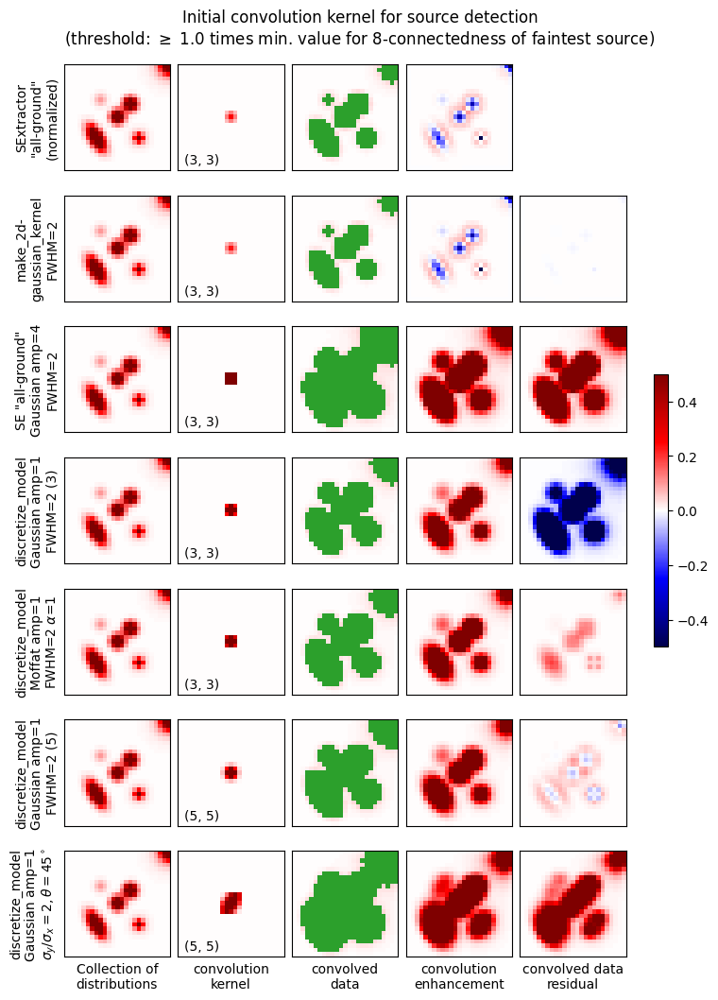

In [5]:
import numpy as np
import matplotlib.cm as cm
import matplotlib.colors as mcolors
from astropy.modeling import models
from astropy.visualization import MinMaxInterval
from photutils.segmentation import make_2dgaussian_kernel
from astropy.convolution import convolve
from astropy.convolution.kernels import CustomKernel
import matplotlib.pyplot as plt
from astropy.stats import gaussian_fwhm_to_sigma
from astropy.convolution import discretize_model
from copy import deepcopy

def to_shape(a, shape):
    y_, x_ = shape
    y, x = a.shape
    y_pad = (y_-y)
    x_pad = (x_-x)
    return np.pad(a,((y_pad//2 + y_pad%2, y_pad//2), (x_pad//2 + x_pad%2, x_pad//2)), mode = 'constant')    

amp_high = 1
amp_low = amp_high/10
# model = models.Moffat2D(x_0=0,y_0=0,amplitude=amp,gamma=2,alpha=2) 
all_models = [
    models.Gaussian2D(amplitude=amp_high, x_mean=3, y_mean=3, x_stddev=1, y_stddev=1, theta=0),
    models.Gaussian2D(amplitude=amp_high, x_mean=-0, y_mean=-0, x_stddev=1, y_stddev=1, theta=0),
    models.Gaussian2D(amplitude=amp_low, x_mean=4, y_mean=-4, x_stddev=1, y_stddev=1, theta=0),
    models.Gaussian2D(amplitude=amp_high, x_mean=-5, y_mean=-5, x_stddev=1, y_stddev=2, theta=45),
    models.Moffat2D(amplitude=amp_high, x_0=-5, y_0=5, alpha=2, gamma=1),
    models.Moffat2D(amplitude=amp_high, x_0=12, y_0=12, alpha=2, gamma=2),
]

size=25
grid_size=np.round(size/2)
x,y = np.mgrid[-grid_size:grid_size+1,-grid_size:grid_size+1]

data = all_models[0](x,y)
for model in all_models[1:]:
    data_add = model(x,y)
    data += data_add

thresh_factor = 1
min_factor = 0

add_bkg = True
if add_bkg:
    # bkg = amp_low/10
    bkg=0
    data+=np.ones(data.shape)*bkg
    low_model = (7,17)
    min_val = data[low_model[1]][low_model[0]]
    print('min',min_val)
    bkg_rms = (min_val + bkg)*(1+min_factor/100)

cmap_max_factor = 5
cmap_max = amp_low*cmap_max_factor

SEX_ALL_GROUND_CONV = CustomKernel(np.array([
    [1,2,1],
    [2,4,2],
    [1,2,1]
]))

SEX_ALL_GROUND_CONV_NORM = CustomKernel(np.array([
    [1,2,1],
    [2,4,2],
    [1,2,1]
]))
SEX_ALL_GROUND_CONV_NORM.normalize(mode='integral')

kernel_fwhm = 2
# Gaussian2DKernel(**kernel_param) for kernel_param in kernel_params]
gauss_model = models.Gaussian2D(
    amplitude=1,
    x_mean=0,
    y_mean=0,
    x_stddev=kernel_fwhm * gaussian_fwhm_to_sigma,
    y_stddev=kernel_fwhm * gaussian_fwhm_to_sigma,
    theta=0,
) 

gauss_model_gal = models.Gaussian2D(
    amplitude=1,
    x_mean=0,
    y_mean=0,
    x_stddev=2,
    y_stddev=1,
    theta=45,
) 

moffat_model = models.Moffat2D(
    amplitude=1,
    x_0=0,
    y_0=0,
    alpha=1,
    gamma=1
)

kernels = {
    'SExtractor\n\"all-ground\"\n(normalized)': [SEX_ALL_GROUND_CONV_NORM,False],
    'make_2d-\ngaussian_kernel\nFWHM=2': [make_2dgaussian_kernel(kernel_fwhm,3),False],
    'SE \"all-ground\"\nGaussian amp=4\nFWHM=2': [SEX_ALL_GROUND_CONV,False],
    # 'Gaussian2D\nFWHM=2 (3,3)': [make_2dgaussian_kernel_unnorm(kernel_fwhm,3),False],
    # 'Gaussian\nFWHM=2 (5,5)': [make_2dgaussian_kernel(kernel_fwhm,5),False]
    'discretize_model\nGaussian amp=1\nFWHM=2 (3)': [CustomKernel(discretize_model(gauss_model,x_range=(-1,2),y_range=(-1,2))),False],
    'discretize_model\nMoffat amp=1\nFWHM=2 'r'$\alpha$=1': [CustomKernel(discretize_model(moffat_model,x_range=(-1,2),y_range=(-1,2))),False],
    'discretize_model\nGaussian amp=1\nFWHM=2 (5)': [CustomKernel(discretize_model(gauss_model,x_range=(-2,3),y_range=(-2,3))),False],
    'discretize_model\nGaussian amp=1\n'r'$\sigma_y/\sigma_x=2,\theta=45^\circ$': [CustomKernel(discretize_model(gauss_model_gal,x_range=(-2,3),y_range=(-2,3))),False]
    
}

conv_data = np.array([convolve(data,kernel[0],normalize_kernel=kernel[1]) for kernel in kernels.values()])

kernels_data = [kernel[0].array for kernel in kernels.values()]
kernels_data_padded = [to_shape(kernel_data,data.shape) for kernel_data in kernels_data]

conv_ehancement = conv_data-data

plot_x = np.arange(0,size,1)
center_x = size//2

mul = 1.5
step = 1
nrows = len(kernels)*step

# ----------------------------- #
# cmap='viridis'
cmap = cm.get_cmap('seismic')
cmap.set_bad(color='tab:green')

interval = MinMaxInterval()
_,vmax = interval.get_limits(data)
vmin,_ = interval.get_limits(conv_ehancement[-1])
norm = mcolors.CenteredNorm(halfrange=cmap_max)
if add_bkg:
    norm = mcolors.CenteredNorm(halfrange=cmap_max)

# ----------------------------- #

fig, axs = plt.subplots(nrows=nrows,ncols=5,figsize=(5*mul,nrows*mul),sharex=True,constrained_layout=True)
for i in range(0,nrows,step):
    data_idx = i//step
    
    axs[i][0].imshow(data,origin='lower',cmap=cmap,norm=norm)
    axs[i][0].set_ylabel(list(kernels.keys())[data_idx])
    axs[i][1].imshow(kernels_data_padded[data_idx],origin='lower',cmap=cmap,norm=norm)
    axs[i][1].text(1,1,f"{kernels_data[data_idx].shape}")
    
    if add_bkg:
        conv_thresh = bkg_rms*thresh_factor
        conv_data_copy = deepcopy(conv_data[data_idx])
        conv_data_copy[conv_data_copy >= conv_thresh] = np.nan
        axs[i][2].imshow(conv_data_copy,origin='lower',cmap=cmap,norm=norm)
    else:
        axs[i][2].imshow(conv_data[data_idx],origin='lower',cmap=cmap,norm=norm)
    axs[i][3].imshow(conv_ehancement[data_idx],origin='lower',cmap=cmap,norm=norm)
    if data_idx > 0:
        axs[i][4].imshow(conv_data[data_idx]-conv_data[data_idx-1],origin='lower',cmap=cmap,norm=norm)

    if i == len(kernels)-1:
        axs[i][0].set_xlabel('Collection of\ndistributions')
        axs[i][1].set_xlabel('convolution\nkernel')
        axs[i][2].set_xlabel('convolved\ndata')
        axs[i][3].set_xlabel('convolution\nenhancement')
        axs[i][4].set_xlabel('convolved data\nresidual')

    for ax in axs[i]:
        ax.set_xticks([])
        ax.set_yticks([])
        
[fig.delaxes(ax) for ax in axs.flatten() if not ax.has_data()]
im = cm.ScalarMappable(cmap=cmap,norm=norm)
fig.colorbar(im, ax=axs.ravel().tolist(), shrink=0.3)
fig.suptitle(f'Initial convolution kernel for source detection'f'\n'fr'(threshold: {cmap_max_factor} times the min. amplitude)')
if add_bkg:
    fig.suptitle(f'Initial convolution kernel for source detection'f'\n'fr'(threshold: $\geq$ {1+min_factor/100} times min. value for 8-connectedness of faintest source)')

In [58]:
2*1*np.sqrt(2**(1/1) - 1)

2.0

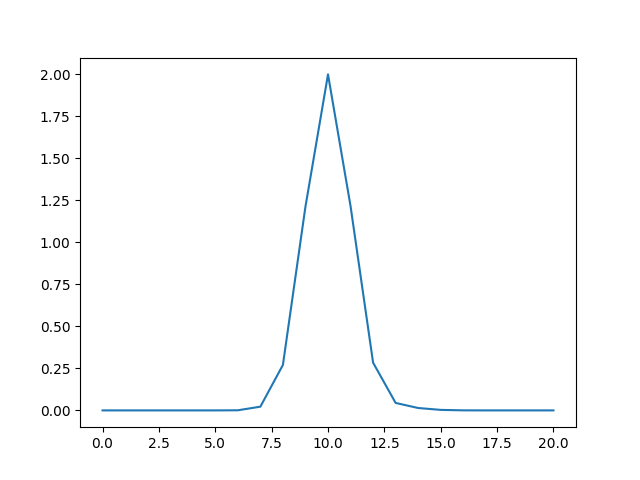

In [49]:
fig,axs = plt.subplots()
axs.plot(data[:,10])
plt.show()

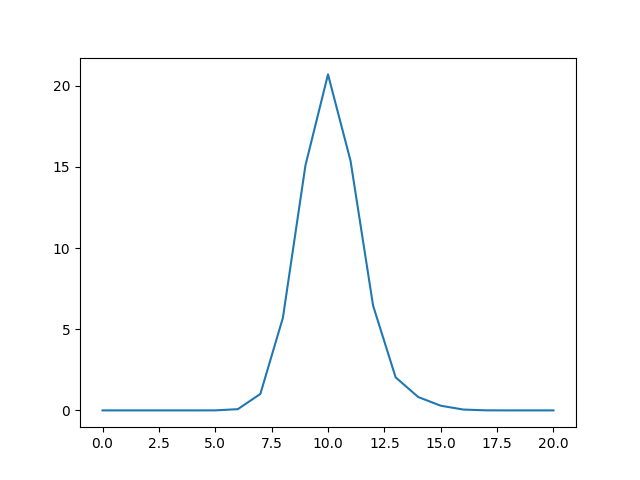

In [50]:
fig,axs = plt.subplots()
axs.plot(conv_data[0][:,10])
plt.show()

In [388]:
from matplotlib.colors import LinearSegmentedColormap

In [224]:
import inspect

In [225]:
for i in inspect.getmembers(kernels):
    # Ignores anything starting with underscore 
    # (that is, private and protected attributes)
    if not i[0].startswith('_'):
        # Ignores methods
        if not inspect.ismethod(i[1]):
            print(i)

('clear', <built-in method clear of dict object at 0x322f2a980>)
('copy', <built-in method copy of dict object at 0x322f2a980>)
('fromkeys', <built-in method fromkeys of type object at 0x100a261d0>)
('get', <built-in method get of dict object at 0x322f2a980>)
('items', <built-in method items of dict object at 0x322f2a980>)
('keys', <built-in method keys of dict object at 0x322f2a980>)
('pop', <built-in method pop of dict object at 0x322f2a980>)
('popitem', <built-in method popitem of dict object at 0x322f2a980>)
('setdefault', <built-in method setdefault of dict object at 0x322f2a980>)
('update', <built-in method update of dict object at 0x322f2a980>)
('values', <built-in method values of dict object at 0x322f2a980>)


### PSF model and convolution kernel

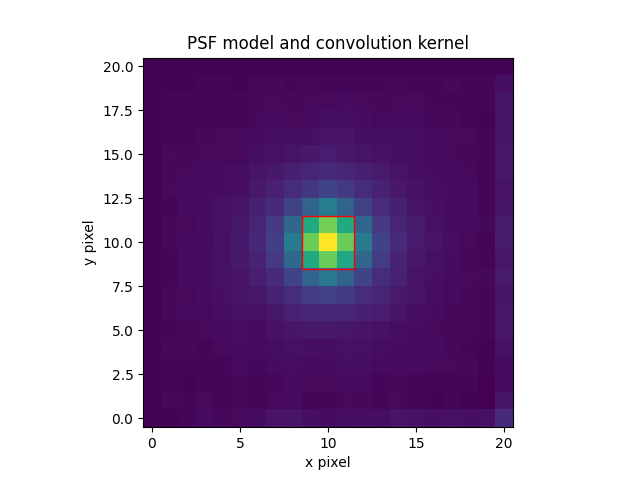

In [296]:
psfmodel_dir = Path(OUTPUT_DIRS['PSF_MODEL'])
psfmodel_file = [psfmodel_dir.joinpath(file) for file in os.listdir(psfmodel_dir) if file.endswith('.psfmodel.pkl')][0]
psfmodel_file = '/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_fixed_model_without_crop/psf_model/img_Moffat2D_gamma_1-3_alpha_1-2.psfmodel.pkl'
psfmodel = load_object(psfmodel_file)
# psf_cutout_size = 21
# x,y = np.mgrid[
#     -2:psf_cutout_size, 
#     -2:psf_cutout_size
# ]
# z = np.ones((psf_cutout_size,psf_cutout_size))
# fitter = fitting.LevMarLSQFitter()
# # fit = fitter(psfmodel,x,y,z)
# # kernel_array = fit(x,y)

psfmodel_data = psfmodel.data
crop_width = 9
if crop_width is not None:
    kernel_array = psfmodel_data[
        crop_width:-crop_width,
        crop_width:-crop_width
    ]
    rect_pad = crop_width-0.5
    artist = Rectangle((rect_pad,rect_pad),kernel_array.shape[0],kernel_array.shape[0],fill=False,color='red')
else:
    kernel_array = psfmodel_data

# lose two extra rows/columns (on the opposite side) as the psf model is centered and needs to be cut as such 
# is automatic determination causing this? set the psf model shape and see the difference

plt.figure(clear=True)
plt.imshow(psfmodel_data,origin='lower')
plt.gca().add_artist(artist)
plt.title('PSF model and convolution kernel')
plt.xlabel('x pixel')
plt.ylabel('y pixel')
plt.show()

plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath('psf_model_convolution_kernel.png'),dpi=300)

kernel = CustomKernel(kernel_array)
kernel.normalize()

# all(kernel_array[i] == kernel.array[i]) for i in range(kernel_array.size)


In [457]:
kernel_array[9]

array([0.00080529, 0.00140926, 0.00132094, 0.00251558, 0.00334018,
       0.00570235, 0.0100524 , 0.02234865, 0.04243025, 0.05468903,
       0.04221722, 0.02267771, 0.01083769, 0.00628151, 0.00377715,
       0.00264086, 0.00166888, 0.00124345, 0.0010014 ])

In [516]:
f"{'a'*23}"

'aaaaaaaaaaaaaaaaaaaaaaa'

In [12]:
def bkg_sub_residual(src_basenames):
    print('> background subtracted image residual')
    for basename in src_basenames:
        filename = basename
        bkg_sub = Fits(os.path.join(OUTPUT_DIRS['BKG'],filename),print_=False)
        src = Fits(bkg_sub.header[0][RAW_IMG_KEY],print_=False)
        residual = src.data[0] - bkg_sub.data[0] 
        resid_path = os.path.join(os.path.join(OUTPUT_DIRS['BKG'],filename+'.resid'))
        resid_img = MakeFits(residual,resid_path,overwrite=True)

In [350]:
from astropy.convolution.kernels import CustomKernel
from astropy.convolution import convolve

In [352]:
array = np.array([1, 2, 3, 2, 1])
kernel = CustomKernel(array)
print(kernel)
array_test = np.array([1,3,6,3,4,5])
convolve(array_test,kernel)

array([1.66666667, 2.88888889, 3.88888889, 4.11111111, 3.77777778,
       2.88888889])

### Run

In [12]:
# !! clear outputs !!
clear_dirs = [
    OUTPUT_DIRS['BKG'],
    OUTPUT_DIRS['DET'],
    OUTPUT_DIRS['PSF_MODEL'],
    OUTPUT_DIRS['PSF_PHOT'],
    OUTPUT_DIRS['APER_PHOT'],
]
for dir in clear_dirs:
    for root, dirs, files in os.walk(dir, topdown=False):
        for file in files:
            os.remove(os.path.join(root, file))
        for dir in dirs:
            os.rmdir(os.path.join(root, dir))

In [9]:
src_dir = '/Users/astqx/Desktop/DREAMS/test/pipeline/phot/sim/photutils.datasets/sim_moffat_0/'
src_basenames = [
    'img_Moffat2D_gamma_1-3_alpha_1-2.fits',
    # 'test_error.fits'
]   

  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00, 94.68it/s]


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]


post reduction...


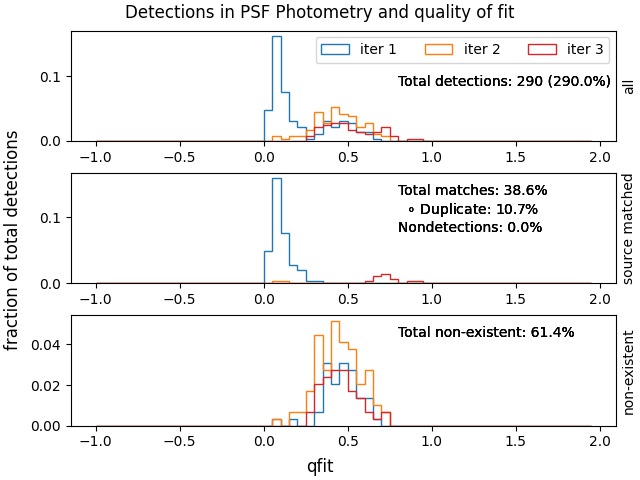

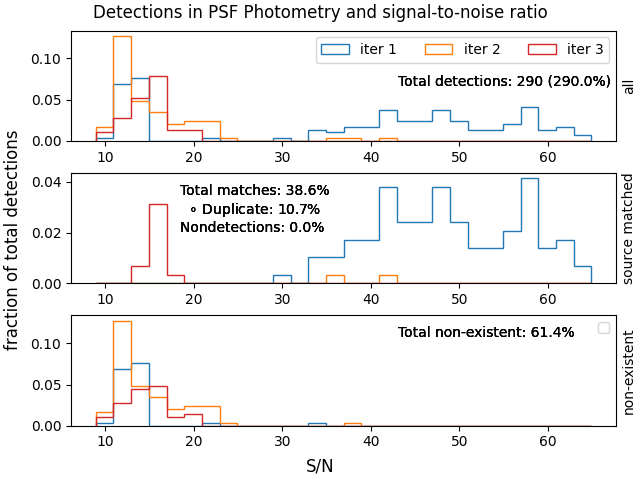

/Users/astqx/miniconda3/envs/mirar/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:931: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/astqx/miniconda3/envs/mirar/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:1010: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


A = 1.0+-inf
B = 1.0+-inf
0.1+/-0.4
-0.0+/-0.5
[[2.0, 0.0861264943143524, 0.10389419543900823, 0.4068653243038678], [3.0, -0.008218973749283683, 0.06128925407143215, 0.49274131310741287]]
/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_test_moffat_sub_box_11_localbkg_10_aper_subbox_noinit/results/flux_error_psf_ratio_best_qfit_snr_log.stats.pkl


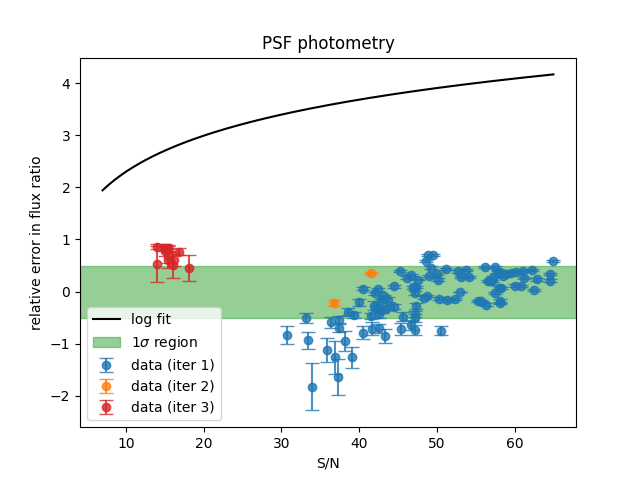

0.1+/-0.4
-0.0+/-0.5
[[2.0, 0.0861264943143524, 0.10389419543900823, 0.4068653243038678], [3.0, -0.008218973749283683, 0.06128925407143215, 0.49274131310741287]]
/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_test_moffat_sub_box_11_localbkg_10_aper_subbox_noinit/results/flux_error_psf_ratio_best_qfit_snr.stats.pkl


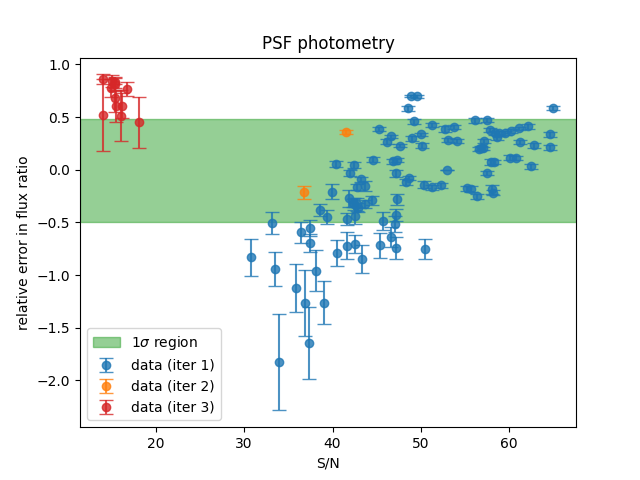

done


In [37]:
logger.debug(f"\n\n{datetime.now()}\n\n")

prepare(src_dir, src_basenames)
configuration = "photutils_default"
flowify(processor_list=eval(configuration), output_path=Path(TEST_DIR).joinpath(configuration),ann=False)
pipeline.reduce_images(Dataset([ImageBatch()]), catch_all_errors=False, selected_configurations=configuration)

print('\npost reduction...')
# bkg_sub_residual(src_basenames)
post_proc = PostProcessPhotutils(src_basenames)
post_proc.make_all(imp=True)
print('done')


In [160]:
print(ufloat(-0.0451723077239384*100,0.47635546490174957*100))

(-0+/-5)e+01


In [11]:
logs = os.listdir(OUTPUT_DIRS['LOG'])
latest_path = os.path.join(OUTPUT_DIRS['LOG'], max(logs))
os.system(f"cat '{latest_path}'")

DEBUG:matplotlib.pyplot:Loaded backend agg version v2.2.
DEBUG:psycopg.pq:couldn't import psycopg 'c' implementation: No module named 'psycopg_c'
DEBUG:mirar.processors.photometry.aperture_photometry:SourceAperturePhotometry: plot None
DEBUG:mirar.database.transactions.select:Selecting from database summer
DEBUG:mirar.database.transactions.select:Selecting from database summer
DEBUG:mirar.database.transactions.select:Selecting from database summer
DEBUG:mirar.database.transactions.select:Selecting from database summer
DEBUG:mirar.database.transactions.select:Selecting from database summer
DEBUG:mirar.database.transactions.select:Selecting from database summer
DEBUG:mirar.database.transactions.select:Selecting from database summer
DEBUG:mirar.database.transactions.select:Selecting from database summer
DEBUG:mirar.database.transactions.select:Selecting from database summer
DEBUG:mirar.database.transactions.select:Selecting from database summer
DEBUG:mirar.processors.photometry.aperture_p

0

', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/NotoSansMongolian-Regular.ttf', name='Noto Sans Mongolian', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/Charter.ttc', name='Charter', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/STIXSizFourSymBol.otf', name='STIXSizeFourSym', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/System/Library/Fonts/Supplemental/ChalkboardSE.ttc', name='Chalkboard SE', style='normal', variant='normal', weight=400, stretch='normal', size='scalable'))

Filename: /Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_4/psf_model/img_Moffat2D_gamma_1-3_alpha_1-2.psfmodel.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       6   (85, 85)   float64   


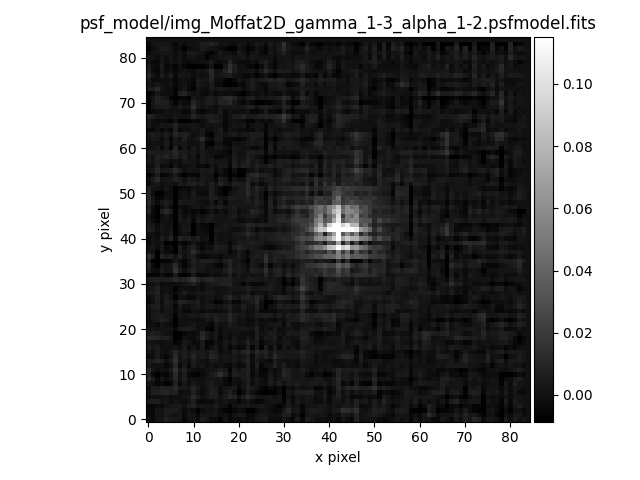

In [346]:
fitsfile1 = Fits('/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_4/psf_model/img_Moffat2D_gamma_1-3_alpha_1-2.psfmodel.fits')
# ax = fitsfile1.image(meanstd=False,scale=False)
ax = fitsfile1.image()
# fitsfile1.header[0]
# norm = simple_norm(fitsfile1.data[0], 'log', percent=99.0)
# plt.imshow(fitsfile1.data[0], norm=norm, origin='lower', cmap='viridis')
# plt.colorbar()
# plt.show()
# ax.plot(40,40,'ro')
# fitsfile2 = Fits('/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_0/background/img_base+noise_poiss+noise_gauss.fits')
# fitsfile2.image()
# # fitsfile.header
# fitsfile1.data[0] - fitsfile2.data[0]

In [ ]:
# stars

with open('/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_4/psf_model/img_Moffat2D_gamma_1-3_alpha_1-2.fits.cutouts.fitted.pkl','rb') as file:
    stars = pickle.load(file)

nrows = 5
ncols = 5
fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 20),
                       squeeze=True)
ax = ax.ravel()
for i in range(nrows * ncols):
    norm = simple_norm(stars[i], 'log', percent=99.0)
    ax[i].imshow(stars[i], norm=norm, origin='lower', cmap='viridis')

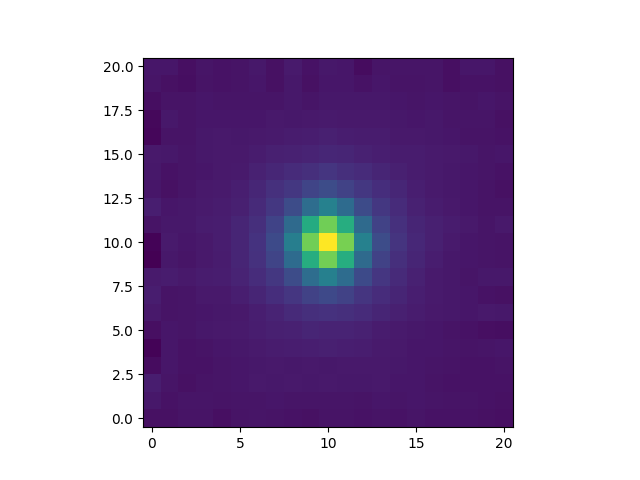

In [411]:
# psf model
psfmodel = load_pickle('/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_4/psf_model/img_Moffat2D_gamma_1-3_alpha_1-2.psfmodel.pkl')
halfsize = 10
x,y = np.mgrid[-halfsize:halfsize+1,-halfsize:halfsize+1]
data = psfmodel(x,y)
# norm = simple_norm(data, 'log', percent=99.0)
plt.figure(clear=True)
plt.imshow(data,origin='lower',cmap='viridis')
plt.show()

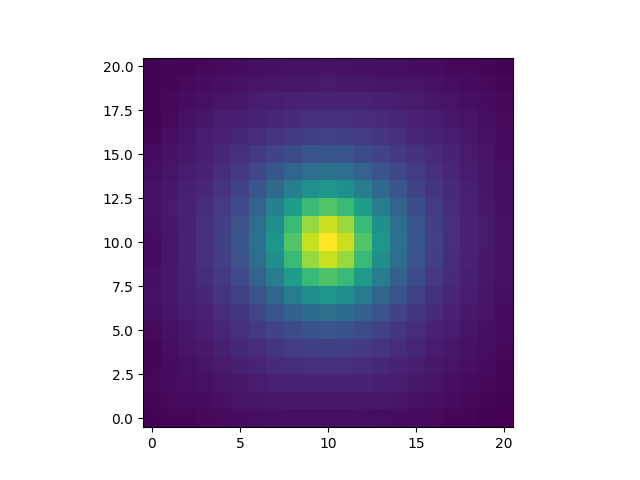

In [410]:
# psf kernel
kernel = CustomKernel(data)
conv_data = convolve(data,kernel)
plt.figure(clear=True)
plt.imshow(conv_data,origin='lower',cmap='viridis')
plt.show()

Filename: /Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_5/detection/img_Moffat2D_gamma_1-3_alpha_1-2.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      27   (1000, 1000)   float64   
Filename: /Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_5/detection/img_Moffat2D_gamma_1-3_alpha_1-2.fits.segm
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      27   (1000, 1000)   int64   


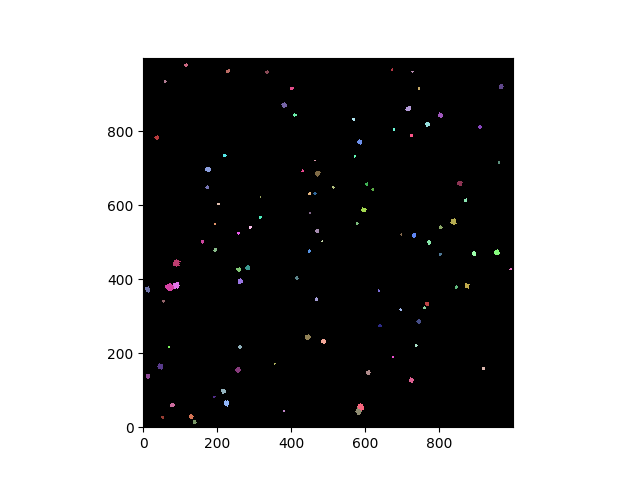

In [58]:
img = Fits('/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_5/detection/img_Moffat2D_gamma_1-3_alpha_1-2.fits')
# img.image()
segm = Fits('/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_5/detection/img_Moffat2D_gamma_1-3_alpha_1-2.fits.segm')
data = segm.data[0]
with open('/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_5/detection/img_Moffat2D_gamma_1-3_alpha_1-2.fits.segm.cmap.pkl','rb') as file:
    segm_cmap = pickle.load(file)
polygons = load_object('/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_5/detection/img_Moffat2D_gamma_1-3_alpha_1-2.fits.segm.polygons.pkl')
# shapely.plotting.plot_polygon(polygons[0])
plt.figure(clear=True)
plt.imshow(data,origin='lower',interpolation='nearest',cmap=segm_cmap)
plt.savefig('/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_5/detection/img_Moffat2D_gamma_1-3_alpha_1-2.fits.png',dpi=300)
plt.show()

Filename: /Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_1/detection/img_Moffat2D_gamma_1-3_alpha_1-2.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      26   (1000, 1000)   float32   


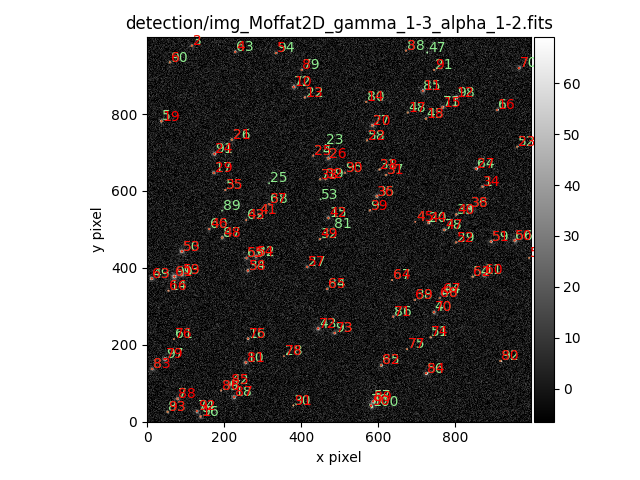

In [107]:
img = Fits('/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_1/detection/img_Moffat2D_gamma_1-3_alpha_1-2.fits')
ax = img.image()
img.mark_from_cat(
    keys=SEX_SRC_KEYS,
    cat_table = post_proc.true_table,
    color='lightgreen'
)
img.mark_from_cat(
    keys=MIRAR_SRC_KEYS,
    cat_table = post_proc.cat_table,
    color='red'
)

In [115]:
peek(ax,get_pos(post_proc.cat_table,89,MIRAR_SRC_KEYS),10)

# Results

## Source Catalog

In [10]:
init_cat_file = Path(OUTPUT_DIRS['PSF_MODEL']).joinpath(src_basenames[0].replace('.fits','_sources.pkl'))
init_cat = load_object(init_cat_file)
init_cat_table = QTable.from_pandas(init_cat.get_data())
init_cat_table.pprint_all()

label     xcentroid          ycentroid      sky_centroid bbox_xmin bbox_xmax bbox_ymin bbox_ymax  area  semimajor_sigma    semiminor_sigma       orientation          eccentricity         min_value           max_value         local_background       segment_flux     segment_fluxerr       kron_flux         kron_fluxerr    NUMBER        fwhm            ellipticity            elong               xpos               ypos              aimage             bimage           THETA_IMAGE                                                              DIFFPATH                                                                                                                 SCIPATH                                                          REFPATH       psf_center_flat      
----- ------------------ ------------------ ------------ --------- --------- --------- --------- ----- ------------------ ------------------ -------------------- ------------------- -------------------- ------------------ ----------------

In [60]:
local_bkgwidth_15 = deepcopy(init_cat_table['local_background'])

In [69]:
local_background_20 = deepcopy(init_cat_table['local_background'])

In [72]:
dump_object(local_bkgwidth_15,Path(OUTPUT_DIRS['RES']).joinpath('local_background_15.list.pkl'))
dump_object(local_background_20,Path(OUTPUT_DIRS['RES']).joinpath('local_background_20.list.pkl'))

print(np.mean(local_bkgwidth_15-local_background_20))
print(np.std(local_bkgwidth_15-local_background_20))

0.062218440870437944
0.15939787466908092


In [11]:
# result_cat_file = Path(OUTPUT_DIRS['PSF_MODEL']).joinpath(src_basenames[0].replace('.fits','_sources.pkl'))
result_cat_file = Path(OUTPUT_DIRS['PSF_PHOT']).joinpath(src_basenames[0].replace('.fits','_sources.pkl'))
with open(result_cat_file, 'rb') as f:
    result_cat = pickle.load(f)
cat_table = QTable.from_pandas(result_cat.get_data())
cat_table['NUMBER'] = cat_table['id']
cat_table['a'] = 2.
cat_table['b'] = 2.
cat_table['angle'] = 0.
cat_table.pprint_all()
# present better

 id group_id iter_detected       local_bkg             x_init             y_init           flux_init             x_fit              y_fit              flux_fit              x_err                y_err              flux_err      npixfit group_size          qfit                   cfit          flags                                                         DIFFPATH                                                                                                                 SCIPATH                                                          REFPATH NUMBER  a   b  angle
--- -------- ------------- --------------------- ------------------ ------------------ ------------------ ------------------- ------------------ ------------------- --------------------- -------------------- ------------------ ------- ---------- --------------------- ----------------------- ----- ------------------------------------------------------------------------------------------------------------------------ ------------

## IterativePSFPhotometry

Filename: /Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_test_moffat_sub_box_11_localbkg_10_aper_subbox_noinit_sep2/detection/img_Moffat2D_gamma_1-3_alpha_1-2.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      27   (1000, 1000)   float64   


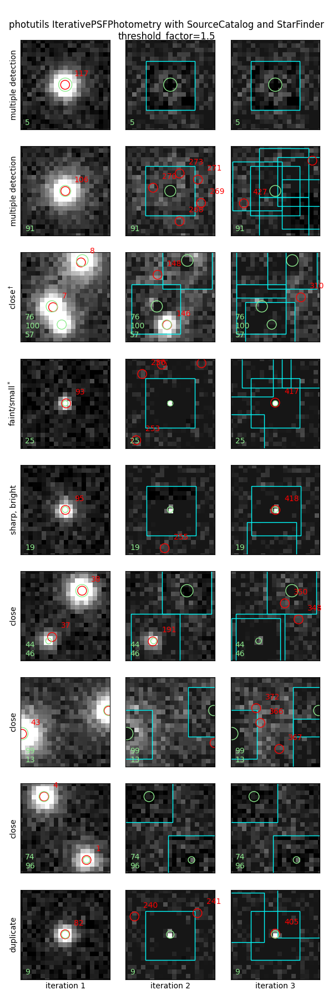

In [24]:
iter_residuals_file = Path(OUTPUT_DIRS['PSF_PHOT']).joinpath(src_basenames[0]+'.resid.pkl')
iter_residuals = load_object(iter_residuals_file)
reduc = Fits(post_proc.cat_table[DIFF_IMG_KEY][0]).data[0]

objs = {
    5: 'multiple detection',
    # 83: 'multiple detection',
    91: 'multiple detection',
    # 10: 
    (76,100,57): 'close$^\dagger$',
    25: 'faint/small$^*$',
    19: 'sharp, bright',
    (44,46): 'close',
    (99,13): 'close',
    (74,96): 'close',
    9: 'duplicate'
}

size = 20
offset = (-size//2+1,-size//2+1)
mul = 2
sub_box_size = 11

fig, axs = plt.subplots(nrows=len(objs),ncols=3,figsize=(3*mul,len(objs)*mul))
for i,obj in enumerate(list(objs.keys())):
    mask_poss = []
    for j,residual in enumerate([reduc]+iter_residuals):
        ax = axs[i][j]
        im = plot_image(ax,residual,colorbar=False)
        cat_table_itr = post_proc.cat_table[post_proc.cat_table['iter_detected'] == j+1]
        if not isinstance(obj,tuple):
            obj_ = np.asarray(obj)
            pos = get_pos(post_proc.true_table,obj,SEX_SRC_KEYS)
            ann = str(obj_)
        else:
            pos_xy = [get_pos(post_proc.true_table,o,SEX_SRC_KEYS) for o in obj]
            pos_x = np.nanmean([i for i,_ in pos_xy])
            pos_y = np.nanmean([i for _,i in pos_xy])
            pos = pos_x,pos_y
            ann = '\n'.join([str(o) for o in obj])
        if j > 0:
            poss = np.asarray(sum([i for i in mask_poss], []))
            for p in poss.reshape(-1, *poss.shape[-1:]):
                p = np.round(np.array(p))-sub_box_size//2-0.5
                artist = Rectangle(xy=p,height=sub_box_size,width=sub_box_size,fill=False,color='cyan',alpha=1)
                ax.add_artist(artist)
        det_poss = mark_from_cat(
            ax,
            keys=PSF_PHOT_SRC_KEYS,
            cat_table=cat_table_itr,
            bound=True,
            bounds=((pos[0]-size/2,pos[0]+size/2),(pos[1]-size/2,pos[1]+size/2))
        )
        mark_from_cat(
            ax,
            keys=SEX_SRC_KEYS,
            cat_table=post_proc.true_table,
            bound=True,
            bounds=((pos[0]-size/2,pos[0]+size/2),(pos[1]-size/2,pos[1]+size/2)),
            annotate=False,
            color='lightgreen'
        )
        if len(det_poss) != 0:
            mask_poss.append(det_poss)
        
        ax.text(pos[0]+offset[0],pos[1]+offset[1],ann,color='lightgreen')
        ax.set_xticks([])
        ax.set_yticks([])
        if j == 0:
            ax.set_ylabel(objs[obj])
        if i == len(objs)-1:
            ax.set_xlabel(f'iteration {j+1}')
        peek(ax,pos,size)
fig.suptitle('photutils IterativePSFPhotometry with SourceCatalog and StarFinder\nthreshold_factor=1.5')
fig.tight_layout()

save = True
name = 'iter_psf_detection_thresh_factor_1.5'
if save:
    # plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath('detection.eps'),format='eps')
    plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.png'),dpi=300)
    with open(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.mpl.pkl'), 'wb') as file:
        pickle.dump(plt.gcf(),file)
    dump_object(objs,Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.png.params'))
    

In [373]:
list(itertools.chain([1,[2,3]],[1,2]))

[1, [2, 3], 1, 2]

In [18]:
cat_table[cat_table['group_id'] == cat_table[cat_table['NUMBER'] == 96]['group_id']]

id,group_id,iter_detected,local_bkg,x_init,y_init,flux_init,x_fit,y_fit,flux_fit,x_err,y_err,flux_err,npixfit,group_size,qfit,cfit,flags,DIFFPATH,SCIPATH,REFPATH,NUMBER,a,b,angle
int64,int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,int64,float64,float64,int64,str127,str127,str1,int64,float64,float64,float64
96,96,1,0.0,581.9480536645607,41.33584060095085,9670.341977939535,581.4943450457656,41.98923295129239,3714.265992873001,0.18705774241709805,0.2013181361633496,290.4393417611527,25,1,0.17729931081842487,-0.007213667002531116,0,/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_auto_model_with_crop/detection/img_Moffat2D_gamma_1-3_alpha_1-2.fits,/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_auto_model_with_crop/detection/img_Moffat2D_gamma_1-3_alpha_1-2.fits,,96,2.0,2.0,0.0


## PSF and aper phot catalog

In [10]:
result_psf_file = Path(OUTPUT_DIRS['PSF_PHOT']).joinpath(src_basenames[0].replace('.fits','_sources.pkl'))
with open(result_psf_file, 'rb') as f:
    result_psf = pickle.load(f)
psf_table = result_psf.get_data()
psf_table

,NUMBER,FLUX_APER,FLUXERR_APER,FLUX_AUTO,FLUXERR_AUTO,FLUX_RADIUS,FLUX_MAX,X_IMAGE,Y_IMAGE,XPEAK_IMAGE,YPEAK_IMAGE,ERRX2_IMAGE,ERRY2_IMAGE,ALPHA_J2000,DELTA_J2000,A_IMAGE,B_IMAGE,THETA_IMAGE,ELONGATION,ELLIPTICITY,FWHM_IMAGE,FWHM_WORLD,FLAGS,NAXIS1,NAXIS2,xpos,ypos,xpeak,ypeak,ra,dec,fwhm,aimage,bimage,aimagerat,bimagerat,elong,cutoutScience,ZP,ZPSTD,DIFFPATH,SCIPATH,NPSFCAT,SAVEPATH,jd,exptime,MAGLIM,FILTER,X_SHAPE,Y_SHAPE,psfflux,psffluxunc,chipsf,xshift,yshift,magpsf,sigmapsf
0,1,330.796539,20.577946,3273.340576,102.997818,3.195617,140.277695,139.834808,14.014842,140,14,0.002345,0.002172,0.0,0.0,1.441979,1.379413,-26.234699,1.045357,0.043389,4.068625,4.068625,0,1000,1000,138.834808,13.014842,139,13,0.0,0.0,4.068625,1.441979,1.379413,0.354414,0.339037,1.045357,b'\x1f\x8b\x08\x00\xf1W\x9de\x02\xff\xec\xbaoT...,None,None,/Users/astqx/Desktop/DREAMS/test/pipeline/phot...,/Users/astqx/Desktop/DREAMS/test/pipeline/phot...,/Users/astqx/Desktop/DREAMS/test/pipeline/phot...,/Users/astqx/Desktop/DREAMS/test/pipeline/phot...,2.460318e+06,None,None,None,1000,1000,4209.568674,116.657279,1.033786,5,4,NaN,NaN
1,2,293.944519,19.662142,2392.200928,88.971237,2.672158,107.654640,117.030838,978.416565,117,978,0.002102,0.002612,0.0,0.0,1.321835,1.196720,77.500687,1.104548,0.094652,3.673490,3.673490,0,1000,1000,116.030838,977.416565,116,977,0.0,0.0,3.673490,1.321835,1.196720,0.359831,0.325772,1.104548,b'\x1f\x8b\x08\x00\xf1W\x9de\x02\xff\xec\x97\x...,None,None,/Users/astqx/Desktop/DREAMS/test/pipeline/phot...,/Users/astqx/Desktop/DREAMS/test/pipeline/phot...,/Users/astqx/Desktop/DREAMS/test/pipeline/phot...,/Users/astqx/Desktop/DREAMS/test/pipeline/phot...,2.460318e+06,None,None,None,1000,1000,3486.982935,110.362190,0.980131,4,5,NaN,NaN
2,3,311.038330,20.092129,1242.581177,59.157154,1.596072,131.191925,674.036316,965.622192,674,966,0.002522,0.001840,0.0,0.0,1.065878,0.936049,2.055806,1.138699,0.121805,2.739134,2.739134,0,1000,1000,673.036316,964.622192,673,965,0.0,0.0,2.739134,1.065878,0.936049,0.389130,0.341732,1.138699,b'\x1f\x8b\x08\x00\xf1W\x9de\x02\xff\xec\xb7oT...,None,None,/Users/astqx/Desktop/DREAMS/test/pipeline/phot...,/Users/astqx/Desktop/DREAMS/test/pipeline/phot...,/Users/astqx/Desktop/DREAMS/test/pipeline/phot...,/Users/astqx/Desktop/DREAMS/test/pipeline/phot...,2.460318e+06,None,None,None,1000,1000,2808.134906,108.419524,1.431400,4,5,NaN,NaN
3,4,455.984772,23.346870,3064.319580,89.076714,2.272287,187.932327,229.994568,962.204407,230,962,0.001702,0.001482,0.0,0.0,1.454168,1.373809,-1.259000,1.058493,0.055261,3.301506,3.301506,0,1000,1000,228.994568,961.204407,229,961,0.0,0.0,3.301506,1.454168,1.373809,0.440456,0.416116,1.058493,b'\x1f\x8b\x08\x00\xf1W\x9de\x02\xff\xec\x97oT...,None,None,/Users/astqx/Desktop/DREAMS/test/pipeline/phot...,/Users/astqx/Desktop/DREAMS/test/pipeline/phot...,/Users/astqx/Desktop/DREAMS/test/pipeline/phot...,/Users/astqx/Desktop/DREAMS/test/pipeline/phot...,2.460318e+06,None,None,None,1000,1000,5267.564446,129.804285,1.498340,5,4,NaN,NaN
4,5,394.712524,22.103296,3028.988525,89.211685,2.472904,144.439392,335.903076,959.333984,336,959,0.001918,0.001624,0.0,0.0,1.460423,1.368899,7.877403,1.066860,0.062670,3.975050,3.975050,0,1000,1000,334.903076,958.333984,335,958,0.0,0.0,3.975050,1.460423,1.368899,0.367398,0.344373,1.066860,b'\x1f\x8b\x08\x00\xf1W\x9de\x02\xff\xec\x97}T...,None,None,/Users/astqx/Desktop/DREAMS/test/pipeline/phot...,/Users/astqx/Desktop/DREAMS/test/pipeline/phot...,/Users/astqx/Desktop/DREAMS/test/pipeline/phot...,/Users/astqx/Desktop/DREAMS/test/pipeline/phot...,2.460318e+06,None,None,None,1000,1000,4741.047514,123.140707,1.138863,5,4,NaN,NaN
5,6,295.111298,19.752022,1739.273926,72.206978,2.107867,106.712364,59.858555,935.322449,60,935,0.002314,0.002324,0.0,0.0,1.169955,1.102038,-50.681767,1.061629,0.058051,3.358043,3.358043,0,1000,1000,58.858555,934.322449,59,934,0.0,0.0,3.358043,1.169955,1.102038,0.348404,0.328179,1.061629,b'\x1f\x8b\x08\x00\xf1W\x9de\x02\xff\xec\x97}T...,None,None,/Users/

In [11]:
result_aper_file = Path(OUTPUT_DIRS['APER_PHOT']).joinpath(src_basenames[0].replace('.fits','_sources.pkl'))
with open(result_aper_file, 'rb') as f:
    result_aper = pickle.load(f)
aper_table = QTable.from_pandas(result_aper.get_data())
aper_table.pprint

<bound method Table.pprint of <QTable length=93>
NUMBER FLUX_APER FLUXERR_APER ...    fluxucapbig    magapbig sigmagapbig
int32   float32    float32    ...      float64       object     object  
------ --------- ------------ ... ----------------- -------- -----------
     1 330.79654    20.577946 ... 570.8433446813171       --          --
     2 293.94452    19.662142 ... 600.9987990379979       --          --
     3 311.03833    20.092129 ... 644.5418636259606       --          --
     4 455.98477     23.34687 ... 654.6631465694204       --          --
     5 394.71252    22.103296 ... 663.2492571573124       --          --
     6  295.1113    19.752022 ... 699.0613362431644       --          --
     7  344.4578    20.878822 ... 637.1038974454007       --          --
     8 371.17075    21.564182 ... 722.5134130385837       --          --
     9 407.57034    22.392265 ... 720.1351972455163       --          --
    10  462.9422      23.4954 ... 723.3517434045689       --          --
  

In [275]:
aper_table[aper_table['NUMBER'] == 2]['chipsf']

0.874873951203818


## True table

### Make

In [75]:
def moffat2d(x, y, A, x0, y0, alpha, gamma):
    """
    Compute the value of the function f(x, y) = A * (1 + ((x - x0)**2 + (y - y0)**2) / gamma**2)**(-alpha)
    
    Parameters:
    x, y: float - coordinates
    A: float - Amplitude of the model.
    x0, y0: float - position of the maximum of the Moffat model.
    alpha: Power index of the Moffat model.
    gamma: Core width of the Moffat model.
    
    Returns:
    float: computed value of f(x, y)
    """
    return A * (1 + ((x - x0)**2 + (y - y0)**2) / gamma**2)**(-alpha)

def create_circular_mask(dim,prec,radius):
    # ref: https://stackoverflow.com/a/44874588/14094985
    dim_prec = np.asarray(dim)/prec
    center = dim_prec/2
    X,Y = np.ogrid[:dim_prec[0], :dim_prec[1]]
    dist_from_center = np.sqrt((X-center[0])**2 + (Y-center[1])**2)
    mask = dist_from_center <= radius/prec
    return mask

def flux_moffat(row,factor=10):
    amplitude = row['amplitude'] 
    alpha = row['alpha'] 
    gamma = row['gamma']
    fwhm = row['FWHM_IMAGE']
    
    radius = factor*fwhm
    halfsize = radius
    prec = 0.1
    
    x = np.arange(-halfsize,halfsize,prec)
    y = np.arange(-halfsize,halfsize,prec)
    X,Y = np.meshgrid(x,y)
    Z = moffat2d(X,Y,A=amplitude,x0=0,y0=0,alpha=alpha,gamma=gamma)

    mask = create_circular_mask((halfsize*2,halfsize*2),prec,radius=radius)
    Z[~mask] = 0

    return np.sum(Z)*prec**2

def flux_moffat2(row,factor=10):
    def gfun(x):
        return -radius
    def hfun(x):
        return radius
    
    amplitude = row['amplitude'] 
    alpha = row['alpha'] 
    gamma = row['gamma']
    fwhm = row['FWHM_IMAGE']
    radius = factor*fwhm

    total_flux = dblquad(moffat2d,-radius,radius,gfun,hfun,args=(amplitude,0,0,alpha,gamma))
    return total_flux[0]

def sex_table(table):
    size = len(table)
    table['NUMBER'] = np.arange(1,size+1,1)
    table[SEX_SRC_KEYS['y']] = table['y_0']
    table[SEX_SRC_KEYS['x']] = table['x_0']
    table[SEX_SRC_KEYS['a']] = table['gamma']
    table[SEX_SRC_KEYS['b']] = table['gamma']
    table[SEX_SRC_KEYS['angle']] = 0
    table['FWHM_IMAGE'] = 2*table['gamma']*np.sqrt(2**(1/table['alpha']) - 1)
    table['FLUX'] = list(map(flux_moffat, table))
    return table

for file in os.listdir(RAW_DIR):
    if file.endswith('ecsv'):
        true_filename = file
        true_file = Path(RAW_DIR).joinpath(true_filename)
        true_table = sex_table(QTable.read(true_file))
        true_table.write(Path(OUTPUT_DIRS['RES']).joinpath(true_filename),overwrite=True)
        true_table.pprint_all()

    amplitude             y_0                x_0               gamma              alpha        NUMBER      Y_IMAGE            X_IMAGE            A_IMAGE            B_IMAGE       THETA_IMAGE     FWHM_IMAGE            FLUX       
------------------ ------------------ ------------------ ------------------ ------------------ ------ ------------------ ------------------ ------------------ ------------------ ----------- ------------------ ------------------
 138.5355583899011  611.0112149225043  871.7604792424539  1.723183464067852 1.2599511700020156      1  611.0112149225043  871.7604792424539  1.723183464067852  1.723183464067852           0  2.951612477813569 3837.2697675748527
160.00251028994805  684.3383664469429  471.3294930181824  2.773382803668179 1.4572735414931803      2  684.3383664469429  471.3294930181824  2.773382803668179  2.773382803668179           0  4.328802806663373   7771.32506212254
109.96368964242448  977.4633430668724  116.0444498715909  2.098520981930891 1.4230705276

In [127]:
true_table = QTable.read(Path(OUTPUT_DIRS['RES']).joinpath(src_basenames[0]+'.ecsv'))
true_table.pprint_all()

    amplitude             y_0                x_0               gamma              alpha        NUMBER      Y_IMAGE            X_IMAGE            A_IMAGE            B_IMAGE       THETA_IMAGE     FWHM_IMAGE            FLUX       
------------------ ------------------ ------------------ ------------------ ------------------ ------ ------------------ ------------------ ------------------ ------------------ ----------- ------------------ ------------------
 138.5355583899011  611.0112149225043  871.7604792424539  1.723183464067852 1.2599511700020156      1  611.0112149225043  871.7604792424539  1.723183464067852  1.723183464067852           0  2.951612477813569 3837.2697675748527
160.00251028994805  684.3383664469429  471.3294930181824  2.773382803668179 1.4572735414931803      2  684.3383664469429  471.3294930181824  2.773382803668179  2.773382803668179           0  4.328802806663373   7771.32506212254
109.96368964242448  977.4633430668724  116.0444498715909  2.098520981930891 1.4230705276

In [15]:
true_table[true_table['NUMBER'] == 72]

amplitude,y_0,x_0,gamma,alpha,NUMBER,Y_IMAGE,X_IMAGE,A_IMAGE,B_IMAGE,THETA_IMAGE,FWHM_IMAGE,FLUX
float64,float64,float64,float64,float64,int64,float64,float64,float64,float64,int64,float64,float64
176.8776147252284,870.2034520738719,380.7567127735905,2.411535093691624,1.2999424291397492,72,870.2034520738719,380.7567127735905,2.411535093691624,2.411535093691624,0,4.04793542749416,8791.911901711392


### Visual

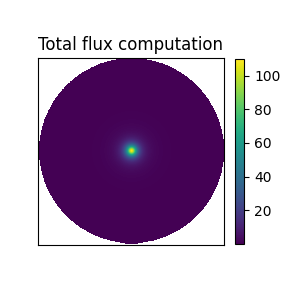

In [41]:
def flux_moffat_plot(row,factor=10):
    amplitude = row['amplitude'] 
    alpha = row['alpha'] 
    gamma = row['gamma']
    fwhm = row['FWHM_IMAGE']
    
    radius = factor*fwhm
    halfsize = radius
    prec = 0.1
    
    x = np.arange(-halfsize,halfsize,prec)
    y = np.arange(-halfsize,halfsize,prec)
    X,Y = np.meshgrid(x,y)
    Z = moffat2d(X,Y,A=amplitude,x0=0,y0=0,alpha=alpha,gamma=gamma)
    z = deepcopy(Z)

    mask = create_circular_mask((halfsize*2,halfsize*2),prec,radius=radius)
    Z[~mask] = 0
    
    total_flux = np.sum(Z)*prec**2
    
    Z_nan = np.where(Z==0., np.nan, Z)
    
    return total_flux, z, Z_nan, prec

rows = true_table[[2]]
fluxes = list(map(flux_moffat_plot,rows))

# mul =2
# fig, axs = plt.subplots(nrows=len(rows),ncols=2,constrained_layout=True,figsize=(2*mul,len(rows)*mul+0.2))
# for i in range(len(rows)):
#     ax = axs
#     ax[0].imshow(fluxes[i][1])
#     ax[0].set_xlabel('model')
#     im = ax[1].imshow(fluxes[i][2])
#     fig.colorbar(im,ax=ax[1],shrink=0.9)
#     # ax[1].grid(visible=True,which='minor', color='k', linestyle='-',linewidth=2)
#     ax[1].grid(True)
#     ax[1].set_xlabel('masked model')

# [fig.delaxes(ax) for ax in axs.flatten() if not ax.has_data()]
# # [ax.set_xticks([]) or ax.set_yticks([]) for ax in axs.flatten()]
# plt.suptitle('Total flux computation')
# plt.show()

plt.figure(clear=True,figsize=(3,3))
im = plt.imshow(fluxes[0][2])
plt.colorbar(im,shrink=0.8)
plt.gca().set_xticks([])
plt.gca().set_yticks([])
plt.title('Total flux computation')
plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath('total_flux_computation.png'),dpi=300)
plt.show()

[]

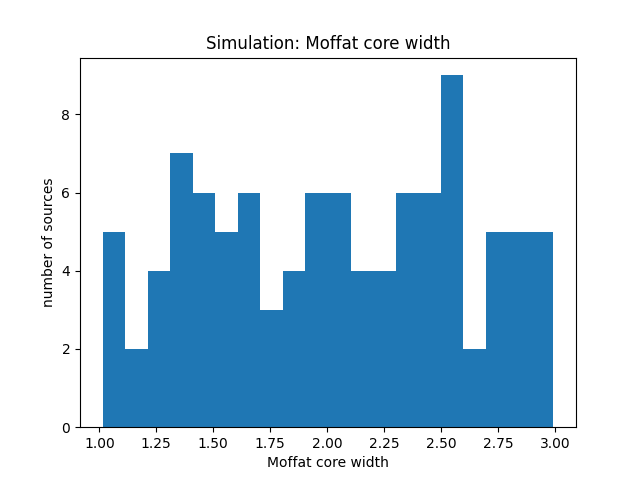

In [30]:
core_width = true_table['gamma']
counts, bins = np.histogram(core_width,bins=20)
plt.figure(clear=True)
plt.stairs(counts, bins, fill=True)
plt.title('Simulation: Moffat core width')
plt.ylabel('number of sources')
plt.xlabel('Moffat core width')
name = 'sim_gamma'
save = True
if save:
    # plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath('detection.eps'),format='eps')
    plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.png'),dpi=300)
    with open(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.mpl.pkl'), 'wb') as file:
        pickle.dump(plt.gcf(),file)
plt.plot()

[]

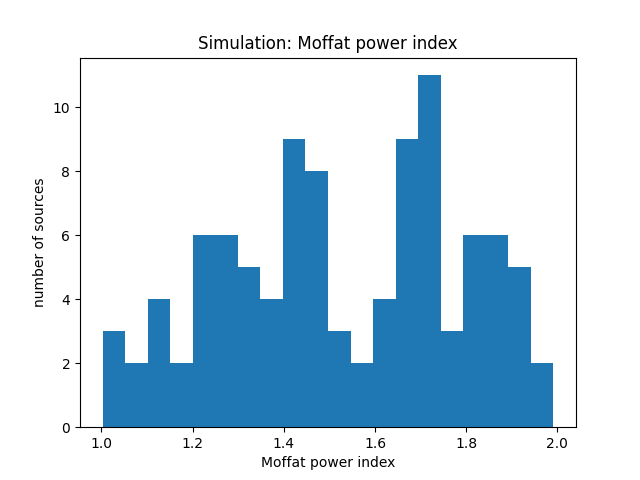

In [31]:
core_width = true_table['alpha']
counts, bins = np.histogram(core_width,bins=20)
plt.figure(clear=True)
plt.stairs(counts, bins, fill=True)
plt.title('Simulation: Moffat power index')
plt.ylabel('number of sources')
plt.xlabel('Moffat power index')
name = 'sim_alpha'
save = True
if save:
    # plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath('detection.eps'),format='eps')
    plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.png'),dpi=300)
    with open(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.mpl.pkl'), 'wb') as file:
        pickle.dump(plt.gcf(),file)
plt.plot()

[]

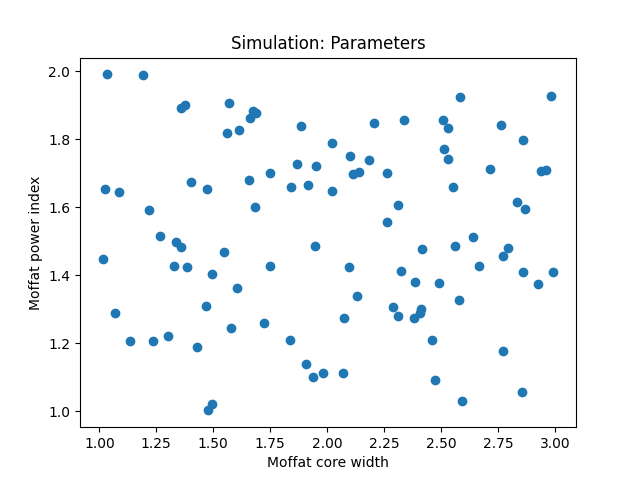

In [33]:
core_width = true_table['gamma']
power_index = true_table['alpha']
counts, bins = np.histogram(core_width,bins=30)
plt.figure(clear=True)
plt.scatter(core_width,power_index)
plt.title('Simulation: Parameters')
plt.ylabel('Moffat power index')
plt.xlabel('Moffat core width')
name = 'sim_alpha_gamma'
save = True
if save:
    # plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath('detection.eps'),format='eps')
    plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.png'),dpi=300)
    with open(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.mpl.pkl'), 'wb') as file:
        pickle.dump(plt.gcf(),file)
plt.plot()

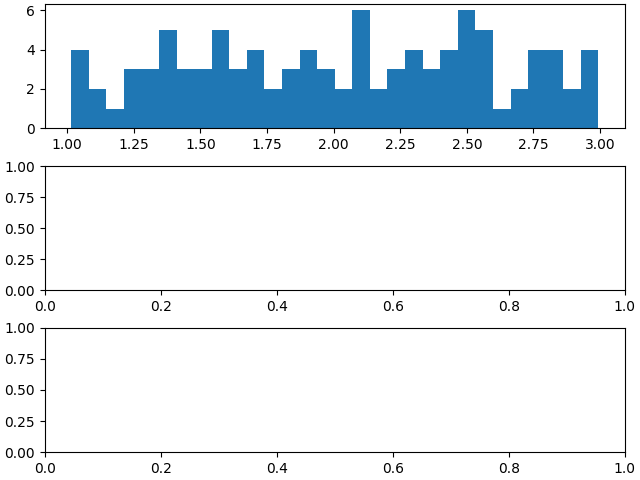

In [77]:
fig, axs = plt.subplots(ncols=1,nrows=3,constrained_layout=True)

core_width = true_table['gamma']
counts, bins = np.histogram(core_width,bins=30)
axs[0].stairs(counts,bins,fill=True)
axs[0].ylabel

plt.show()

### Plots

Filename: /Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_5/detection/img_Moffat2D_gamma_1-3_alpha_1-2.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      27   (1000, 1000)   float64   


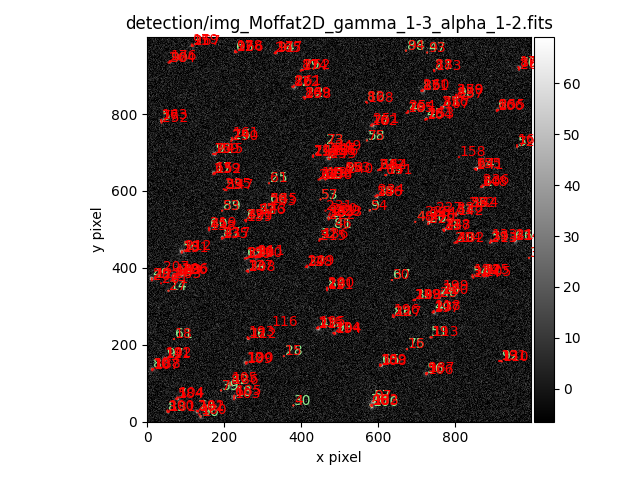

In [39]:
red_img = Fits(cat_table[DIFF_IMG_KEY][0])
ax = red_img.image()
red_img.mark_from_cat(keys=SEX_SRC_KEYS, cat_table=true_table, color='lightgreen')
red_img.mark_from_cat(keys=PSF_PHOT_SRC_KEYS, cat_table=cat_table)
save = True
name = 'detection_psf_phot'
if save:
    plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.eps'),format='eps')
    plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.png'),dpi=300)
    with open(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.mpl.pkl'), 'wb') as file:
        pickle.dump(plt.gcf(),file)
plt.show()

In [40]:
# id = 'NUMBER'
# peek(ax,get_pos(cat_table,77,MIRAR_SRC_KEYS),10)
peek(ax,get_pos(true_table,76,SEX_SRC_KEYS),25)

In [41]:
ax.set_title('')
plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath('iter_psf_100_183_close.png'),dpi=300)

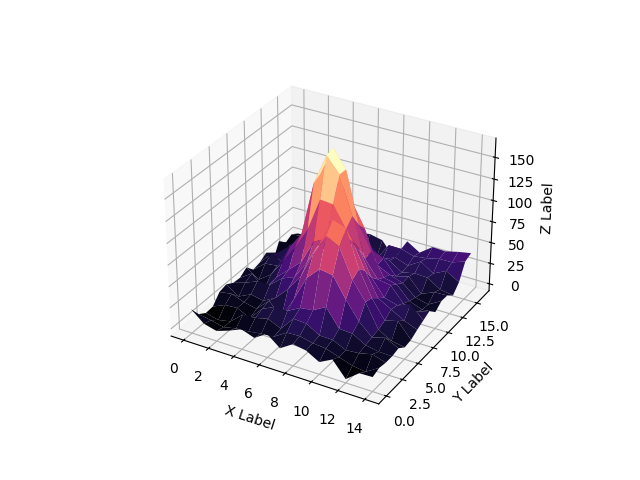

In [30]:
# 3D plot

imgdata = red_img.data[0][33:50, 575:590] 
# display(imgdata)
x = np.arange(imgdata.shape[1])
y = np.arange(imgdata.shape[0])
z = imgdata

X,Y = np.meshgrid(x, y)
Z = z
xpos = X.ravel()
ypos = Y.ravel()
zpos = np.zeros_like(xpos)

dx = dy = 1
dz = z.ravel()

fig = plt.figure(clear=True)
ax = fig.add_subplot(111, projection='3d')

# ax.bar3d(xpos,ypos,zpos,dx,dy,dz)
ax.plot_surface(X,Y,Z,cmap='magma')

ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')
plt.show()
plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath('blended.jpg'),dpi=300)

## Detection map

In [15]:
# ref: https://stackoverflow.com/a/48812832/14094985
def create_ellipse(center, lengths, angle=0):
    """
    create a shapely ellipse. adapted from
    https://gis.stackexchange.com/a/243462
    """
    circ = Point(center).buffer(1)
    ell = affinity.scale(circ, lengths[0]/2, lengths[1]/2)
    ellr = affinity.rotate(ell, angle)
    return ellr

def distance(coord1,coord2):
    return np.sqrt((coord1[0]-coord2[0])**2 + (coord1[1]-coord2[1])**2)

def get_intersection(det,src,det_keys,src_keys,plot=False):
    global counter
    det_ell = create_ellipse(
        center = [det[det_keys['x']], det[det_keys['y']]],
        lengths = [det[det_keys['a']], det[det_keys['b']]],
        angle = det[det_keys['angle']]
    )
    src_ell = create_ellipse(
        center = [src[src_keys['x']], src[src_keys['y']]],
        lengths = [src[src_keys['a']], src[src_keys['b']]],
        angle = src[src_keys['angle']]
    )
    if plot:
        plt.figure(clear=True)
        shapely.plotting.plot_polygon(det_ell)
        shapely.plotting.plot_polygon(src_ell)
        plt.show()
    intersect = src_ell.intersection(det_ell)
    if intersect.area == 0:
        return False
    return {
        'det': det_ell.area,
        'src': src_ell.area,
        'int': intersect.area,
        'int/det': intersect.area/det_ell.area,
        'int/src': intersect.area/src_ell.area,
        'dist': det_ell.distance(src_ell),
        'det_in_src': src_ell.covers(det_ell),
        'src_in_det': src_ell.covers(det_ell),
    }
    
# true area based on FWHM of Gaussian or core width of Moffat
# if more than 50% of the area intersects
def match_detection(det,src,**kwargs):
    int_param = get_intersection(det=det,src=src,**kwargs)
    
    # if psf_phot and int_param and int_param['src_in_det']:
        # return int_param
    
    if int_param and (int_param['int/src'] >= 0.5 or int_param['det_in_src'] or (psf_phot and int_param['int/det'] >= 0.5)):
        return int_param
    return False

def create_detection_map(
    src_table: QTable,
    det_table: QTable, 
    src_table_keys: dict, 
    det_table_keys: dict
):
    base_cols = ['detection','source',]
    base_dtypes = [np.dtype('int64'),np.dtype('int64')]
    copy_det_cols = list(det_table.columns)
    for col in copy_det_cols:
        if 'cutout' in col:
            copy_det_cols.remove(col)
    copy_det_dtypes = [det_table[col].dtype for col in copy_det_cols]
    copy_src_cols = list(src_table.columns)
    copy_src_dtypes = [src_table[col].dtype for col in copy_src_cols]
    copy_src_cols_dup = list(src_table.columns)
    common_cols = np.intersect1d(copy_det_cols,copy_src_cols)
    for i, col in enumerate(copy_src_cols):
        if col in common_cols:
            copy_src_cols_dup[i] = col+'_SRC'
    match_cols = ['dist','det','src','int','int/det','int/src','det_in_src','src_in_det']
    match_dtypes = [np.dtype('float64')]*len(match_cols)
    # print(len(base_cols+match_cols+copy_det_cols+copy_src_cols_dup))
    # print(len(base_dtypes+match_dtypes+copy_det_dtypes+copy_src_dtypes))
    match_table = QTable(
        names=base_cols+match_cols+copy_det_cols+copy_src_cols_dup,
        dtype=base_dtypes+match_dtypes+copy_det_dtypes+copy_src_dtypes,
    )
    for det_row in det_table:
        for src_row in src_table:
            # plot = det_row['NUMBER'] == 90 and src_row['NUMBER'] == 76
            plot = False
            match = match_detection(
                src=src_row,
                det=det_row,
                det_keys=det_table_keys,
                src_keys=src_table_keys,
                plot=plot,
            )
            if match:
                match_table.add_row((
                    det_row['NUMBER'],
                    src_row['NUMBER'],
                    *[match[i] for i in match_cols],
                    *det_row[copy_det_cols],
                    *src_row[copy_src_cols]
                ))
    return match_table

psf_phot = True
name = 'detection_map_psf_phot_thresh_factor_1.5_'
save = True
det_map = create_detection_map(
    src_table=true_table,
    det_table=cat_table,
    src_table_keys=SEX_SRC_KEYS,
    det_table_keys=PSF_PHOT_SRC_KEYS
)
if save:
    det_map.write(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.ecsv'),overwrite=True)
print('len:',len(det_map))
det_map.pprint_all()

len: 109
detection source dist        det                src                int               int/det             int/src       det_in_src src_in_det  id group_id iter_detected       local_bkg             x_init             y_init           flux_init            x_fit              y_fit             flux_fit              x_err                y_err              flux_err      npixfit group_size          qfit                   cfit          flags                                                         DIFFPATH                                                                                                                 SCIPATH                                                          REFPATH NUMBER  a   b  angle     amplitude             y_0                x_0               gamma              alpha        NUMBER_SRC      Y_IMAGE            X_IMAGE            A_IMAGE            B_IMAGE       THETA_IMAGE     FWHM_IMAGE            FLUX       
--------- ------ ---- ------------------ ----------

In [349]:
name = 'detection_map_psf_phot_thresh_factor_1.5'
det_map = open_ecsv(OUTPUT_DIRS['RES'],f'{name}.ecsv')
print('len:',len(det_map))
det_map.pprint_all()

len: 97
detection source dist        det                src                int               int/det             int/src       det_in_src src_in_det  id group_id iter_detected local_bkg       x_init             y_init           flux_init            x_fit              y_fit             flux_fit             x_err                y_err              flux_err      npixfit group_size         qfit                  cfit          flags                                                   DIFFPATH                                                                                                     SCIPATH                                                    REFPATH NUMBER  a   b  angle     amplitude             y_0                x_0               gamma              alpha        NUMBER_SRC      Y_IMAGE            X_IMAGE            A_IMAGE            B_IMAGE       THETA_IMAGE     FWHM_IMAGE            FLUX       
--------- ------ ---- ------------------ ------------------ ------------------ ------------

### Duplicates

In [317]:
all_found = det_map['source']
unique, counts = np.unique(all_found, return_counts=True, axis = 0)
dups = unique[counts > 1]

dup_table = QTable(dtype=det_map.dtype)
for dup in dups:
    dup_mask = det_map['source'] == dup
    rows = det_map[dup_mask]
    for row in rows:
        dup_table.add_row(row)

save = False
if save:
    write_ecsv(dup_table,OUTPUT_DIRS['RES'],f"{name}_dups.ecsv")
print('len:',len(dup_table))
dup_table.pprint_all()

len: 22
detection source dist        det                src                int               int/det            int/src       det_in_src src_in_det  id group_id iter_detected      local_bkg             x_init             y_init           flux_init            x_fit              y_fit             flux_fit             x_err                y_err              flux_err      npixfit group_size         qfit                  cfit          flags                                                         DIFFPATH                                                                                                                 SCIPATH                                                          REFPATH NUMBER  a   b  angle     amplitude             y_0                x_0               gamma              alpha        NUMBER_SRC      Y_IMAGE            X_IMAGE            A_IMAGE            B_IMAGE       THETA_IMAGE     FWHM_IMAGE            FLUX       
--------- ------ ---- ------------------ ----------------

In [319]:
len(unique)

96

### Non-detections

In [17]:
non_det = np.setdiff1d(true_table['NUMBER'],det_map['source'])

non_det_table = QTable(dtype=true_table.dtype)
for row in true_table:
    if row['NUMBER'] in non_det:
        non_det_table.add_row(row)

save = True
if save:
    write_ecsv(non_det_table,OUTPUT_DIRS['RES'],f"{name}_nondet.ecsv")

print('len:',len(non_det_table))
non_det_table.pprint_all()  


len: 4
    amplitude             y_0               x_0              gamma              alpha        NUMBER      Y_IMAGE           X_IMAGE           A_IMAGE            B_IMAGE       THETA_IMAGE     FWHM_IMAGE            FLUX       
------------------ ----------------- ----------------- ------------------ ------------------ ------ ----------------- ----------------- ------------------ ------------------ ----------- ------------------ ------------------
160.81590183862988 619.9620066659014  317.014357335213 1.1937086710161113 1.9882423797403144     25 619.9620066659014  317.014357335213 1.1937086710161113 1.1937086710161113           0  1.541900047824846  723.8606358692779
156.91815396519027 41.85564337195557 380.1206867280051  1.377336076118078  1.902150705479459     30 41.85564337195557 380.1206867280051  1.377336076118078  1.377336076118078           0  1.826521260979027 1026.9039670272705
106.95572784102099 803.8778460640585 677.6557900722528  1.684617754431303  1.601034240023695     

Filename: /Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_4/detection/img_Moffat2D_gamma_1-3_alpha_1-2.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      27   (1000, 1000)   float64   


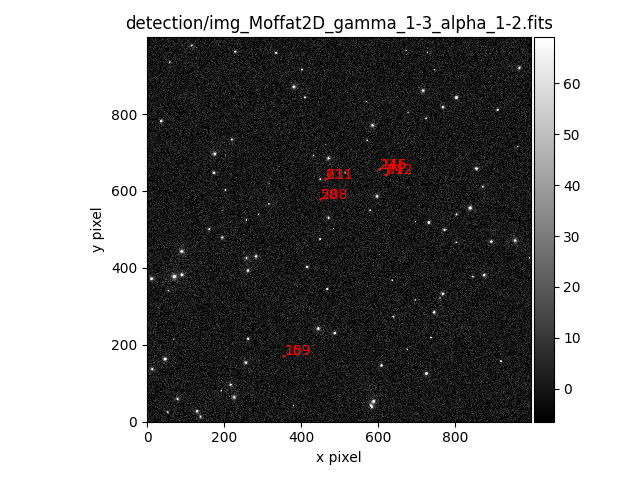

In [67]:
red_img = Fits(cat_table[DIFF_IMG_KEY][0])
ax = red_img.image()
# red_img.mark_from_cat(keys=SEX_SRC_KEYS, cat_table=true_table, color='lightgreen')
red_img.mark_from_cat(keys=PSF_PHOT_SRC_KEYS, cat_table=dup_table)
save = False
name = 'detection_psf_phot_dups'
if save:
    plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.eps'),format='eps')
    plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.png'),dpi=300)
    with open(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.mpl.pkl'), 'wb') as file:
        pickle.dump(plt.gcf(),file)
plt.show()

In [70]:
peek(ax,get_pos(dup_table,0,SEX_SRC_KEYS),25)

In [23]:
rejected = np.setdiff1d(cat_table['NUMBER'],det_map['detection'])
print(f"rejected detections: {list(rejected)}")
non_det = np.setdiff1d(true_table['NUMBER'],det_map['source'])
print(f"undetected sources: {list(non_det)}")
with open(Path(OUTPUT_DIRS['RES']).joinpath('detection_stats.txt'),'w') as file:
    file.write(f"rejected detections: {rejected}\nundetected sources: {list(non_det)}")

rejected detections: [4, 22, 31, 37, 67, 70, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 144, 145, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 209, 210, 213, 214, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234]
undetected sources: [12, 13, 46, 57, 76, 96, 99, 100]


## Plots

In [190]:
def log_model(x,A,B):
    return A*np.log(B*x)

def flux_error_psf(table,keys):
    flux = [ufloat(n,s) for n,s in zip(table[keys['psf_flux']],table[keys['psf_fluxerr']])]
    flux_error = (table[keys['FLUX']] - flux)/table[keys['FLUX']]
    return np.array([col.n for col in flux_error]),np.array([col.s for col in flux_error])

def flux_error_aper(flux,fluxerr):
    flux = [ufloat(n,s) for n,s in zip(det_map[flux],det_map[fluxerr])]
    flux_error = (det_map[flux] - flux)/det_map[flux]
    return np.array([col.n for col in flux_error]),np.array([col.s for col in flux_error])

# def sn_simple(obj,bkg):
#     return obj/np.sqrt(obj + )

def det_dist(xpos,ypos,tag=''):
    det_pos = det_map[xpos],det_map[ypos]
    src_pos = det_map['X_IMAGE'+tag],det_map['Y_IMAGE'+tag]
    dist = np.sqrt((det_pos[0]-src_pos[0])**2 + (det_pos[1]-src_pos[1])**2)
    return dist

def det_error(xpos,ypos,tag=''):
    error_x = (det_map['X_IMAGE'+tag]-det_map[xpos])/det_map['X_IMAGE'+tag]
    error_y = (det_map['Y_IMAGE'+tag]-det_map[ypos])/det_map['Y_IMAGE'+tag]
    error = np.sqrt(error_x**2 + error_y**2)
    return error,error_x,error_y

def psf_shift(xpos,ypos):
    shift_x = det_map['xshift']
    shift_y = det_map['yshift']
    shift = np.sqrt(shift_x**2 + shift_y**2)
    return shift,shift_x,shift_y


iter_cmap = ['tab:blue','tab:orange','tab:red']
iter_omap = ['o',r'$\blacktriangle$',r'$\blacksquare$']

def make_iter_masks(table):
    iters = len(iter_map)
    iter_masks = []
    for i in range(iters):
        iter_masks.append(table['iter_detected'] == i+1)
    return iter_masks
    

Filename: /Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_0/psf_phot/img_Moffat2D_gamma_1-3_alpha_1-2_(41, 41)_(620,641).fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      26   (41, 41)   float32   
Filename: /Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_0/psf_model/img_Moffat2D_gamma_1-3_alpha_1-2.psfmodel
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       6   (41, 41)   float32   


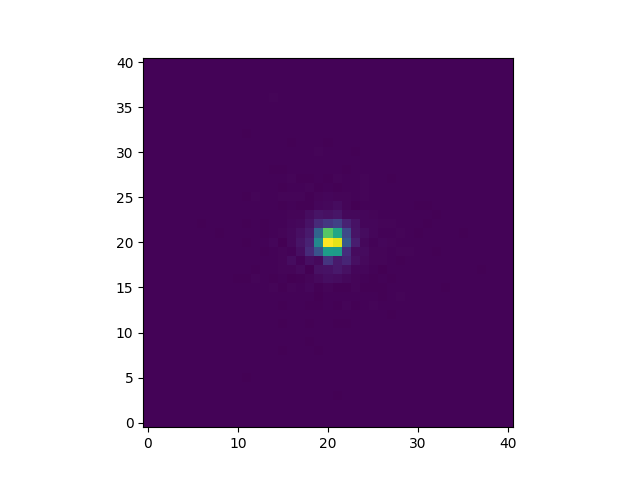

2941.2734771941386

In [305]:
cutout = Fits('/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_0/psf_phot/img_Moffat2D_gamma_1-3_alpha_1-2_(41, 41)_(620,641).fits')
# cutout.image()
psfmodel = Fits('/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_0/psf_model/img_Moffat2D_gamma_1-3_alpha_1-2.psfmodel')
# psfmodel.image()
mul = psfmodel.data[0] * cutout.data[0]
plt.figure(clear=True)
plt.imshow(mul,origin='lower')
plt.show()
mlphot = np.nansum(psfmodel.data[0] * cutout.data[0]) / np.nansum(np.square(psfmodel.data[0]))
mlphot


### PSF Flux error

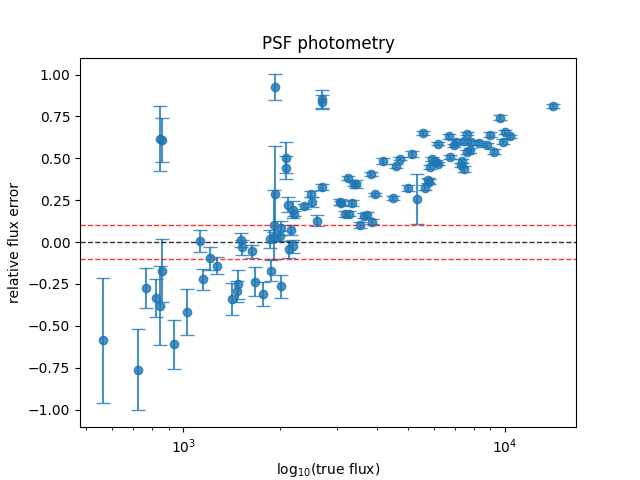

In [558]:
# flux error vs log(true)
psf_flux_error = flux_error_psf('flux_fit','flux_err')
# print(psf_flux_error)
plt.figure(clear=True)
# plt.scatter(np.log10(det_map['FLUX']),flux_error_psf())
# plt.errorbar(np.log10(det_map['FLUX']),psf_flux_error[0],yerr=psf_flux_error[1],fmt='o',capsize=5,alpha=0.8)
plt.errorbar(det_map['FLUX'],psf_flux_error[0],yerr=psf_flux_error[1],fmt='o',capsize=5,alpha=0.8)
plt.xscale('log',base=10) 
# plt.yscale('log',base=10) 
plt.axhline(0,linewidth=1,linestyle='--',color='k',alpha=0.8)
plt.axhline(0.1,linewidth=1,linestyle='--',color='r',alpha=0.8)
plt.axhline(-0.1,linewidth=1,linestyle='--',color='r',alpha=0.8)
plt.title('PSF photometry')
plt.xlabel('log$_{10}$(true flux)')
plt.ylabel('relative flux error')
save = True
name = 'flux_error_psf_thresh_factor_1.5'
if save:
    # plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath('detection.eps'),format='eps')
    plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.png'),dpi=300)
    with open(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.mpl.pkl'), 'wb') as file:
        pickle.dump(plt.gcf(),file)
plt.show()


/var/folders/n1/nl_dwlrx4v9_6j5wdwq5xnwh0000gn/T/ipykernel_74271/2675243149.py:2: RuntimeWarning: invalid value encountered in log
  return A*np.log(B*x)
/var/folders/n1/nl_dwlrx4v9_6j5wdwq5xnwh0000gn/T/ipykernel_74271/2597549621.py:16: RuntimeWarning: invalid value encountered in sqrt
  uncs = np.sqrt(np.array(covs))


A = 0.31422951754647216+-0.01915295713941321
B = 0.0007179545238063547+-7.811857026889042e-05


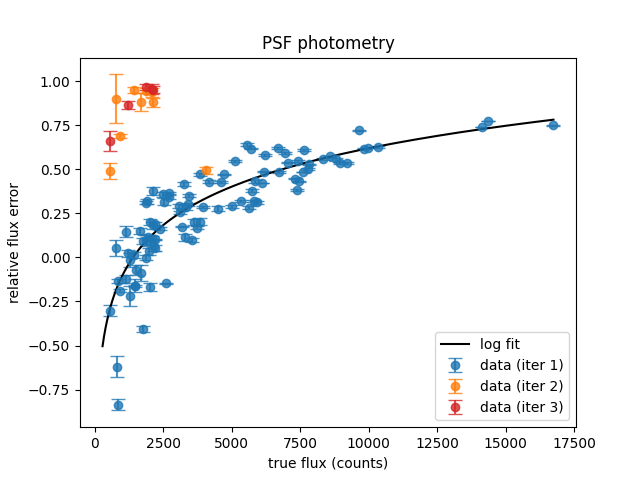

In [21]:
name = 'flux_error_psf_log'
# flux error vs true TODO: vs S/N
psf_flux_error = flux_error_psf(det_map,PHOTUTILS_KEYS)

iter_map = ['tab:blue','tab:orange','tab:red']
iter_masks = []
for i in range(len(iter_map)):
    iter_masks.append(det_map['iter_detected'] == i+1)

x = det_map['FLUX'] # !also do with SNR
y = psf_flux_error[0]
sigma = psf_flux_error[1]

names = ['A','B']
params,covs = curve_fit(log_model,x,y,sigma=sigma)
uncs = np.sqrt(np.array(covs))
for i, (param,unc) in enumerate(zip(params,uncs)):
    print(f"{names[i]} = {param}+-{unc[i]}")

xfit = np.arange(min(x)-min(x)/2,max(x),0.01)
yfit = log_model(xfit,*params)

plt.figure(clear=True)
for i,mask in enumerate(iter_masks):
    plt.errorbar(x[mask],y[mask],yerr=sigma[mask],fmt='o',capsize=5,alpha=0.8,color=iter_map[i],label=f'data (iter {i+1})')
plt.plot(xfit,yfit,label='log fit',color='k')
# plt.xscale('log',base=10) 
# plt.yscale('log',base=10)
# plt.axhline(0,linewidth=1,linestyle='--',color='k',alpha=0.8)
# plt.axhline(0.1,linewidth=1,linestyle='--',color='r',alpha=0.8)
# plt.axhline(-0.1,linewidth=1,linestyle='--',color='r',alpha=0.8)
plt.legend()
plt.title('PSF photometry')
plt.xlabel('true flux (counts)')
plt.ylabel('relative flux error')
save = True
if save:
    # plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath('detection.eps'),format='eps')
    plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.png'),dpi=300)
    with open(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.mpl.pkl'), 'wb') as file:
        pickle.dump(plt.gcf(),file)
plt.show()
# error bar in groups 
# color bar based on location or limits
# S/N x axis
# hist of params of initial distribution
#   compare the initial and final distributions (and multiple results with diff params)
# convolution in segment map?

/var/folders/n1/nl_dwlrx4v9_6j5wdwq5xnwh0000gn/T/ipykernel_74271/3999724169.py:18: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plt.errorbar(


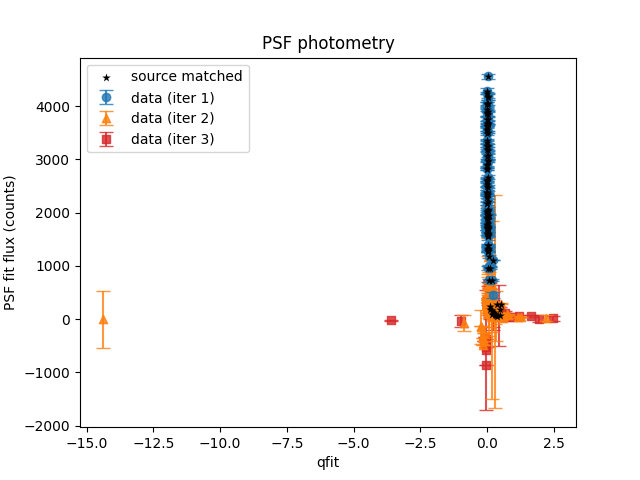

In [22]:
name = 'flux_qfit_all'
# flux error vs true TODO: vs S/N

iter_cmap = ['tab:blue','tab:orange','tab:red']
iter_omap = ['o',r'$\blacktriangle$',r'$\blacksquare$']
iters = len(iter_map)
iter_masks = []
for i in range(iters):
    iter_masks.append(cat_table['iter_detected'] == i+1)

x = cat_table['qfit'] # !also do with SNR
y = cat_table['flux_fit']
sigma = cat_table['flux_err']

plt.figure(clear=True)
for i in range(iters):
    rev_i = -1-i
    plt.errorbar(
        x[iter_masks[i]],y[iter_masks[i]],yerr=sigma[iter_masks[i]],
        fmt='o',marker=iter_omap[i],capsize=5,alpha=0.8,
        color=iter_cmap[i],label=f'data (iter {i+1})',zorder=99-i
    )
plt.scatter(det_map['qfit'],det_map['flux_fit'],color='k',zorder=100,marker=r'$\bigstar$',linewidths=0.01,label='source matched')
plt.legend()
plt.title('PSF photometry')
plt.xlabel('qfit')
plt.ylabel('PSF fit flux (counts)')
save = True
if save:
    # plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath('detection.eps'),format='eps')
    plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.png'),dpi=300)
    with open(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.mpl.pkl'), 'wb') as file:
        pickle.dump(plt.gcf(),file)
plt.show()
# error bar in groups 
# color bar based on location or limits
# S/N x axis
# hist of params of initial distribution
#   compare the initial and final distributions (and multiple results with diff params)
# convolution in segment map?

# TODO: check the generality of the plot below

In [364]:
def get_perc_string(num,total):
    return f"{100*num/total:.1f}%"

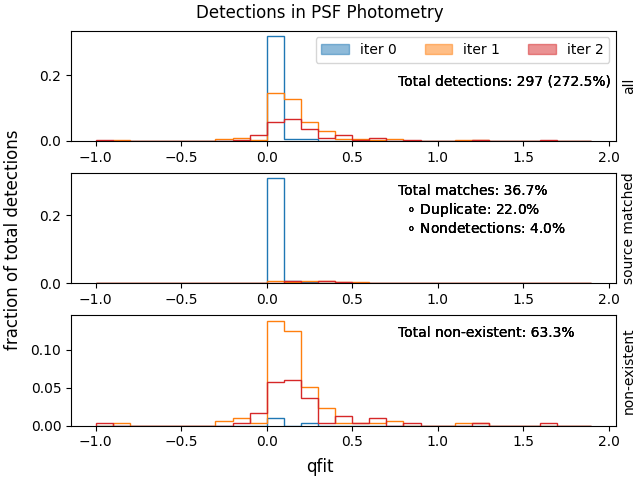

In [366]:
name = 'flux_qfit_all_hist'

iter_masks = make_iter_masks(cat_table)
iter_masks_det = make_iter_masks(det_map)
iter_masks_dup = make_iter_masks(dup_table)

param = 'qfit'
x = cat_table[param] # !also do with SNR
x_det = det_map[param]
x_dup = dup_table[param]
y = cat_table['flux_fit']

counts_all = []
counts_all_det = []
counts_all_dup = []
bins_all = []

bins = np.arange(-1,2,0.1)
for mask in iter_masks:
    counts, _ = np.histogram(x[mask],bins=bins)
    counts_all.append(counts)
    # bins_all.append(bins)
    
for mask in iter_masks_det:
    counts, _ = np.histogram(x_det[mask],bins=bins)
    counts_all_det.append(counts)

for mask in iter_masks_dup:
    counts, _ = np.histogram(x_dup[mask],bins=bins)
    counts_all_dup.append(counts)

counts_perc = np.asarray(counts_all)/len(cat_table)
counts_perc_det = np.asarray(counts_all_det)/len(cat_table)
counts_diff_perc = np.asarray(counts_all)-np.asarray(counts_all_det)/len(cat_table)

# fig, axs = plt.subplot_mosaic('a;b')
fig, axs = plt.subplots(ncols=1,nrows=3, layout='constrained')

# height, bins, patches = plt.hist(x_all,bins=10,color=iter_cmap)
# plt.xticks(np.round(bins,2))
for i,counts in enumerate(counts_perc):
    axs[0].hist(bins[:-1], bins, weights=counts, histtype='step', fill=False, color=iter_cmap[i], alpha=1, label=f"iter {i}") 
    axs[0].set_ylabel('all')
    axs[0].yaxis.set_label_position("right")
    axs[0].text(0.6,0.6, f"Total detections: {len(cat_table)} ({get_perc_string(len(cat_table),len(det_map))})", ha='left', va='top', transform=axs[0].transAxes)
    axs[0].legend(lines, labels, loc='upper right', ncol=3)

label_parts = [
    f"Total matches: {get_perc_string(len(det_map),len(cat_table))}",
    # f"Matched detections: {len)}",
    # f"Total detections: {len(cat_table)}"
    f"  $\circ$ Duplicate: {get_perc_string(len(dup_table),len(true_table))}",
    f"  $\circ$ Nondetections: {get_perc_string(len(non_det_table),len(true_table))}"
]

for i,counts in enumerate(counts_perc_det):
    axs[1].hist(bins[:-1], bins, weights=counts, histtype='step', fill=False, color=iter_cmap[i], alpha=1, ) 
    axs[1].set_ylabel('source matched')
    axs[1].yaxis.set_label_position("right")
    axs[1].text(0.6, 0.9, '\n'.join(label_parts), ha='left', va='top', transform=axs[1].transAxes)

for i,counts in enumerate(counts_diff_prec):
    axs[2].hist(bins[:-1], bins, weights=counts, histtype='step', fill=False, color=iter_cmap[i], alpha=1, ) 
    axs[2].set_ylabel('non-existent')
    axs[2].yaxis.set_label_position("right")
    axs[2].text(0.6, 0.9, f"Total non-existent: {get_perc_string(len(cat_table)-len(det_map),len(cat_table))}", ha='left', va='top', transform=axs[2].transAxes)


fig.suptitle('Detections in PSF Photometry')
fig.supxlabel('qfit')
fig.supylabel('fraction of total detections')
        
plt.show()

In [35]:
x_all[0]

0.00848944869963972
0.009120233063894843
0.011168038571689562
0.21049191663091332
0.006508726733929994
0.021569147066375916
0.05087707221857085
0.008980414734793704
0.008915007218544
0.010372567940683062
0.014186759515804098


In [ ]:
name = 'flux_error_psf_sn'


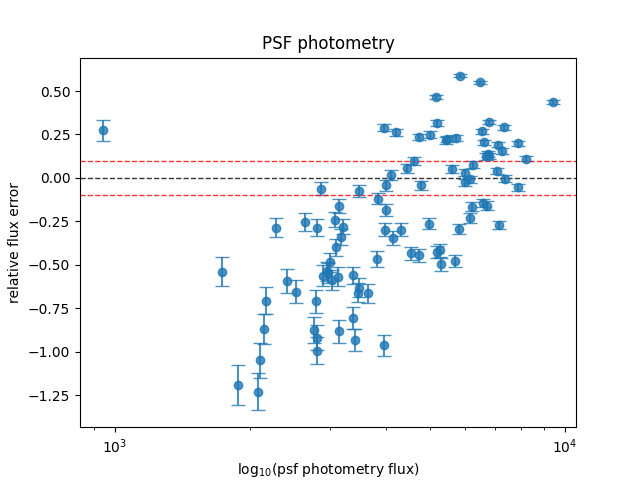

In [33]:
# flux error vs det
psf_flux_error = flux_error_psf()
plt.figure(clear=True)
# plt.scatter(np.log10(det_map['FLUX']),flux_error_psf())
plt.errorbar(det_map['psfflux'],psf_flux_error[0],yerr=psf_flux_error[1],fmt='o',capsize=5,alpha=0.8)
plt.xscale('log',base=10) 
# plt.yscale('log',base=10) 
plt.axhline(0,linewidth=1,linestyle='--',color='k',alpha=0.8)
plt.axhline(0.1,linewidth=1,linestyle='--',color='r',alpha=0.8)
plt.axhline(-0.1,linewidth=1,linestyle='--',color='r',alpha=0.8)
plt.title('PSF photometry')
plt.xlabel('log$_{10}$(psf photometry flux)')
plt.ylabel('relative flux error')
save = False
name = 'flux_error_psf_psf'
if save:
    # plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath('detection.eps'),format='eps')
    plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.png'),dpi=300)
    with open(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.mpl.pkl'), 'wb') as file:
        pickle.dump(plt.gcf(),file)
plt.show()

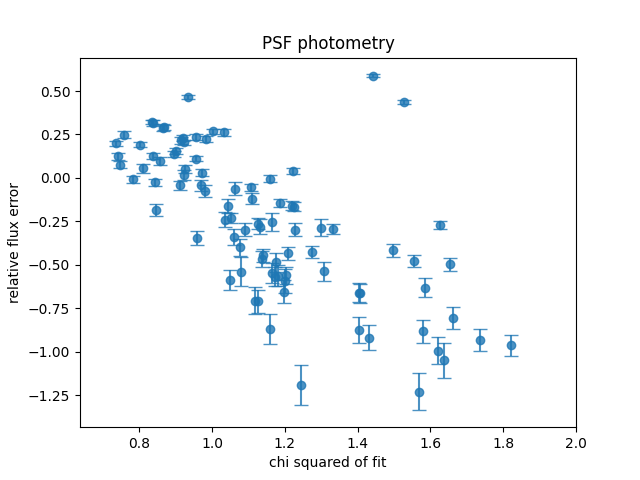

In [105]:
# flux error vs chisq
psf_flux_error = flux_error_psf()
plt.figure(clear=True)
# plt.scatter(np.log10(det_map['FLUX']),flux_error_psf())
plt.errorbar(det_map['chipsf'],psf_flux_error[0],yerr=psf_flux_error[1],fmt='o',capsize=5,alpha=0.8)
# plt.axhline(0,linewidth=1,linestyle='--',color='k',alpha=0.8)
# plt.axhline(0.1,linewidth=1,linestyle='--',color='r',alpha=0.8)
# plt.axhline(-0.1,linewidth=1,linestyle='--',color='r',alpha=0.8)
plt.title('PSF photometry')
plt.xlabel('chi squared of fit')
plt.ylabel('relative flux error')
plt.xlim([min(det_map['chipsf'])-0.1,2])
save = False
name = 'flux_error_psf_chisq_clip'
if save:
    # plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath('detection.eps'),format='eps')
    plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.png'),dpi=300)
    with open(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.mpl.pkl'), 'wb') as file:
        pickle.dump(plt.gcf(),file)
plt.show()

/var/folders/n1/nl_dwlrx4v9_6j5wdwq5xnwh0000gn/T/ipykernel_34024/821253688.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(clear=True)


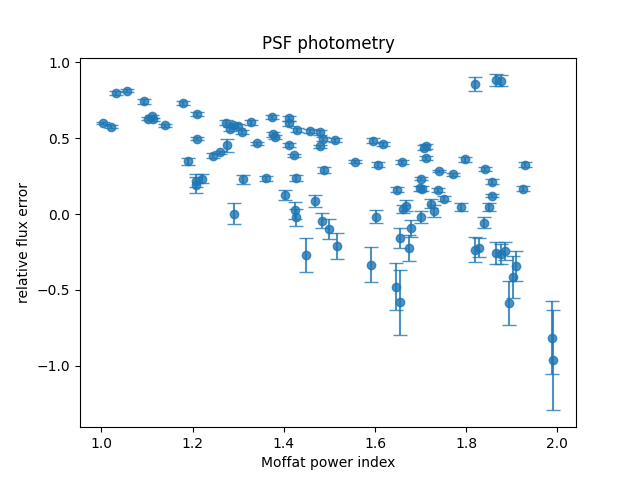

In [47]:
name = 'flux_error_psf_moffat_power_index'
psf_flux_error = flux_error_psf(det_map,PHOTUTILS_KEYS)
plt.figure(clear=True)
plt.errorbar(det_map['alpha'],psf_flux_error[0],yerr=psf_flux_error[1],fmt='o',capsize=5,alpha=0.8)
# plt.xscale('log',base=10) 
plt.title('PSF photometry')
plt.xlabel('Moffat power index')
plt.ylabel('relative flux error')
save = True
if save:
    # plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath('detection.eps'),format='eps')
    plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.png'),dpi=300)
    with open(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.mpl.pkl'), 'wb') as file:
        pickle.dump(plt.gcf(),file)
plt.show()

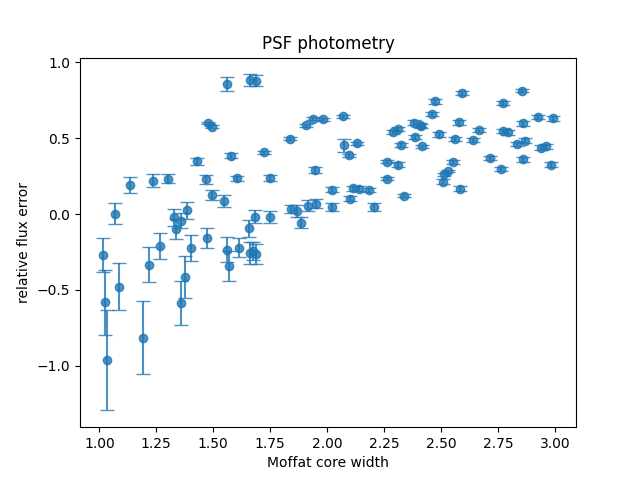

In [46]:
name = 'flux_error_psf_moffat_core_width'
psf_flux_error = flux_error_psf(det_map,PHOTUTILS_KEYS)
plt.figure(clear=True)
plt.errorbar(det_map['gamma'],psf_flux_error[0],yerr=psf_flux_error[1],fmt='o',capsize=5,alpha=0.8)
# plt.xscale('log',base=10) 
plt.title('PSF photometry')
plt.xlabel('Moffat core width')
plt.ylabel('relative flux error')
save = True
if save:
    # plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath('detection.eps'),format='eps')
    plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.png'),dpi=300)
    with open(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.mpl.pkl'), 'wb') as file:
        pickle.dump(plt.gcf(),file)
plt.show()

### Aperture flux error

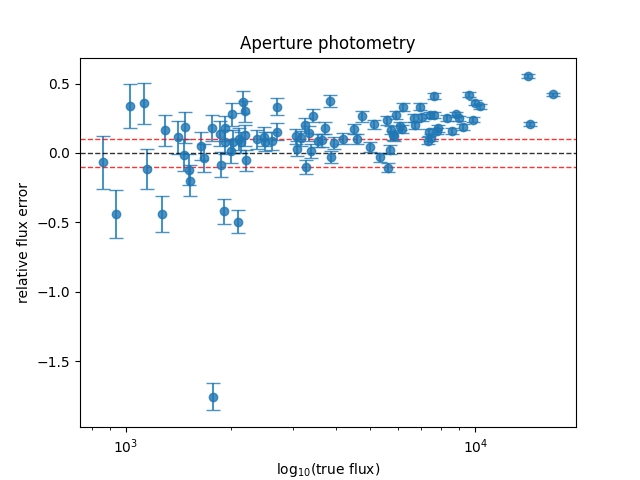

In [35]:
aper_flux_error = flux_error_aper()
plt.figure(clear=True)
# plt.scatter(np.log10(det_map['FLUX']),flux_error_psf())
plt.errorbar(det_map['FLUX'],aper_flux_error[0],yerr=aper_flux_error[1],fmt='o',capsize=5,alpha=0.8)
plt.xscale('log',base=10) 
# plt.yscale('log',base=10) 
plt.axhline(0,linewidth=1,linestyle='--',color='k',alpha=0.8)
plt.axhline(0.1,linewidth=1,linestyle='--',color='r',alpha=0.8)
plt.axhline(-0.1,linewidth=1,linestyle='--',color='r',alpha=0.8)
plt.title('Aperture photometry')
plt.xlabel('log$_{10}$(true flux)')
plt.ylabel('relative flux error')
save = True
name = 'flux_error_aper'
if save:
    # plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath('detection.eps'),format='eps')
    plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.png'),dpi=300)
    with open(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.mpl.pkl'), 'wb') as file:
        pickle.dump(plt.gcf(),file)
plt.show()

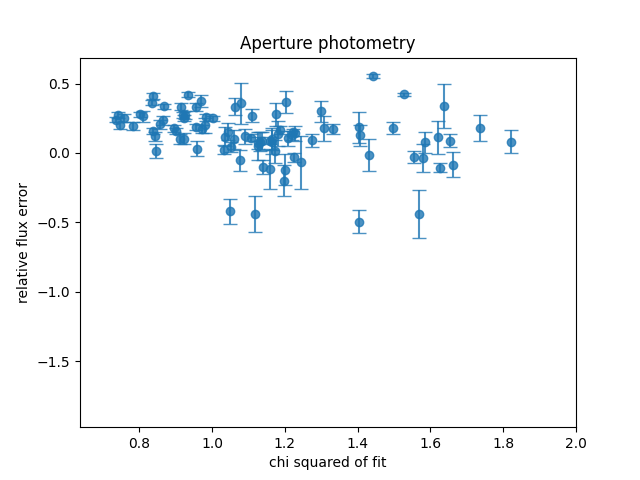

In [110]:
aper_flux_error = flux_error_aper()
plt.figure(clear=True)
# plt.scatter(np.log10(det_map['FLUX']),flux_error_psf())
plt.errorbar(det_map['chipsf'],aper_flux_error[0],yerr=aper_flux_error[1],fmt='o',capsize=5,alpha=0.8)
# plt.axhline(0,linewidth=1,linestyle='--',color='k',alpha=0.8)
# plt.axhline(0.1,linewidth=1,linestyle='--',color='r',alpha=0.8)
# plt.axhline(-0.1,linewidth=1,linestyle='--',color='r',alpha=0.8)
plt.title('Aperture photometry')
plt.xlabel('chi squared of fit')
plt.ylabel('relative flux error')
plt.xlim([min(det_map['chipsf'])-0.1,2])
save = True
name = 'flux_error_aper_chisq_clip'
if save:
    # plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath('detection.eps'),format='eps')
    plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.png'),dpi=300)
    with open(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.mpl.pkl'), 'wb') as file:
        pickle.dump(plt.gcf(),file)
plt.show()

### Distance

In [49]:
# check what the shifted column names are
shift = psf_shift()
plt.figure(clear=True)
# plt.scatter(np.log10(det_map['FLUX']),flux_error_psf())
plt.errorbar(shift[0],psf_flux_error[0],yerr=psf_flux_error[1],fmt='o',capsize=5,alpha=0.8)
# plt.axhline(0,linewidth=1,linestyle='--',color='k',alpha=0.8)
# plt.axhline(0.1,linewidth=1,linestyle='--',color='r',alpha=0.8)
# plt.axhline(-0.1,linewidth=1,linestyle='--',color='r',alpha=0.8)
plt.title('PSF photometry')
plt.xlabel('psf fitting shift')
plt.ylabel('relative flux error')
save = False
name = 'flux_error_psf_chisq'
if save:
    # plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath('detection.eps'),format='eps')
    plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.png'),dpi=300)
    with open(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.mpl.pkl'), 'wb') as file:
        pickle.dump(plt.gcf(),file)
plt.show()

KeyError: 'xshift'

In [50]:
dist = det_dist()
counts, bins = np.histogram(dist,bins=30)
plt.figure(clear=True)
plt.stairs(counts, bins)
plt.title('Source detection')
plt.ylabel('number of detections')
plt.xlabel('cartesian distance between true and detected')
name = 'source_det'
save = False
if save:
    # plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath('detection.eps'),format='eps')
    plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.png'),dpi=300)
    with open(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.mpl.pkl'), 'wb') as file:
        pickle.dump(plt.gcf(),file)
plt.plot()

KeyError: 'xpos'

[]

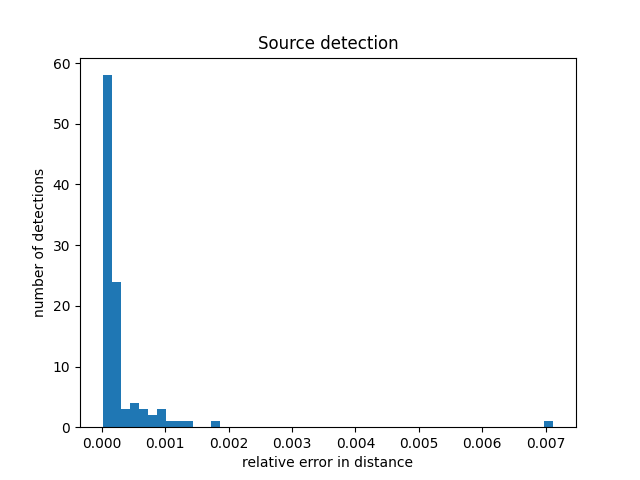

In [62]:
name = 'source_det_error'
dist_error = det_error('x_fit','y_fit',tag='')
counts, bins = np.histogram(dist_error[0],bins=50)
plt.figure(clear=True)
plt.stairs(counts, bins, fill=True)
plt.title('Source detection')
plt.ylabel('number of detections')
plt.xlabel('relative error in distance')
save = True
if save:
    # plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath('detection.eps'),format='eps')
    plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.png'),dpi=300)
    with open(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.mpl.pkl'), 'wb') as file:
        pickle.dump(plt.gcf(),file)
plt.plot()

[]

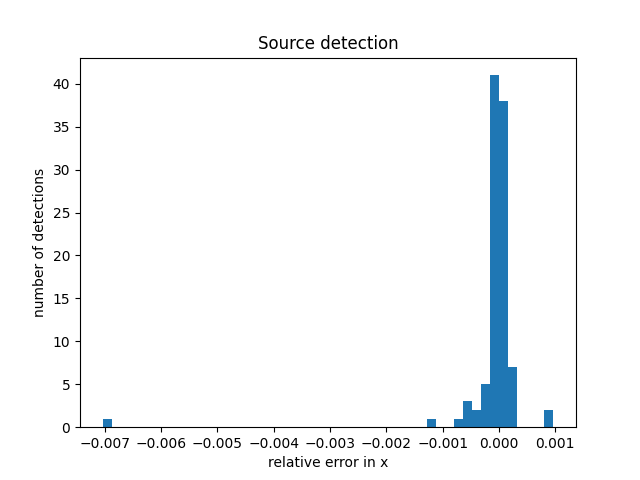

In [31]:
name = 'source_det_error_x'
dist_error = det_error('x_fit','y_fit',tag='')
counts, bins = np.histogram(dist_error[1],bins=50)
plt.figure(clear=True)
plt.stairs(counts, bins, fill=True)
plt.title('Source detection')
plt.ylabel('number of detections')
plt.xlabel('relative error in x')
save = True
if save:
    # plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath('detection.eps'),format='eps')
    plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.png'),dpi=300)
    with open(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.mpl.pkl'), 'wb') as file:
        pickle.dump(plt.gcf(),file)
plt.plot()

[]

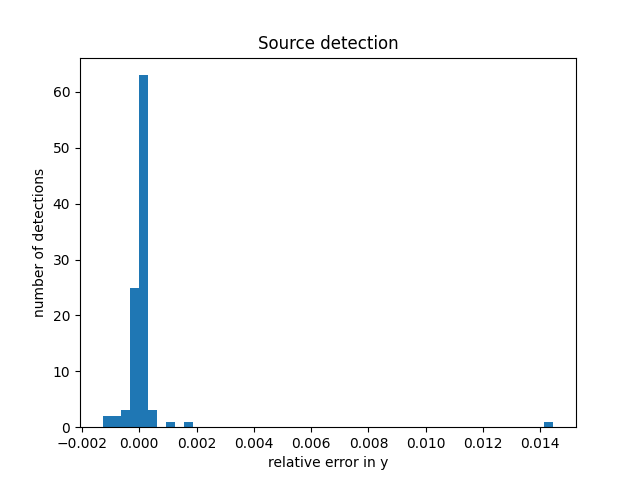

In [32]:
name = 'source_det_error_y'
dist_error = det_error('x_fit','y_fit',tag='')
counts, bins = np.histogram(dist_error[2],bins=50)
plt.figure(clear=True)
plt.stairs(counts, bins, fill=True)
plt.title('Source detection')
plt.ylabel('number of detections')
plt.xlabel('relative error in y')
save = True
if save:
    # plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath('detection.eps'),format='eps')
    plt.savefig(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.png'),dpi=300)
    with open(Path(OUTPUT_DIRS['RES']).joinpath(f'{name}.mpl.pkl'), 'wb') as file:
        pickle.dump(plt.gcf(),file)
plt.plot()

### Score

In [179]:
def get_detection_score(src_table,det_map):
    score = len(det_map)/len(src_table)
    return score
    
def get_score(src_table,det_map,delta=0):
    score = delta*get_detection_score(src_table,det_map)
    return score 

get_score(src_table=true_table,det_map=det_map,delta=1)

0.92

In [80]:
bintable = Fits('/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_0/background/img_base+noise_poiss+noise_gauss.cat')
bintable.read(2)
bintable.bin_table2(2)

Filename: /Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_0/background/img_base+noise_poiss+noise_gauss.cat
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       4   ()      
  1  LDAC_IMHEAD    1 BinTableHDU     12   1R x 1C   [5520A]   
  2  LDAC_OBJECTS    1 BinTableHDU    100   5R x 24C   [1E, 1E, 1E, 1E, 1D, 1D, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1I, 1E, 1E, 1E, 1E, 1E, 1E, 1E]   
HDU 0 is not float
HDU 2 is not float


X_IMAGE,Y_IMAGE,ELONGATION,ELLIPTICITY,XWIN_IMAGE,YWIN_IMAGE,ERRAWIN_IMAGE,ERRBWIN_IMAGE,FLUX_RADIUS,FWHM_WORLD,FWHM_IMAGE,FLUX_AUTO,FLUXERR_AUTO,FLUX_MAX,MAG_AUTO,MAGERR_AUTO,FLAGS,BACKGROUND,CLASS_STAR,FLUX_APER,FLUXERR_APER,MAG_APER,MAGERR_APER,SNR_WIN
float32,float32,float32,float32,float64,float64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,int16,float32,float32,float32,float32,float32,float32,float32
66.516464,41.93409,1.5654945,0.36122423,67.6245313773273,38.041068643503934,0.08708642,0.08465078,6.995054,21.43333,21.43333,45112.75,517.29987,238.80919,-11.635748,0.012452968,10,30.3792,0.055637103,2745.5479,107.49241,-8.596573,0.042518564,96.49037
39.291092,18.72668,1.0344397,0.033293128,39.51547847326394,18.614483781201464,0.0846098,0.08452845,3.1511896,8.746954,8.746954,9568.215,228.8101,182.04933,-9.952077,0.02597013,0,30.3792,0.0558279,2135.8972,101.50374,-8.323951,0.05160972,44.399952
62.71969,74.1131,1.0323219,0.031309962,62.89970775245436,74.37076713521128,0.08979625,0.08966139,4.5529194,11.740971,11.740971,18429.188,328.2448,180.71603,-10.663766,0.019342896,0,30.3792,0.050999615,2116.0273,102.228645,-8.313803,0.05246639,60.143833
97.68596,55.019955,1.4792118,0.3239643,96.48258809375763,55.098815037549365,0.09241163,0.08667163,3.4989572,11.093497,11.093497,10610.827,237.91934,175.01685,-10.064373,0.024350638,24,30.3792,0.0004012098,1938.7802,101.015724,-8.218822,0.056583554,45.465935
3.9967313,82.495705,1.1782985,0.15131861,4.749926702222542,82.51148102146185,0.09463608,0.092382565,2.9258237,8.377298,8.377298,6964.0938,197.61954,150.43279,-9.6071615,0.030817335,16,30.3792,0.05594763,1712.8832,98.7429,-8.084319,0.062604845,37.2927


Filename: /Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_0/raw/img_base+noise_poiss+noise_gauss.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      14   (100, 100)   float64   


/var/folders/n1/nl_dwlrx4v9_6j5wdwq5xnwh0000gn/T/ipykernel_97330/2767716287.py:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


<Axes: title={'center': 'raw/img_base+noise_poiss+noise_gauss.fits'}, xlabel='x pixel', ylabel='y pixel'>

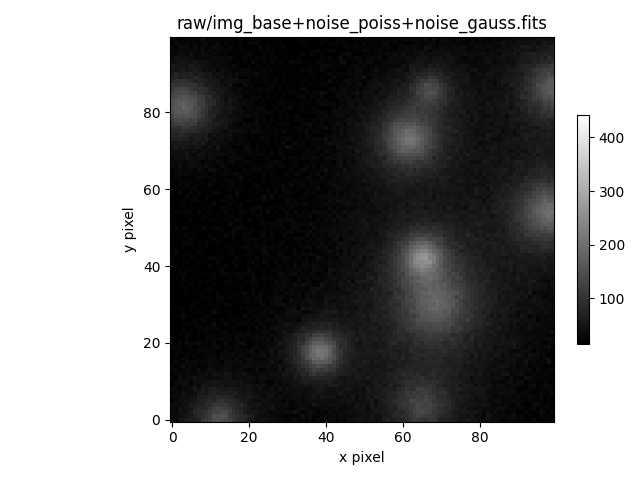

In [98]:
src_img = Fits('/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_0/raw/img_base+noise_poiss+noise_gauss.fits')
src_img.image()

Filename: /Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_0/background/img_base+noise_poiss+noise_gauss.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      23   (100, 100)   float32   
Filename: /Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_0/psf_model/img_base+noise_poiss+noise_gauss.cat
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       4   ()      
  1  LDAC_IMHEAD    1 BinTableHDU     12   1R x 1C   [5920A]   
  2  LDAC_OBJECTS    1 BinTableHDU    125   5R x 30C   [1D, 1D, 1E, 1E, 1E, 1E, 1D, 1D, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1E, 1I, 1E, 1E, 7E, 7E, 7E, 7E, 1681E, 1E]   
HDU 0 is not float
HDU 2 is not float


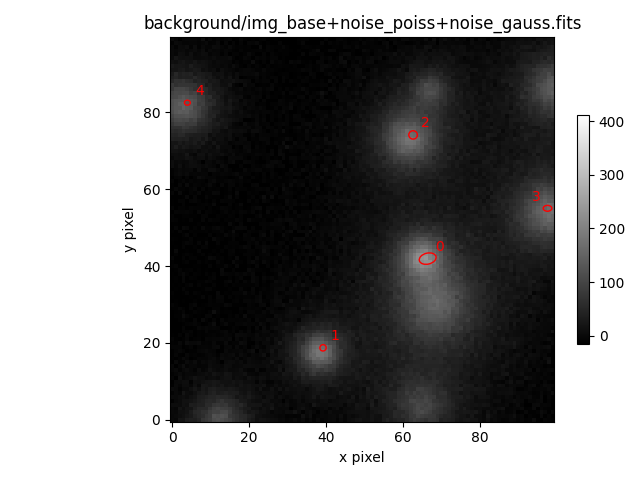

In [97]:
bkg_sub = Fits('/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_0/background/img_base+noise_poiss+noise_gauss.fits')
bkg_sub.image()
bkg_sub.mark_from_cat('/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_0/psf_model/img_base+noise_poiss+noise_gauss.cat',keys=SEX_SRC_KEYS,save=True)

In [100]:
bkg_sub = Fits('/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_0/background/img_base+noise_poiss+noise_gauss.fits')
bkg_sub.header[0]

Filename: /Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_0/background/img_base+noise_poiss+noise_gauss.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      23   (100, 100)   float32   


SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                  -32 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                  100                                                  
NAXIS2  =                  100                                                  
EXTEND  =                    T                                                  
OBSCLASS= 'science '                                                            
TARGET  = 'science '                                                            
DATE-OBS= '2024-01-05 11:18:32.819524'                                          
COADDS  =                    1                                                  
GAIN    =                    1                                                  
CALSTEPS= 'load,sextractorbkgsubtractor,'                                       
PROCFAIL= ''                

# Simulation

In [16]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

import scopesim as sim
from scopesim_templates.stellar import stars, star_grid

In [ ]:
local_package_folder = os.path.join(ROOT_DIR,'inst_pkgs')
sim.download_packages(["Armazones", "ELT", "MICADO", "MORFEO"])

## `photutils`

In [98]:
from photutils.datasets import load_star_image
from photutils.datasets import (
    make_random_gaussians_table,
    make_gaussian_sources_image,
    make_noise_image,
    make_random_models_table,
    make_model_sources_image
)
from astropy.modeling.models import Moffat2D, Gaussian2D, Moffat1D

In [10]:
def get_img_name():
    return _ih[-1].split('#- image')[1].split('#! image')[0].split('=')[-1].strip()

def get_img_path(name):
    return os.path.join(SIM_SUBDIR,f"img_{name}.fits")

def get_img_prams():
    return _ih[-1]

def save_image_prams(name):
    with open(f"{get_img_path(name)}.params",'w') as file:
        file.write(get_img_prams())

def save_src_table(name,table):
    path = os.path.abspath(f"{get_img_path(name)}.ecsv")
    table.write(path, overwrite=True)
    
def load_src_table(name):
    path = os.path.abspath(f"{get_img_path(name)}.ecsv")
    return QTable.read(path)

In [36]:
hdu = load_star_image()  
fits_file = MakeFits(hdu.data,IMG_PATH,overwrite=True)

Filename: /Users/astqx/Desktop/DREAMS/test/pipeline/phot/sim/photutils.datasets/sim_0/photutils.datasets/sim_0/img_0.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       6   (1059, 1059)   int16   


<Axes: title={'center': 'sim_0/img_0.fits'}, xlabel='x pixel', ylabel='y pixel'>

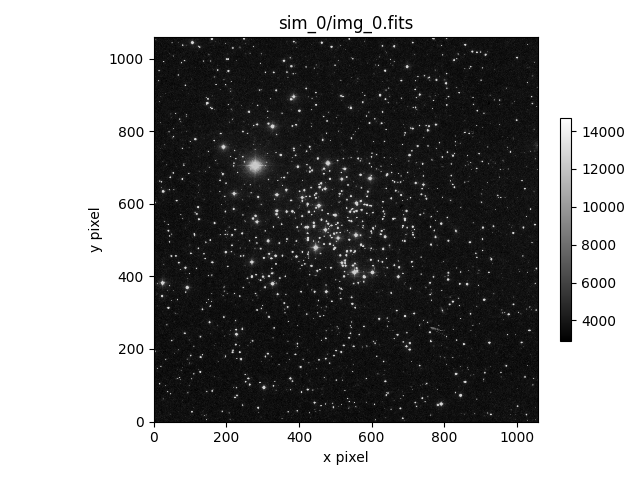

In [41]:
fits_obj = Fits(IMG_PATH)
fits_obj.image()

### gaussian sources

In [ ]:
SIM = 'photutils.datasets'
SIM_ID = 'gaussian_sources'
SIM_SUBDIR = os.path.join(ROOT_DIR,SIM_DIR,SIM,'sim_'+SIM_ID)
os.makedirs(SIM_SUBDIR, exist_ok=True)

Filename: /Users/astqx/Desktop/DREAMS/test/pipeline/phot/sim/photutils.datasets/sim_gaussian_sources/img_base+noise_poiss.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       6   (500, 500)   float64   


<Axes: title={'center': 'sim_gaussian_sources/img_base+noise_poiss.fits'}, xlabel='x pixel', ylabel='y pixel'>

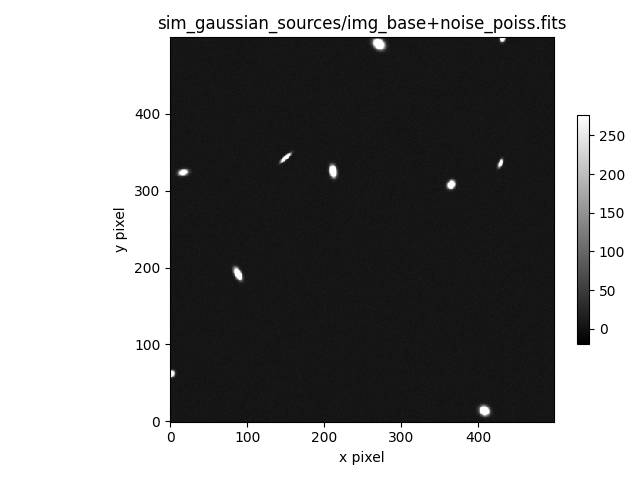

In [125]:
n_sources = 10
param_ranges = {'amplitude': [500, 1000],
                'x_mean': [0, 500],
                'y_mean': [0, 500],
                'x_stddev': [1, 5],
                'y_stddev': [1, 5],
                'theta': [0, np.pi]}
src_table = make_random_gaussians_table(n_sources, param_ranges, seed=0)
shape = (param_ranges['x_mean'][-1], param_ranges['y_mean'][-1])
base = make_gaussian_sources_image(shape, src_table)
noise_gauss = make_noise_image(shape,distribution='gaussian',mean=5., stddev=5.)
noise_poiss = make_noise_image(shape, distribution='poisson',mean=5.)

#- image
image = base+noise_poiss
#! image

name = get_img_name()
save_image_prams(name)
save_src_table(name,src_table)
fits_file = MakeFits(image, get_img_path(name), overwrite=True)
fits_obj = Fits(get_img_path(name))
fits_obj.image()

### model sources

In [23]:
SIM = 'photutils.datasets'
SIM_ID = TEST_ID
SIM_SUBDIR = os.path.join(ROOT_DIR,SIM_DIR,SIM,'sim_'+SIM_ID)
os.makedirs(SIM_SUBDIR, exist_ok=True)

amplitude,y_0,x_0,gamma,alpha
float64,float64,float64,float64,float64
138.5355583899011,611.0112149225043,871.7604792424539,1.723183464067852,1.2599511700020156
160.00251028994805,684.3383664469429,471.3294930181824,2.773382803668179,1.4572735414931803
109.96368964242448,977.4633430668724,116.0444498715909,2.098520981930891,1.4230705276115927
113.21491250541402,519.4343471623808,697.4014559160586,1.0668208332020517,1.2901790403104474
167.48538006232104,781.2039344560502,36.992597105230175,2.9820768769788035,1.9290856267109233
183.28813341280778,810.7032239033094,909.9516502732544,2.182214731221424,1.7390387786378751
135.66913396455183,59.50099106693452,78.70944985880412,1.9075982378720402,1.1384568568171785
105.31020158835928,136.72077494027312,12.70954154466397,1.9833532321792986,1.1127870721931572
199.87362289762845,549.2320116944077,579.0132225581766,1.6878925041481687,1.8765294390489144


Filename: /Users/astqx/Desktop/DREAMS/test/pipeline/phot/sim/photutils.datasets/sim_moffat_1/img_Moffat2D_100_1000x1000_gamma_1-3_alpha_1-2.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      14   (1000, 1000)   float64   


SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                  -64 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                 1000                                                  
NAXIS2  =                 1000                                                  
EXTEND  =                    T                                                  
OBSCLASS= 'science '                                                            
TARGET  = 'science '                                                            
DATE-OBS= '2024-01-09 11:58:44.091041'                                          
COADDS  =                    1                                                  
GAIN    =                    1                                                  
CALSTEPS= ''                                                                    
PROCFAIL= ''                

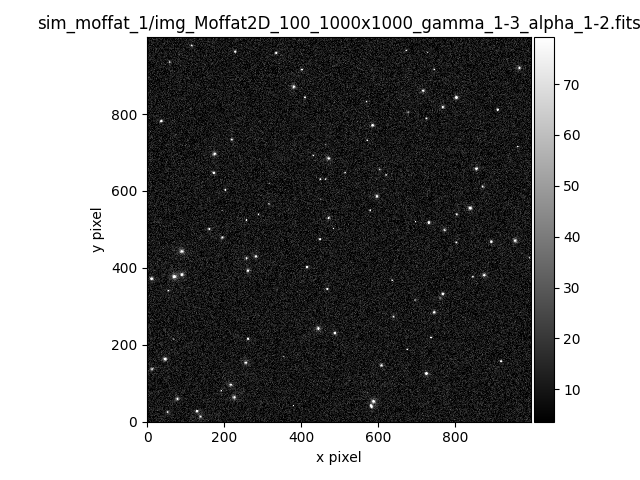

In [40]:
n_sources = 100
shape = (1000,1000)
param_ranges = {'amplitude': [100, 200],
                'y_0': [0, shape[0]],
                'x_0': [0, shape[1]],
                'gamma': [1, 3],
                'alpha': [1, 2]}
seed = 653
src_table = make_random_models_table(n_sources, param_ranges, seed=seed)
display(src_table)
# model = Gaussian2D()
model = Moffat2D()
base = make_model_sources_image(shape, model, src_table)
noise_gauss = make_noise_image(shape,distribution='gaussian',mean=5., stddev=5., seed=seed)
noise_poiss = make_noise_image(shape, distribution='poisson',mean=5., seed=seed)

#- image
image = base+noise_gauss+noise_poiss
#! image

# name = get_img_name()
# ! no comma in name, breaks command line calls in mirar
name = f"{model.__class__.__name__}\
_{n_sources}_{shape[0]}x{shape[1]}\
_gamma_{str(param_ranges['gamma']).replace(', ','-')[1:-1]}\
_alpha_{str(param_ranges['alpha']).replace(', ','-')[1:-1]}\
"
save_image_prams(name)
save_src_table(name,src_table)
base_file = MakeFits(base, get_img_path(name)+'.base', overwrite=True)
noise_gauss_file = MakeFits(noise_gauss, get_img_path(name)+'.noise_gauss', overwrite=True)
noise_poiss_file = MakeFits(noise_poiss, get_img_path(name)+'.noise_poiss', overwrite=True)
fits_file = MakeFits(image, get_img_path(name), overwrite=True)
fits_obj = Fits(get_img_path(name))
ax = fits_obj.image()
fits_obj.header[0]

'Moffat2D'

In [155]:
x_offset = 2
y_offset = 2
radius = 2
for i, (x,y) in enumerate(zip(src_table['x_0'], src_table['y_0'])):
    marker = plt.Circle((x,y),2,color='r',fill=None)
    ax.add_patch(marker)
    if x+x_offset >= shape[0]-x_offset*2:
        ax.annotate(str(i),(x-x_offset-radius,y+y_offset),color='r')
    else:  
        ax.annotate(str(i),(x+x_offset,y+y_offset),color='r')
# plt.savefig(get_img_path(name)+'.png',dpi=300)

In [ ]:
def make_cutouts(pos,half_size):
    shape = (100,100)
    data = np.ones(shape)
    x_image_size,y_image_size = shape
    print(pos)
    x,y = pos
    data[y][x] = 2
    
    pad_x = [0,0]
    pad_y = [0,0]
    crop_y = [y - half_size, y + half_size + 1]
    crop_x = [x - half_size, x + half_size + 1]

    print(crop_x,crop_y)

    if crop_x[0] < 0:
        pad_x[0] = -crop_x[0]
        crop_x[0] = 0
        
    if crop_y[0] < 0:
        pad_y[0] = -crop_y[0]
        crop_y[0] = 0

    if crop_x[1] > x_image_size:
        pad_x[1] = crop_x[1] - x_image_size
        crop_x[1] = x_image_size    

    if crop_y[1] > y_image_size:
        pad_y[1] = crop_y[1] - y_image_size
        crop_y[1] = y_image_size

    print(crop_x,crop_y)
    print(pad_x,pad_y)

    cutout = np.pad(
        data[slice(*crop_y), slice(*crop_x)], 
        (pad_y, pad_x), 
        "constant"
    )

    plt.figure(clear=True)
    im = plt.imshow(cutout)
    plt.colorbar(im)
    title = f"data: {data.shape}, pos: {pos}, half_size: {half_size}"
    plt.title(title)
    save_dir = Path('/Users/astqx/Desktop/DREAMS/make_cutouts_test')
    plt.savefig(save_dir.joinpath(title.strip()+'.png'),dpi=300)
    plt.show()

half_sizes = [40,100]
positions = [(10,10),(50,50),(80,80),(10,80),(80,10),(10,50),(80,50),(50,10),(50,80)]
for half_size in half_sizes:
    for pos in positions:
        make_cutouts(pos,half_size)

In [29]:
def moffat2d(x, y, A, x0, y0, alpha, gamma):
    """
    Compute the value of the function f(x, y) = A * (1 + ((x - x0)**2 + (y - y0)**2) / gamma**2)**(-alpha)
    
    Parameters:
    x, y: float - coordinates
    A: float - Amplitude of the model.
    x0, y0: float - position of the maximum of the Moffat model.
    alpha: Power index of the Moffat model.
    gamma: Core width of the Moffat model.
    
    Returns:
    float: computed value of f(x, y)
    """
    return A * (1 + ((x - x0)**2 + (y - y0)**2) / gamma**2)**(-alpha)

def create_circular_mask(dim,prec,radius):
    # ref: https://stackoverflow.com/a/44874588/14094985
    dim_prec = np.asarray(dim)/prec
    center = dim_prec/2
    X,Y = np.ogrid[:dim_prec[0], :dim_prec[1]]
    dist_from_center = np.sqrt((X-center[0])**2 + (Y-center[1])**2)
    mask = dist_from_center <= radius/prec
    return mask
    

In [48]:
model = Moffat2D(amplitude=1,alpha=2,gamma=3)

def gfun(x):
    return -radius

def hfun(x):
    return radius

row = true_table[true_table['NUMBER'] == 84]
amplitude = row['amplitude'] 
alpha = row['alpha'] 
gamma = row['gamma']
# fwhm = 2*model.gamma.value*np.sqrt(2**(1/model.alpha.value) - 1)
fwhm = row['FWHM_IMAGE']
radius = 10*fwhm

dblquad(moffat2d,-radius,radius,gfun,hfun,args=(amplitude,0,0,alpha,gamma))

(3101.3412761862774, 4.894341930017365e-06)

In [47]:
# model = Moffat2D(amplitude=100,alpha=2,gamma=3)
model = Moffat2D(amplitude=1,alpha=2,gamma=3)

# fwhm = 2*model.gamma.value*np.sqrt(2**(1/model.alpha.value) - 1)
# radius = 10*fwhm

halfsize = radius
prec = 0.1
x = np.arange(-halfsize,halfsize,prec)
y = np.arange(-halfsize,halfsize,prec)

X,Y = np.meshgrid(x,y)
# Z = moffat2d(X,Y,A=model.amplitude.value,x0=0,y0=0,alpha=model.alpha.value,gamma=model.gamma.value)
Z = moffat2d(X,Y,A=amplitude,x0=0,y0=0,alpha=alpha,gamma=gamma)

mask = create_circular_mask((halfsize*2,halfsize*2),prec,radius=radius)
Z[~mask] = 0

np.sum(Z)*prec**2

# fig, ax = plt.subplots(subplot_kw={"projection": "3d"})
# surf = ax.plot_surface(X,Y,Z,cmap='magma')
# plt.show()

# plt.figure(clear=True)
# plt.plot(x,Z[int(halfsize/prec)])
# plt.show()

# plt.figure(clear=True)
# plt.imshow(mask)
# plt.show()

/var/folders/n1/nl_dwlrx4v9_6j5wdwq5xnwh0000gn/T/ipykernel_79127/524288812.py:9: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  x = np.arange(-halfsize,halfsize,prec)
/var/folders/n1/nl_dwlrx4v9_6j5wdwq5xnwh0000gn/T/ipykernel_79127/524288812.py:10: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y = np.arange(-halfsize,halfsize,prec)


3091.093004444279

/var/folders/n1/nl_dwlrx4v9_6j5wdwq5xnwh0000gn/T/ipykernel_79127/3108038976.py:4: RuntimeWarning: divide by zero encountered in log10
  plt.plot(x,np.log10(x))
/var/folders/n1/nl_dwlrx4v9_6j5wdwq5xnwh0000gn/T/ipykernel_79127/3108038976.py:5: RuntimeWarning: divide by zero encountered in log
  plt.plot(np.log(x),np.log10(x))
/var/folders/n1/nl_dwlrx4v9_6j5wdwq5xnwh0000gn/T/ipykernel_79127/3108038976.py:5: RuntimeWarning: divide by zero encountered in log10
  plt.plot(np.log(x),np.log10(x))


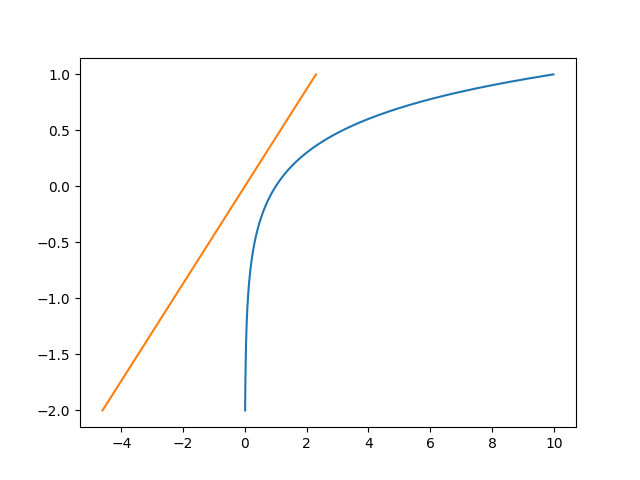

In [255]:
x = np.arange(0,10,0.01)

plt.figure(clear=True)
plt.plot(x,np.log10(x))
plt.plot(np.log(x),np.log10(x))
plt.show()

In [11]:
shape = (1000,1000)
noise_gauss1 = make_noise_image(shape,distribution='gaussian',mean=5., stddev=5.)
noise_gauss2 = make_noise_image(shape,distribution='gaussian',mean=5., stddev=5.)

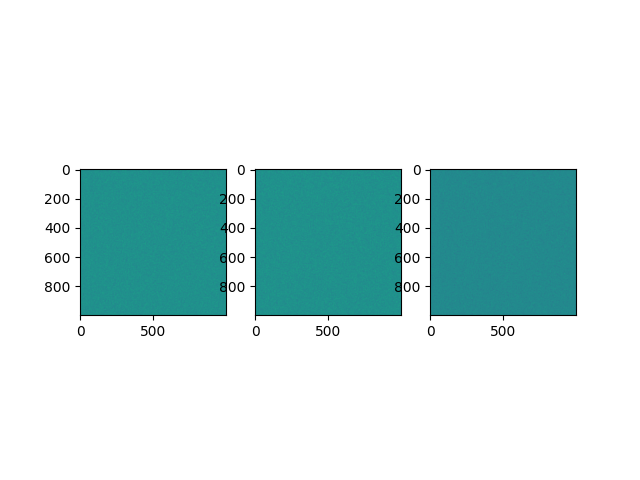

In [94]:
fig, ax = plt.subplot_mosaic('abc')
ax['a'].imshow(noise_gauss1)
ax['b'].imshow(noise_gauss2)
ax['c'].imshow(noise_gauss2-noise_gauss1)
plt.show()

In [96]:
np.std(noise_gauss2-noise_gauss1)

7.065989601470437

In [19]:
obj = MakeFits(
    noise_gauss1,
    '/Users/astqx/Desktop/DREAMS/test/pipeline/phot/sim/photutils.datasets/test_error.fits',
    obsclass="error",
    overwrite=True,
)


Filename: /Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_with_err_calc/raw/test_error.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      14   (1000, 1000)   float64   


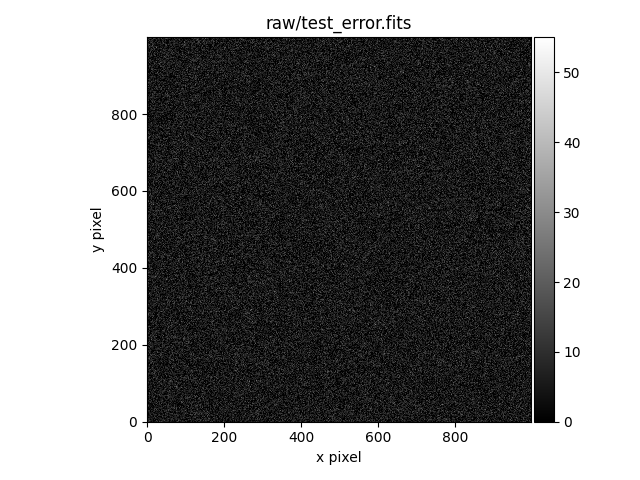

In [28]:
mask = Fits('/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_with_err_calc/raw/test_error.fits')
mask.image()
mask.header[0]
plt.savefig('/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_with_err_calc/raw/test_error.png',dpi=300)

In [37]:
np.all(mask.data[0] == 1)

True

# Images :)

Filename: /Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_0/psf_model/img_Moffat2D_gamma_1-3_alpha_1-2.psfmodel
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       6   (41, 41)   float32   


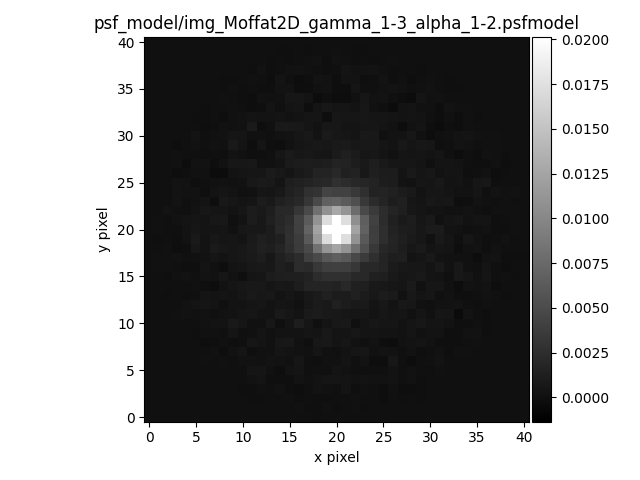

In [41]:
filepath = '/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_0/psf_model/img_Moffat2D_gamma_1-3_alpha_1-2.psfmodel'
img = Fits(filepath)
# img.read(8)
img.image()
# ax = plt.gca()
# ax.set_xlabel('')
# ax.set_ylabel('')
# header = img.header[0]
# display(header)
# plt.title()
# plt.tight_layout(pad=0)
# plt.savefig(filepath.replace('fz','png'),dpi=300)
plt.savefig(filepath+'.png',dpi=300)

In [21]:
np.mean(img.data[0][~np.isnan(img.data[0])])

8554.300991035487

In [11]:
img.header[8]

XTENSION= 'IMAGE   '           / Extension first keyword (see SIMPLE)           
BITPIX  =                   16 / # of bits storing pix values                   
NAXIS   =                    2 / # of axes in frame                             
NAXIS1  =                 2144 / # pixels/axis                                  
NAXIS2  =                 4200 / # pixels/axis                                  
PCOUNT  =                    0 / Number of parameters per group                 
GCOUNT  =                    1 / Number of groups                               
EXTNAME = 'ESO_CCD_#76'                 / Extension name                        
ORIGIN  = 'ESO-PARANAL'        / European Southern Observatory                  
DATE    = '2022-04-02T04:37:44.109'     / UT date when this file was written    
CTYPE1  = 'RA---TAN'           / Pixel coordinate system                        
CTYPE2  = 'DEC--TAN'           / Pixel coordinate system                        
CRPIX1  =                215

In [12]:
header

SIMPLE  =                    T          / Standard FITS format (NOST-100.0)     
BITPIX  =                   16          / # of bits storing pix values          
NAXIS   =                    0          / # of axes in frame                    
EXTEND  =                    T / Extension may be present                       
ORIGIN  = 'ESO-PARANAL'                 / European Southern Observatory         
DATE    = '2022-04-02T04:37:44.109'     / UT date when this file was written    
TELESCOP= 'ESO-VST '                    / ESO Telescope Name                    
INSTRUME= 'OMEGACAM'                    / Instrument used.                      
OBJECT  = 'NGC  4372'          / Original target.                               
RA      =           186.442090          / 12:25:46.1 RA (J2000) pointing (deg)  
DEC     =            -72.65822          / -72:39:29.5 DEC (J2000) pointing (deg)
EQUINOX =                2000.          / Standard FK5 (years)                  
RADECSYS= 'FK5     '        

# Stuff

In [ ]:
def x(
    self, 
    calc_total_error: bool = False,
    error = None,
    mask = None,
    wcs = None, # TODO: get it through the image
    localbkg_width = 20, # default 0, mirar 15 TODO: find an optimal value
                            # test 4,5 have been done with 20
                            # significant difference with 15
    apermask_method = 'correct', # default from SE config
    kron_params = [2.5, 3.5], # default from SE config
    detection_cat = None,
    progress_bar: bool = False,
    make_psf_cutouts: bool = True,
    psf_cutout_size: int = 21,
    output_sub_dir: str = "detection",
    copy_image_keywords: str | list[str] = None,
    cache: bool = False,
):

def y(
    oversampling=4,
    shape=None, # TODO: add option to obtain the shape from the cutout
    smoothing_kernel='quartic', 
    recentering_func=centroid_com, 
    recentering_maxiters=20, 
    fitter=LMLSQFitter,
    fitter_params=dict(),
    fitter_kwargs=dict(),
    maxiters=10, 
    norm_radius=5.5, 
    recentering_boxsize=(5, 5), 
    y=0.001, 
    sigma_clip=SigmaClip(
        sigma=3, 
        sigma_lower=3, 
        sigma_upper=3, 
        maxiters=10, 
        cenfunc='median', 
        stdfunc='std', 
        grow=False
    ),
    progress_bar=False, 
    fit_boxsize=5, # EPSFFitter default 
    dev = False,
    output_sub_dir: Path | str = 'psf_model',
    cache: bool = False,
):

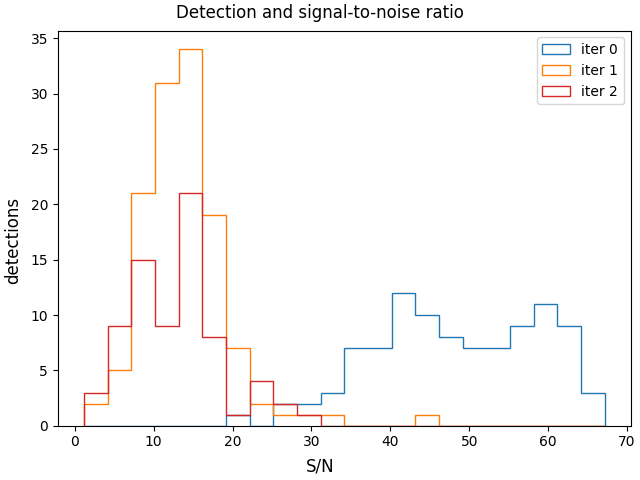

In [47]:
iter_masks = make_iter_masks(post_proc.cat_table)

# negative flux in some later iterations so abs() all
snrs = snr(
    obj = abs(post_proc.cat_table['flux_fit']),
    sky = abs(post_proc.cat_table['local_bkg']),
    npix = post_proc.cat_table['npixfit']
)

x = snrs
counts_all = []

bins=np.arange(min(x),max(x),(max(x)-min(x))//20)
for mask in iter_masks:
    counts, _ = np.histogram(x[mask],bins=bins)
    counts_all.append(counts)

fig, axs = plt.subplots(constrained_layout=True)
for i,counts in enumerate(counts_all):
    axs.hist(bins[:-1], bins, weights=counts, histtype='step', fill=False, color=iter_cmap[i], alpha=1,label=f"iter {i+1}")
fig.suptitle('Detection and signal-to-noise ratio') 
fig.supxlabel('S/N')
fig.supylabel('detections')
plt.legend()
plt.show()

In [62]:
back = load_object('/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_with_err_calc_auto_postproc_redo/background/img_Moffat2D_gamma_1-3_alpha_1-2.background.pkl')

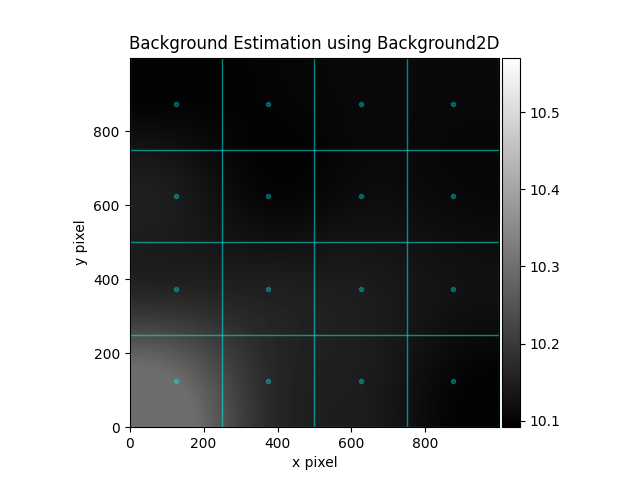

In [73]:
plt.figure(clear=True)
plot_image(data=back.background,ax=plt.gca())
back.plot_meshes(outlines=True, marker='.', color='cyan', alpha=0.3)
plt.title('Background Estimation using Background2D')
plt.xlabel('x pixel')
plt.ylabel('y pixel')
plt.savefig(OUTPUT_DIRS['RES'].joinpath('background_mesh.png'),dpi=300)
plt.show()

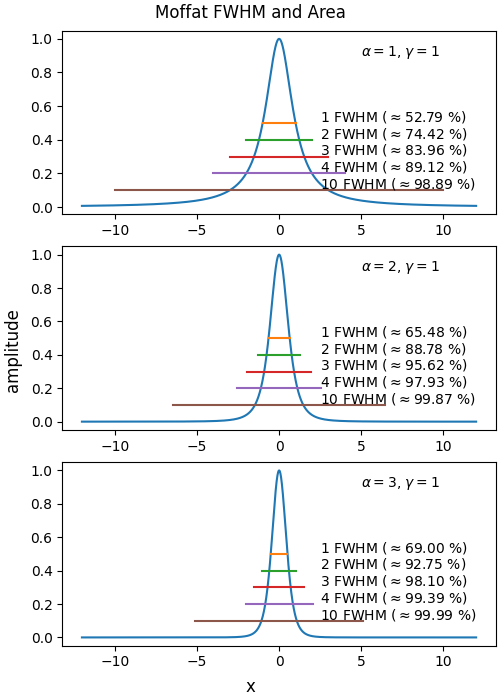

In [118]:
gamma = 1
alpha = 1
amp = 1

factors = [1,2,3,4,10]

x = np.arange(-gamma*12,gamma*12,0.01)

fig, axs = plt.subplots(ncols=1,nrows=3,constrained_layout=True,figsize=(5,7))

alphas = [1,2,3]

for i,ax in enumerate(axs):
    alpha = alphas[i]
    model = models.Moffat1D(x_0=0,amplitude=amp,gamma=gamma,alpha=alpha)
    fwhm = 2*gamma*np.sqrt(2**(1/alpha) - 1)
    total = np.sum(model(x))
    ax.plot(x,model(x))
    
    for i,fac in enumerate(factors):
        area_frac = np.sum(model(x[np.logical_and(
            x >= -fwhm*fac/2, x <= fwhm*fac/2
        )]))*100/total
        ax.plot([-fwhm*fac/2,fwhm*fac/2],[amp/2-0.1*i,amp/2-0.1*i])
        ax.text(2.5,amp/2-0.1*i+0.01,fr'{fac} FWHM ($\approx${area_frac:.2f} %)')
    ax.text(5,0.9,fr"$\alpha={alpha}$, $\gamma={gamma}$")
fig.suptitle('Moffat FWHM and Area')
fig.supxlabel('x')
fig.supylabel('amplitude')
plt.show()



In [118]:
np.sum(model(x))

249.80905447981496

In [27]:
from astropy.modeling.models import Moffat1D

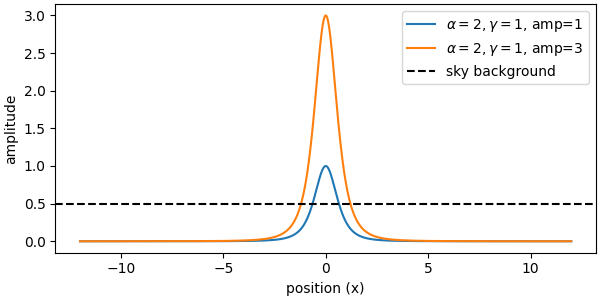

In [38]:
x = np.arange(-12,12,0.01)
plt.figure(clear=True,figsize=(6,3),constrained_layout=True)
model = Moffat1D(x_0=0,amplitude=1,gamma=1,alpha=2)
plt.plot(x,model(x),label=r'$\alpha=2, \gamma=1$, amp=1')
model = Moffat1D(x_0=0,amplitude=3,gamma=1,alpha=2)
plt.plot(x,model(x),label=r'$\alpha=2, \gamma=1$, amp=3')
plt.axhline(0.5,color='k',linestyle='--',label='sky background')
plt.xlabel('position (x)')
plt.ylabel('amplitude')
plt.legend()
plt.show()

In [173]:
QTable.read('/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_test_moffat_sub_box_11_localbkg_10_aper_subbox/catalogs/img_Moffat2D_gamma_1-3_alpha_1-2_segm_cat.ecsv')

label,xcentroid,ycentroid,sky_centroid,bbox_xmin,bbox_xmax,bbox_ymin,bbox_ymax,area,semimajor_sigma,semiminor_sigma,orientation,eccentricity,min_value,max_value,local_background,segment_flux,segment_fluxerr,kron_flux,kron_fluxerr,NUMBER,fwhm,ellipticity,elong,xpos,ypos,aimage,bimage,THETA_IMAGE,DIFFPATH,SCIPATH,REFPATH,psf_center_flat
int64,float64,float64,object,int64,int64,int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,float64,float64,float64,float64,float64,float64,float64,float64,str146,str146,str1,object
1,138.72532567845494,13.22735979052936,[],131,144,8,20,106.0,2.432866926974769,2.1968635558431666,-46.301781962457746,0.4296537469200099,0.7983223405141726,139.5556909075934,1.2325253414031692,2622.316140037072,--,3516.254979385253,--,1,5.45816884421806,0.09700628033324821,1.1074274141896006,138.72532567845494,13.22735979052936,2.432866926974769,2.1968635558431666,-46.301781962457746,/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_test_moffat_sub_box_11_localbkg_10_aper_subbox/detection/img_Moffat2D_gamma_1-3_alpha_1-2.fits,/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_test_moffat_sub_box_11_localbkg_10_aper_subbox/detection/img_Moffat2D_gamma_1-3_alpha_1-2.fits,--,[138.80525168 13.03835519]
2,129.33437698361027,27.11070742880598,[],123,136,20,34,131.0,2.4970598647649074,2.313153064924779,-67.13731673127324,0.3766622445268264,-1.9860660233997294,182.1245370923379,1.392618601718958,3977.236975186935,--,4499.400885344387,--,2,5.667730722352158,0.07364933553863462,1.0795048121236666,129.33437698361027,27.11070742880598,2.4970598647649074,2.313153064924779,-67.13731673127324,/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_test_moffat_sub_box_11_localbkg_10_aper_subbox/detection/img_Moffat2D_gamma_1-3_alpha_1-2.fits,/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_test_moffat_sub_box_11_localbkg_10_aper_subbox/detection/img_Moffat2D_gamma_1-3_alpha_1-2.fits,--,[129.2691662 27.24396042]
3,53.01740993940694,25.554718083712817,[],49,57,21,30,67.0,1.9298404891569954,1.776750700007944,-49.94250901884931,0.3903363916235459,1.7796778825612358,98.65413044870311,0.24014978857037605,1707.5298400001354,--,2429.528069441194,--,3,4.367898364720198,0.07932769055743294,1.0861627853296283,53.01740993940694,25.554718083712817,1.9298404891569954,1.776750700007944,-49.94250901884931,/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_test_moffat_sub_box_11_localbkg_10_aper_subbox/detection/img_Moffat2D_gamma_1-3_alpha_1-2.fits,/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_test_moffat_sub_box_11_localbkg_10_aper_subbox/detection/img_Moffat2D_gamma_1-3_alpha_1-2.fits,--,[53.03004886 25.31845196]
4,380.25565524019186,42.02367784724333,[],378,383,40,45,25.0,1.1986422891071633,1.0695212841743509,38.61730128357063,0.4514878198704646,2.8980199938755566,148.19411884859272,0.22507340811046198,767.37728385504,--,814.5676198005746,--,4,2.6748823251433893,0.10772271770003305,1.1207278497804662,380.25565524019186,42.02367784724333,1.1986422891071633,1.0695212841743509,38.61730128357063,/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_test_moffat_sub_box_11_localbkg_10_aper_subbox/detection/img_Moffat2D_gamma_1-3_alpha_1-2.fits,/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_test_moffat_sub_box_11_localbkg_10_aper_subbox/detection/img_Moffat2D_gamma_1-3_alpha_1-2.fits,--,[380.1794825 41.90681614]
5,78.92032495275045,59.37702630182198,[],73,85,52,66,129.0,2.570955542745993,2.425659037426778,89.64971817257899,0.33141407059863176,-1.8448291982695442,120.44882945698343,1.1149535938526047,3236.7268290359375,--,3887.1059525478704,--,5,5.885550882944056,0.05651459268876591,1.059899805816629,78.92032495275045,59.37702630182198,2.570955542745993,2.425659037426778,89.64971817257899,/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_test_moffat_sub_box_11_localbkg_10_aper_subbox/detection/img_Moffat2D_gamma_1-3_alpha_1-2.fits,/Users/astqx/Desktop/DREAMS/test/pipeline/phot/t

In [265]:
load_object('/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_test_moffat_sub_box_11_localbkg_10/results/flux_error_psf_ratio_best_qfit_snr.stats.pkl')

[[2.0, 0.028686241017644547, 0.07076925489345, 0.3783571206691467],
 [3.0, -0.05314267039951736, 0.0, 0.5039880839037697]]

In [264]:
load_object('/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_test_moffat_sub_box_11_localbkg_10_aper_subbox/results/flux_error_psf_ratio_best_qfit_snr.stats.pkl')

[[2.0, 0.0755417454174832, 0.08804194883694555, 0.35667359371532975],
 [3.0, -0.0451723077239384, 0.01618267969600322, 0.47635546490174957]]

In [189]:
t1 = QTable.read('/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_test_moffat_sub_box_11_localbkg_10/catalogs/img_Moffat2D_gamma_1-3_alpha_1-2_det_map.ecsv')
t2 = QTable.read('/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_test_moffat_sub_box_11_localbkg_10_aper_subbox/catalogs/img_Moffat2D_gamma_1-3_alpha_1-2_det_map.ecsv')

In [190]:
t1['flux_fit']-t2['flux_fit']

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


In [44]:
img = Fits('/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_fixed_model_with_crop_9px/psf_model/img_Moffat2D_gamma_1-3_alpha_1-2.psfmodel.fits')

Filename: /Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_fixed_model_with_crop_9px/psf_model/img_Moffat2D_gamma_1-3_alpha_1-2.psfmodel.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       6   (21, 21)   float64   


In [47]:
np.sum(img.data[0][7:-7,7:-7])

0.8174044384368676

In [26]:
table = QTable.read('/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_test_moffat_sub_box_11_localbkg_10_aper_subbox_kron/catalogs/img_Moffat2D_gamma_1-3_alpha_1-2_segm_cat.ecsv')

In [29]:
sigma_clipped_stats(table['segment_flux']-table['kron_flux'])

(-761.9488507460367, -599.1807843693693, 526.2731959583874)

In [31]:
print(ufloat(761.9488507460367,526.2731959583874))

(8+/-5)e+02


In [32]:
(0.053-0.045)/0.053

0.1509433962264151

In [33]:
(0.029-0.075)/0.075

-0.6133333333333334

In [38]:
a = ufloat(-0.05314267039951736, 0.5039880839037697)
b = ufloat(-0.0451723077239384, 0.47635546490174957)

In [40]:
print((a-b)/a)

0+/-12


In [41]:
load_object('/Users/astqx/Desktop/DREAMS/test/pipeline/phot/test_moffat_1/results/flux_error_psf_ratio_best_qfit_snr.stats.pkl')

[-0.27779935550756923, -0.27624134696872626, 0.420602888547741]

In [42]:
print(ufloat(-0.27779935550756923, 0.420602888547741))

-0.3+/-0.4
